In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os
import gc
import glob
import torch
import utils
from scipy.special import erf
from sklearn.calibration import calibration_curve
from sklearn.metrics import (auc, brier_score_loss, confusion_matrix,
                             mean_absolute_error, mean_squared_error,
                             precision_recall_curve, r2_score, roc_curve,
							 precision_score, recall_score, f1_score,
                             mutual_info_score)
from sklearn.feature_selection import mutual_info_regression, r_regression
from scipy.stats import entropy
from data_prep import PreparingData
import utils
import math
import skimage.measure
from scipy.stats import ttest_ind, ttest_rel
from tqdm import tqdm
import data_prep as dp

# data_directory = '../../../../data/'
# supermag_dir = '../data/supermag/feather_files/'
# regions_dict = 'mike_working_dir/identifying_regions_data/identifying_regions_data/twins_era_identified_regions_min_2.pkl'
# regions_stat_dict = 'mike_working_dir/identifying_regions_data/identifying_regions_data/twins_era_stats_dict_radius_regions_min_2.pkl'
# working_dir = data_directory+'mike_working_dir/twins_data_modeling/'
# modeling_dir = data_directory+'mike_working_dir/including_ion_temp_maps/'

/home/mcoughlan/anaconda3/envs/pytorch/lib/python3.11/site-packages/spacepy/time.py:2367: UserWarning: Leapseconds may be out of date. Use spacepy.toolbox.update(leapsecs=True)
  warnings.warn('Leapseconds may be out of date.'


In [2]:
model_type = 'twins'
working_dir = '../../../../../data/mike_working_dir/including_ion_temp_maps/'
shap_dir = working_dir+'outputs/shap_values'
scaler_dir = working_dir+'models'
model_dir = working_dir+'models'
rsd_results_dir = working_dir+'outputs/rsd'
dbht_results_dir = working_dir+'outputs/dbht_max'
data_dir = '../../../../../data/'
VERSION = 'extended_v0-2'
shap_files = glob.glob(f'{shap_dir}/*{VERSION}*.pkl')
scaler_files = glob.glob(f'{scaler_dir}/*{VERSION}.pkl')
results_files = glob.glob(f'{scaler_dir}/*{VERSION}.feather')
with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)

list_of_oversampled_regions = ['CEU-2', 'GRL-0', 'GRL-1', 'GRL-2', 'SVLB', 'JPN-0', 'JPN-1']

Loading solar wind data....
Index(['B_Total', 'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz',
       'proton_density', 'T', 'BX_GSM', 'Pressure', 'E_Field'],
      dtype='object')
Index(['Unnamed: 0', 'proton_density', 'T', 'Vx_gsm', 'Vy_gsm', 'Vz_gsm',
       'Bx_gsm', 'By_gsm', 'Bz_gsm'],
      dtype='object')


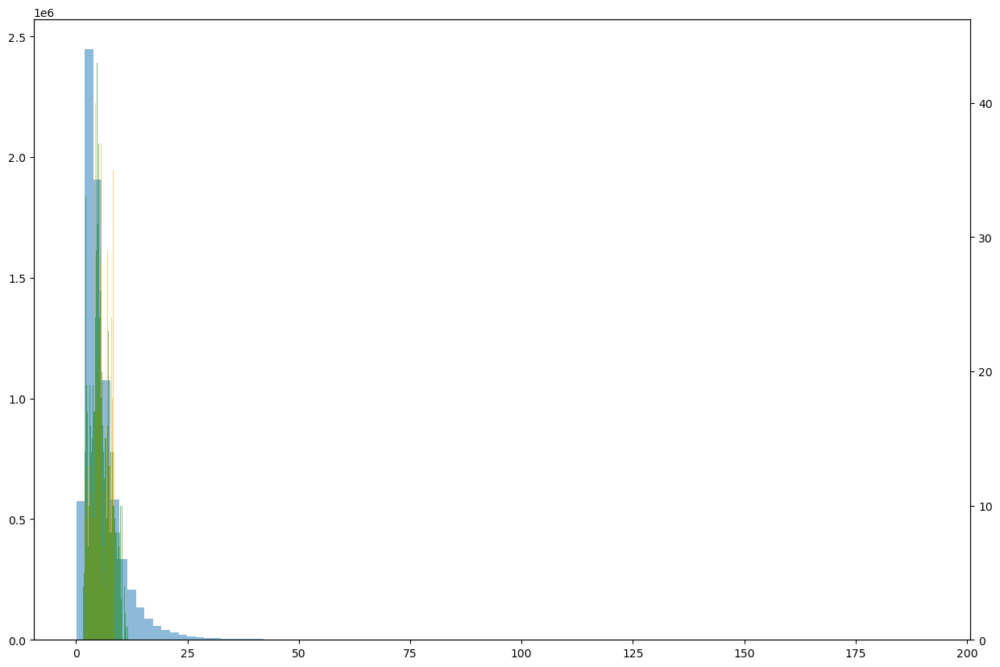

Index(['Date_UTC', 'B_Total', 'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz',
       'proton_density', 'T', 'Pressure', 'E_Field', 'AE_INDEX'],
      dtype='object')


In [3]:
ace = utils.loading_solarwind(omni=False)
omni = pd.read_csv('../data/SW/omni.csv')
omni = pd.read_csv(data_dir + 'dscovr/processed_dscovr_data.csv')
smooth_colab = pd.read_csv('data_smooth_to_send.csv')
normal_colab = pd.read_csv('data_to_send.csv')

print(ace.columns)
print(smooth_colab.columns)

fig, axes = plt.subplots(1, 1, figsize=(15, 10))
axes.hist(ace['proton_density'].dropna(inplace=False), bins=100, alpha=0.5, label='ACE')
axes2 = axes.twinx()
axes2.hist(smooth_colab['proton_density'], bins=100, alpha=0.5, label='smooth', color='orange')
axes2.hist(normal_colab['proton_density'], bins=100, alpha=0.5, label='normal', color='green')
plt.show()
# ace['logT'] = np.log(ace['T'])
# ace.dropna(inplace=True)
print(omni.columns)
# omni.set_index('Epoch', inplace=True)
omni.set_index('Date_UTC', inplace=True)
omni.index = pd.to_datetime(omni.index)

In [4]:
scalers = {}
for cluster in cluster_dict.values():
	for key, region in cluster['regions'].items():
		if not os.path.exists(f'{shap_dir}/new_swmag_region_{key}_extended_v0-2.pkl'):
			continue
		scalers[key] = {}
		if os.path.exists(f'{model_dir}/rsd/region_{key}_version_extended_v0-2_scaler.pkl'):
			with open(f'{model_dir}/rsd/region_{key}_version_extended_v0-2_scaler.pkl', 'rb') as f:
				scaler_values = pickle.load(f)
				scalers[key]['swmag'] = scaler_values
				print(f'{key} scalers loaded')

CAN-0 scalers loaded
CAN-1 scalers loaded
CAN-2 scalers loaded
GRL-0 scalers loaded
GRL-1 scalers loaded
GRL-2 scalers loaded
GRL-3 scalers loaded
FSC-0 scalers loaded
FSC-1 scalers loaded
FSC-2 scalers loaded
FSC-3 scalers loaded
FSC-4 scalers loaded
FSC-5 scalers loaded
FSC-6 scalers loaded
CEU-0 scalers loaded
CEU-1 scalers loaded
CEU-2 scalers loaded
CEU-3 scalers loaded
SVLB scalers loaded
JPN-0 scalers loaded
JPN-1 scalers loaded
ALSK scalers loaded
HUD-0 scalers loaded
HUD-1 scalers loaded


In [5]:

def loading_shap_dicts(region, reg, model_type, add_results=False):
	
	# shap_dir = 'outputs/shap_values'
	results_dir = f'{working_dir}outputs/{model_type}'
	if model_type == 'dbht':
		results_dir = results_dir + '_max'
	root = f'new_swmag_region_{reg}_extended_'
	stem = 'v0-2_dbht' if model_type == 'dbht' else 'v0-2'
	tree_path = os.path.join(shap_dir, root + stem +'.pkl')
	
	if add_results:
		results_stem = f'mc_swmag_modeling_region_{reg}_version_extended_' + stem
		results_path = os.path.join(results_dir, results_stem + '.feather')

		df = pd.read_feather(results_path)
		df.set_index('dates', inplace=True)

		region[f'{model_type}_results'] = df

	with open(tree_path, 'rb') as f:
		shap_values = pickle.load(f)
		region[model_type] = shap_values

		print(f'finished {reg} {model_type}')
	

def inverse_transform_twins(X, mean, std):
	return X*std + mean

def transforming_shap_values(region, reg, model_type, scalers, twins_or_swmag='swmag', pos_or_neg='pos'):

	loading_shap_dicts(region, reg, model_type, add_results=True)

	pos_or_neg_int = 0 if pos_or_neg == 'neg' else 1

	swmag_str = f'swmag_{pos_or_neg}_shap'
	if twins_or_swmag == 'twins':
		twins_str = f'twins_{pos_or_neg}_shap'
	

	# region[model_type][swmag_str] = np.concatenate([region[model_type]['shap_values'][i][pos_or_neg_int][:,:,:,pos_or_neg_int] for i in range(len(region[model_type]['shap_values']))], axis=0)
	region[model_type][swmag_str] = np.concatenate([region[model_type]['shap_values'][i][:,:,:,:,pos_or_neg_int] for i in range(len(region[model_type]['shap_values']))], axis=0)
	if twins_or_swmag == 'twins':
		region[model_type][twins_str] = np.concatenate([region[model_type]['shap_values'][i][pos_or_neg_int][1][:,:,:,:,pos_or_neg_int] for i in range(len(region[model_type]['shap_values']))], axis=0)

	print(region[model_type][swmag_str].shape)

	for key in region[model_type].keys():
		if isinstance(region[model_type][key], torch.Tensor):
			region[model_type][key] = region[model_type][key].numpy()

	swmag_shape = region[model_type][swmag_str].shape
	if twins_or_swmag == 'twins':
		twins_shape = region[model_type][twins_str].shape

	region[model_type][swmag_str] = region[model_type][swmag_str].reshape(swmag_shape[0], swmag_shape[2], swmag_shape[3])
	if twins_or_swmag == 'twins':
		region[model_type][twins_str] = region[model_type][twins_str].reshape(twins_shape[0], twins_shape[2], twins_shape[3])
	
	# region[model_type].pop('testing_data')
	if len(region[model_type]['testing_data'].shape) > 3:
		testing_shape = region[model_type]['testing_data'].shape
		region[model_type]['testing_data'] = region[model_type]['testing_data'].reshape(testing_shape[0], testing_shape[2], testing_shape[3])
	
	# # unscaling the testing_data
	# if twins_or_swmag == 'twins':
	# 	mu = scalers[reg][model_type]['twins_mean']
	# 	sigma = scalers[reg][model_type]['twins_std']
	# 	region[model_type]['testing_data'][1] = region[model_type]['testing_data'][1]*sigma + mu
	# else:
	scaler = scalers[reg]['swmag']
	print(region[model_type]['testing_data'].shape)
	region[model_type]['testing_data'] = scaler.inverse_transform(np.concatenate([region[model_type]['testing_data'][i,:,:] for i in range(testing_shape[0])])).reshape(-1, region[model_type]['testing_data'].shape[1], region[model_type]['testing_data'].shape[2])
	# print(region.keys())

	value_added = np.sum(np.sum(np.abs(region[model_type][swmag_str]), axis=1),axis=1)
	# region[model_type][f'{twins_or_swmag}_{mean_or_std}_shap'] = region[model_type][f'{twins_or_swmag}_{mean_or_std}_shap']/value_added[:,None,None]
	# region[model_type][twins_str] = region[model_type][twins_str]/value_added[:,None,None]

	# normalizing the shap values
	# region[model_type][swmag_str] = region[model_type][swmag_str]/value_added[:,None,None]

	# region[model_type].pop('shap_values', None) 
	# inputs, stat = ['swmag','twins'], ['mean','std']
	# for inp in inputs:
	# 	for st in stat:
	# 		if f'{inp}_{st}_shap' != f'{twins_or_swmag}_{mean_or_std}_shap':
	# 			region[model_type].pop(f'{inp}_{st}_shap', None)
	gc.collect()

with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)

def getting_mean_influence(swmag_array, stations, features):
	mlat = utils.getting_mean_lat(stations)
	swmag_array = np.mean(np.sum(np.abs(swmag_array), axis=1), axis=0)
	swmag_array = swmag_array/np.sum(swmag_array)
	print(swmag_array)
	print(features)
	data = pd.DataFrame({feat: swmag_array[i] for i, feat in enumerate(features)}, index=[mlat])
	return data, features

clusters_to_run = ['canadian_cluster', 'fennoscandinavian_cluster']

rsd_mean_importance, dbht_mean_importance = pd.DataFrame(), pd.DataFrame()

for clust, cluster in cluster_dict.items():
	if clust not in clusters_to_run:
		continue
	for reg, region in cluster_dict[clust]['regions'].items():
		if clust == 'fennoscandinavian_cluster' and reg != 'FSC-2':
			continue
		print(reg)
		if os.path.exists(f'{shap_dir}/new_swmag_region_{reg}_extended_v0-2.pkl'):

			features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
						'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']

			transforming_shap_values(region, reg, 'dbht', scalers, twins_or_swmag='swmag')

			gc.collect()	
			transforming_shap_values(region, reg, 'rsd', scalers, twins_or_swmag='swmag')
			gc.collect()
				# print(cluster['regions'][reg]['rsd'].keys())
			# temp_rsd, rsd_features = getting_mean_influence(cluster['regions'][reg]['rsd']['swmag_pos_shap'], 
			# 								cluster['regions'][reg]['stations'], 
			# 								features)
			# temp_dbht, dbht_features = getting_mean_influence(cluster['regions'][reg]['dbht']['swmag_pos_shap'], 
												# cluster['regions'][reg]['stations'], 
												# features)
													
			# rsd_mean_importance = pd.concat([rsd_mean_importance, temp_rsd])
			# dbht_mean_importance = pd.concat([dbht_mean_importance, temp_dbht])
			# cluster_dict[clust] = {}
# for cluster in cluster_dict.values():
# 	for region in cluster['regions'].values():
# 		region['mean_lat'] = utils.getting_mean_lat(region['stations'])
# 		gc.collect()

CAN-0
finished CAN-0 dbht
(43112, 1, 60, 14)
(43112, 60, 14)
finished CAN-0 rsd
(43112, 1, 60, 14)
(43112, 60, 14)
CAN-1
finished CAN-1 dbht
(34351, 1, 60, 14)
(34351, 60, 14)
finished CAN-1 rsd
(34351, 1, 60, 14)
(34351, 60, 14)
CAN-2
finished CAN-2 dbht
(45340, 1, 60, 14)
(45340, 60, 14)
finished CAN-2 rsd
(45340, 1, 60, 14)
(45340, 60, 14)
FSC-2
finished FSC-2 dbht
(109627, 1, 60, 14)
(109627, 60, 14)
finished FSC-2 rsd
(109627, 1, 60, 14)
(109627, 60, 14)


['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT', 'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
(0, 0)
(0, 0)


NameError: name 'rsd_features' is not defined

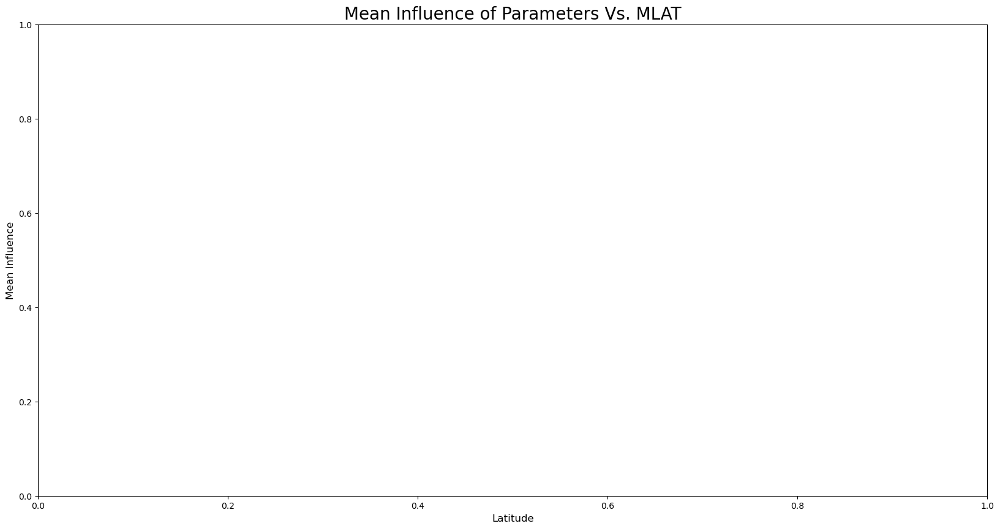

In [6]:

# # Summing up the total influence of each parameter and plotting them as a function of latitude
# influence_df = pd.DataFrame(columns=[feature for feature in features], index=[twins_shap[region]['mlat'] for region in twins_shap.keys()])

# for feature in features:
# 	feature_list = []
# 	for region in twins_shap.keys():
# 		feature_list.append(np.mean(np.sum(np.abs(twins_shap[region]['sw_mean']),axis=1)[:, features.index(feature)]))

# 	influence_df[feature] = feature_list

# influence_df['twins_maps'] = [np.mean(np.sum(np.sum(np.abs(twins_shap[region]['twins_mean']),axis=1),axis=1)) for region in twins_shap.keys()]

# adjusted_features = features.copy()
# adjusted_features.append('twins_maps')

features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']

colors = sns.color_palette('tab20', len(features)+7)
colors.pop(-1)
colors.pop(-4)
colors.pop(-4)
colors.pop(6)
colors.pop(6)
colors.pop(-2)

print(features)
rsd_mean_importance = rsd_mean_importance.sort_index()
print(rsd_mean_importance.shape)
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 10))
axes.set_title('Mean Influence of Parameters Vs. MLAT', fontsize=20)
axes.set_ylabel('Mean Influence', fontsize=12)
axes.set_xlabel('Latitude', fontsize=12)
# plotting_list = [rsd_mean_importance[feature].values for feature in features]
plotting_list = rsd_mean_importance.to_numpy()
print(plotting_list.shape)
print(len(rsd_features))
print(len(colors))
axes.stackplot(rsd_mean_importance.index, plotting_list.T, labels=features, colors=colors)
axes.margins(x=0, y=0)
axes.legend(loc='upper left')
plt.tight_layout()
plt.savefig('plots/rsd_mean_influence.png')

colors = sns.color_palette('tab20', len(dbht_features)+7)
colors.pop(-1)
colors.pop(-4)
colors.pop(-4)
colors.pop(6)
colors.pop(6)
colors.pop(-2)

print(features)
dbht_mean_importance = dbht_mean_importance.sort_index()
print(dbht_mean_importance.shape)
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 10))
axes.set_title('Mean Influence of Parameters Vs. MLAT', fontsize=20)
axes.set_ylabel('Mean Influence', fontsize=12)
axes.set_xlabel('Latitude', fontsize=12)
# plotting_list = [rsd_mean_importance[feature].values for feature in features]
plotting_list = dbht_mean_importance.to_numpy()
print(plotting_list.shape)
print(len(colors))
axes.stackplot(dbht_mean_importance.index, plotting_list.T, labels=features, colors=colors)
axes.margins(x=0, y=0)
axes.legend(loc='upper left')
plt.tight_layout()
plt.savefig('plots/dbht_mean_influence.png')


In [6]:
def regularizing_mc_models(df, true_value_elevation, drop_dates=True, drop_actual=True):
	
	plotting_df = pd.DataFrame()
	temp_df = df.copy()
	if 'dates' in temp_df.columns:
		temp_df.drop(columns=['dates'], inplace=True)
	if 'actual' in temp_df.columns:
		temp_df.drop(columns=['actual'], inplace=True)
	if drop_actual:
		plotting_df['top'], plotting_df['bottom'] = df['actual']*(1+(true_value_elevation+1)*0.05), df['actual']*(1+true_value_elevation*0.05)
	else:
		plotting_df['actual'] = df['actual']
	
	plotting_df['predicted_mean'] = temp_df.mean(axis=1)
	plotting_df['predicted_min'] = temp_df.min(axis=1)
	plotting_df['predicted_max'] = temp_df.max(axis=1)
	plotting_df['5th_percentile'] = temp_df.quantile(0.05, axis=1)
	plotting_df['95th_percentile'] = temp_df.quantile(0.95, axis=1)
	plotting_df['predicted_std'] = temp_df.std(axis=1)

	if isinstance(df.index, pd.DatetimeIndex):
		plotting_df.index = df.index
	elif 'dates' in df.columns:
		plotting_df.index = df['dates']
	else:
		raise ValueError('Fool of a Took! No dates column found')
	# if not drop_dates:
	# 	plotting_df['dates'] = df['dates']

	return plotting_df

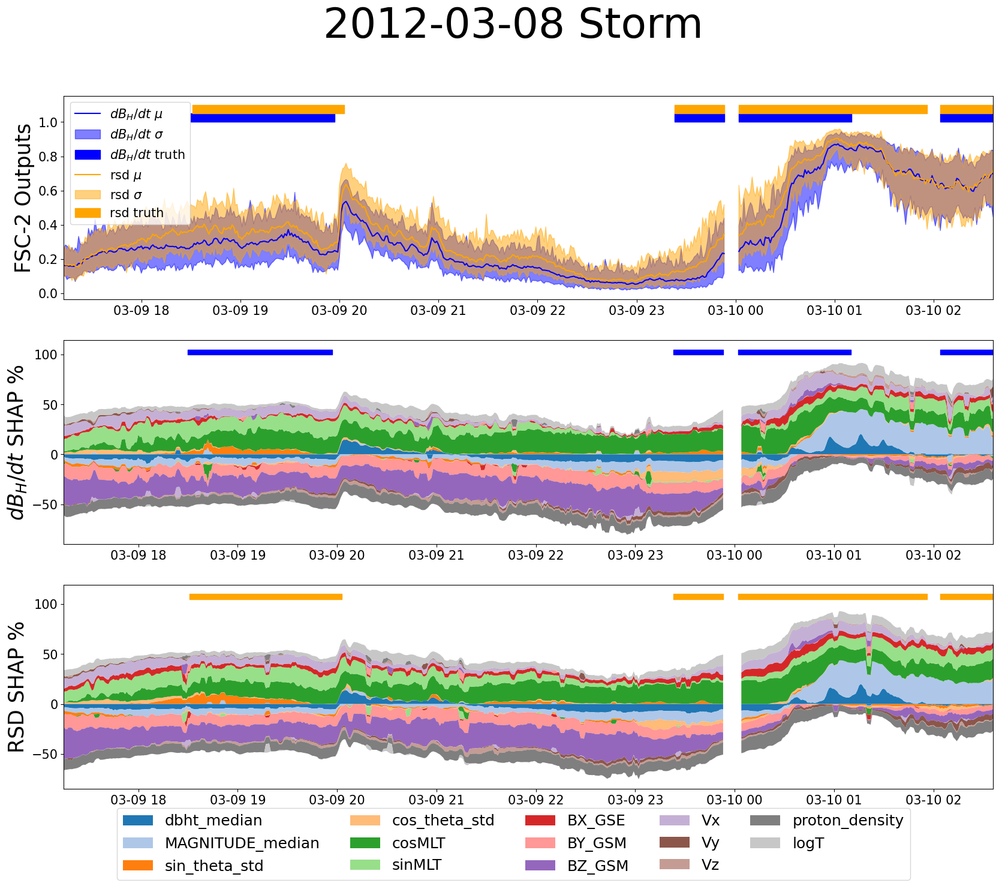

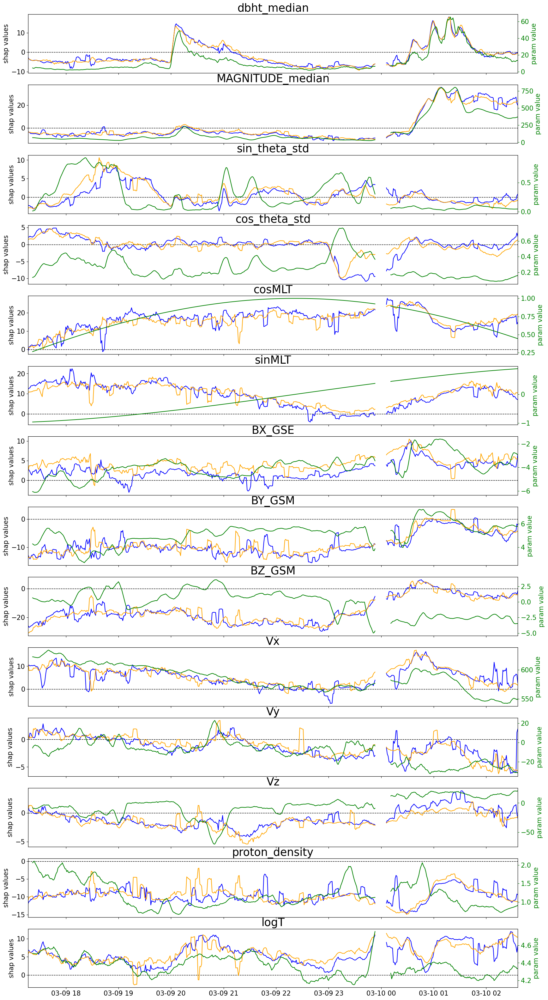

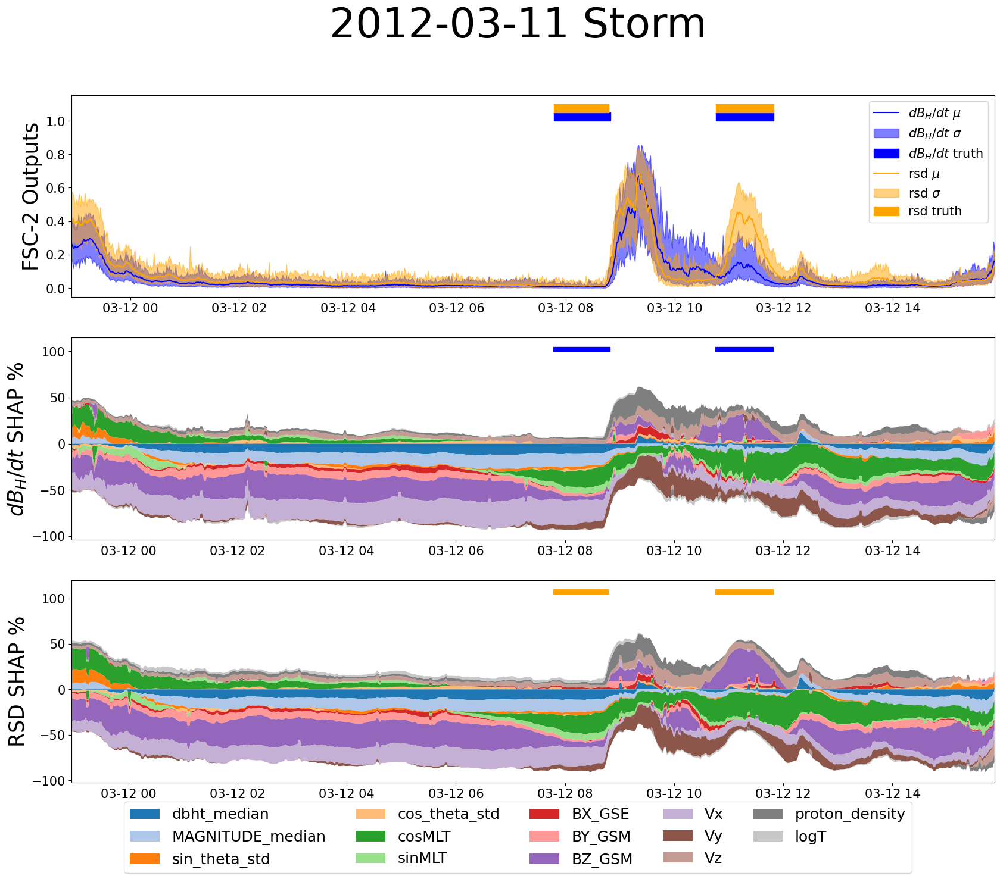

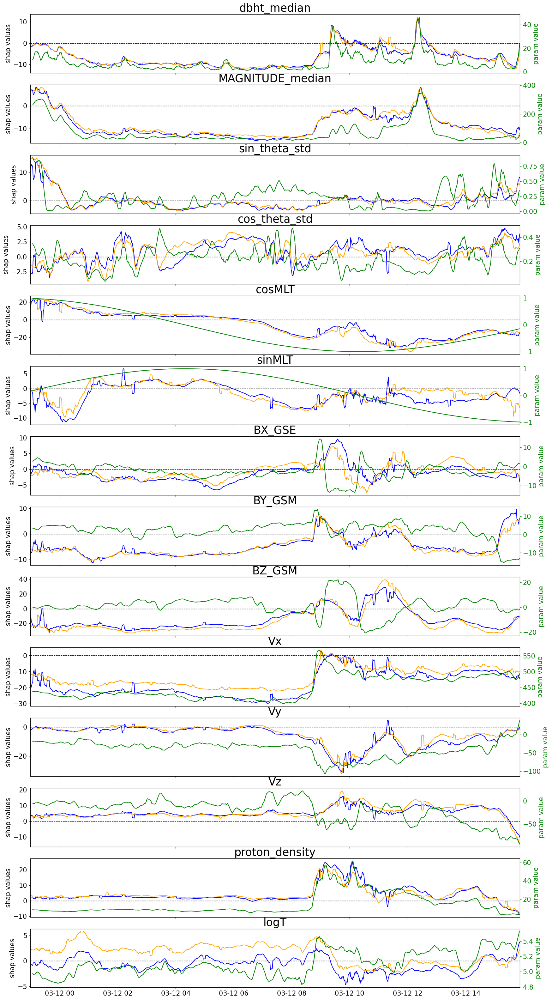

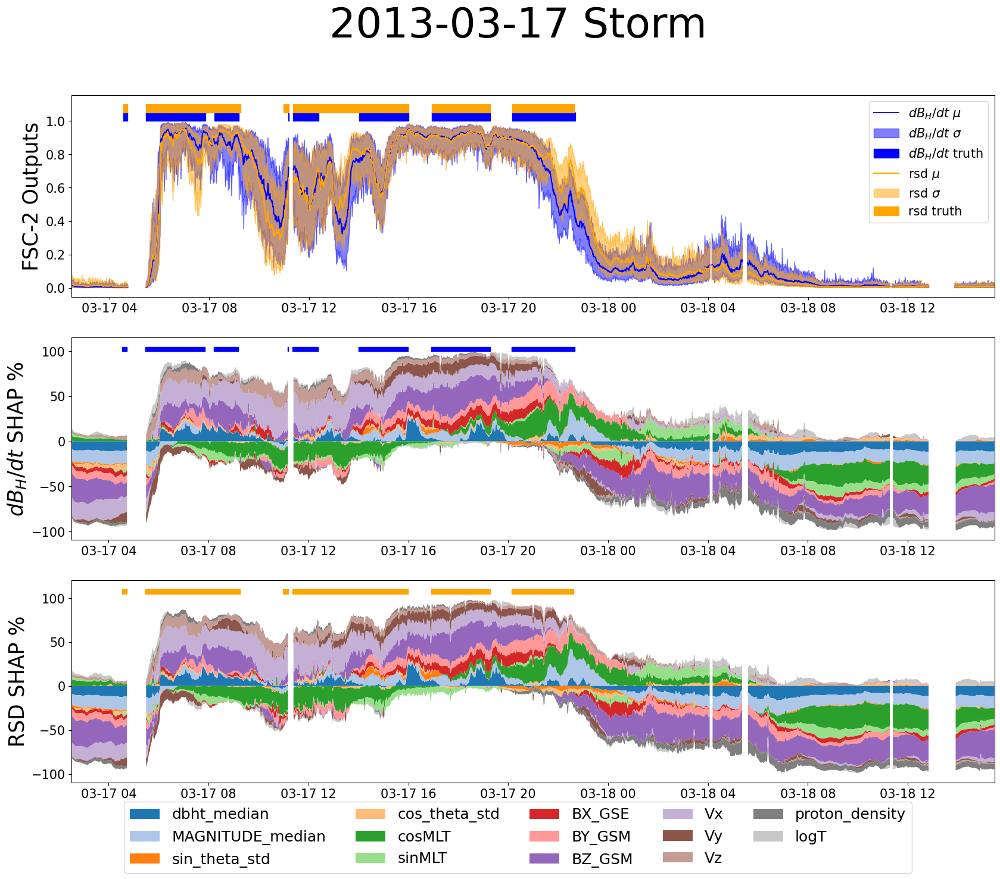

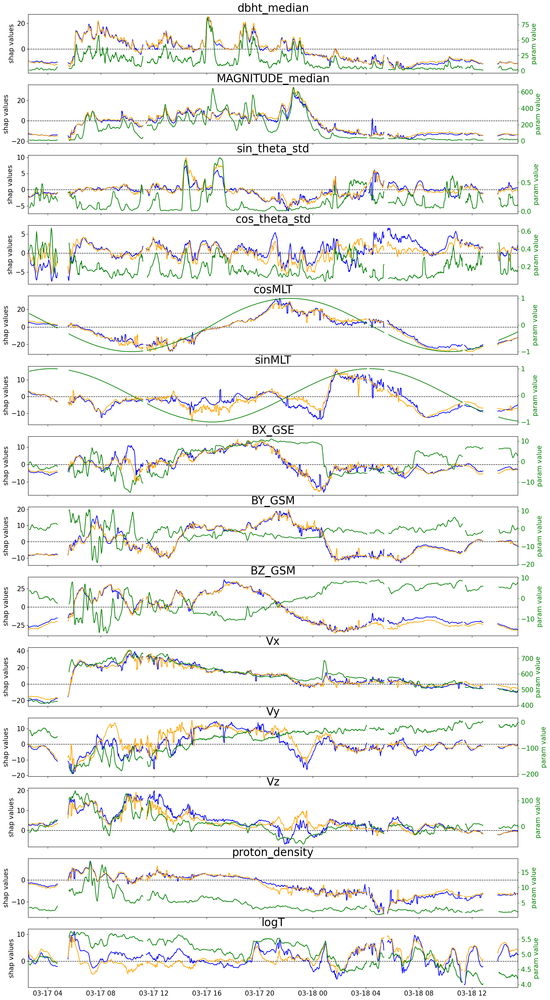

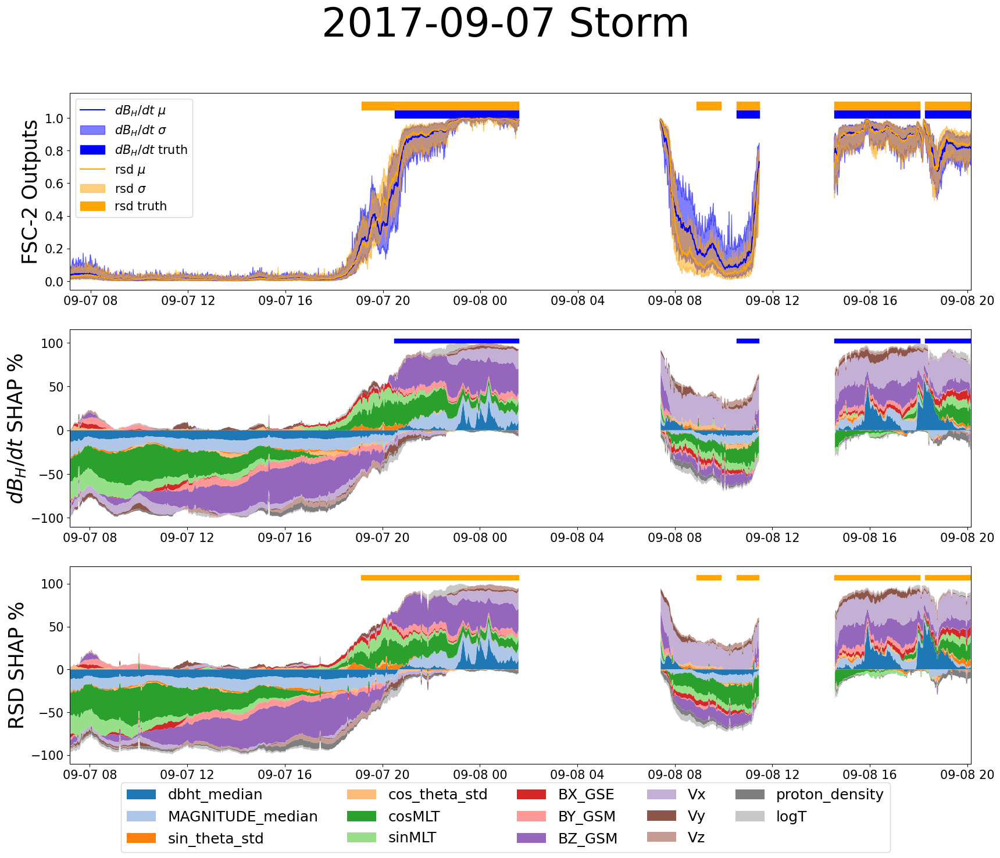

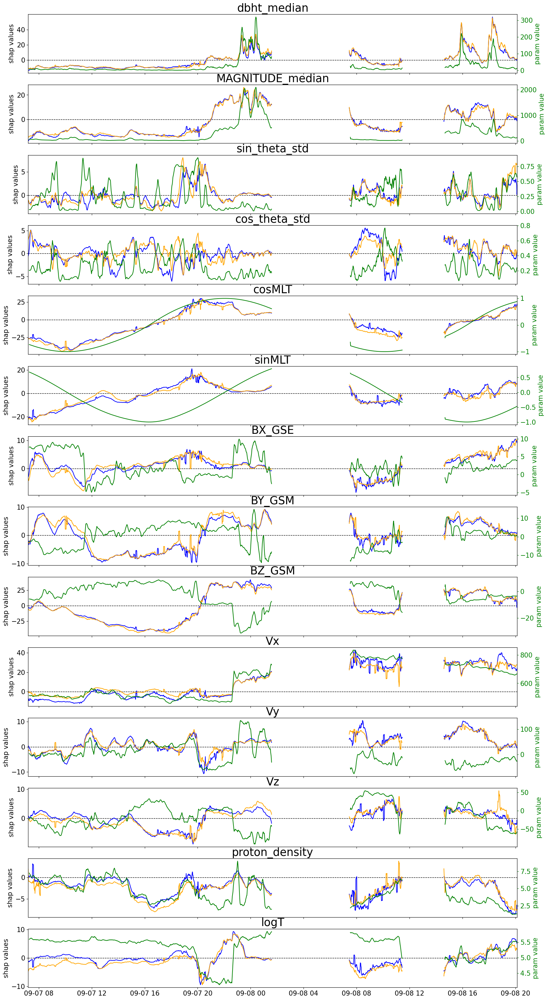

In [7]:
def shap_time_series_plotting(cluster, region, start_date, end_date, vline=None):

	# start_date = '2017-09-08 01:08:00'
	# end_date = '2017-09-08 01:08:00'

	features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']


	dbht_condensed = np.sum(cluster_dict[cluster]['regions'][region]['dbht']['swmag_pos_shap'], axis=1)
	rsd_condensed = np.sum(cluster_dict[cluster]['regions'][region]['rsd']['swmag_pos_shap'], axis=1)
	testing_condensed = cluster_dict[cluster]['regions'][region]['dbht']['testing_data'][:,59,:]

	dbht_df = pd.DataFrame(dbht_condensed, columns=features, index=cluster_dict[cluster]['regions'][region]['dbht']['Date_UTC'])
	rsd_df = pd.DataFrame(rsd_condensed, columns=features, index=cluster_dict[cluster]['regions'][region]['rsd']['Date_UTC'])
	testing_df = pd.DataFrame(testing_condensed, columns=features, index=cluster_dict[cluster]['regions'][region]['dbht']['Date_UTC'])

	dbht_df = dbht_df.sort_index(ascending=True)
	rsd_df = rsd_df.sort_index(ascending=True)
	testing_df = testing_df.sort_index(ascending=True)


	dbht_df.index = pd.to_datetime(dbht_df.index, format='%Y-%m-%d %H:%M:%S')
	rsd_df.index = pd.to_datetime(rsd_df.index, format='%Y-%m-%d %H:%M:%S')
	if start_date == end_date:
		start_date = pd.to_datetime(start_date, format='%Y-%m-%d %H:%M:%S') - pd.Timedelta(minutes=1140)
		end_date = pd.to_datetime(end_date, format='%Y-%m-%d %H:%M:%S') + pd.Timedelta(minutes=1140)
	date_index_df = pd.DataFrame(index=pd.date_range(start=start_date, end=end_date, freq='min'))
	dbht_df = dbht_df.sort_index(ascending=True)
	rsd_df = rsd_df.sort_index(ascending=True)
	plotting_dbht = date_index_df.join(dbht_df, how='left')
	plotting_rsd = date_index_df.join(rsd_df, how='left')
	plotting_testing = date_index_df.join(testing_df, how='left')
	results_dbht = date_index_df.join(cluster_dict[cluster]['regions'][region]['dbht_results'], how='left')
	results_rsd = date_index_df.join(cluster_dict[cluster]['regions'][region]['rsd_results'], how='left')

	results_dbht = regularizing_mc_models(results_dbht, 0)
	results_rsd = regularizing_mc_models(results_rsd, 1)

	plotting_dbht = (plotting_dbht.div(plotting_dbht.abs().sum(axis=1), axis=0))*100
	plotting_rsd = (plotting_rsd.div(plotting_rsd.abs().sum(axis=1), axis=0))*100

	pos_plotting_dbht = plotting_dbht.mask(plotting_dbht < 0, other=0)
	neg_plotting_dbht = plotting_dbht.mask(plotting_dbht > 0, other=0)
	pos_plotting_rsd = plotting_rsd.mask(plotting_rsd < 0, other=0)
	neg_plotting_rsd = plotting_rsd.mask(plotting_rsd > 0, other=0)

	pos_dbht_dict, neg_dbht_dict, pos_rsd_dict, neg_rsd_dict = {}, {}, {}, {}

	for feature in features:
		pos_dbht_dict[feature] = pos_plotting_dbht[feature].rolling(3).mean().to_numpy()
		neg_dbht_dict[feature] = neg_plotting_dbht[feature].rolling(3).mean().to_numpy()
		pos_rsd_dict[feature] = pos_plotting_rsd[feature].rolling(3).mean().to_numpy()
		neg_rsd_dict[feature] = neg_plotting_rsd[feature].rolling(3).mean().to_numpy()

	colors = sns.color_palette('tab20', len(features)+2)
	colors.pop(-3)
	colors.pop(-3)

	fig, axes = plt.subplots(3, 1, figsize=(20, 15), sharex=False)
	title = plt.suptitle(f'{start_date.strftime("%Y-%m-%d")} Storm', fontsize=50)
	#plotting results
	axes[0].plot(results_dbht['predicted_mean'], color='blue', label=r'$dB_H/dt$ $\mu$')
	axes[0].fill_between(results_dbht.index, results_dbht['predicted_min'], results_dbht['predicted_max'], color='blue', alpha=0.5, label=r'$dB_H/dt$ $\sigma$')
	axes[0].fill_between(results_dbht.index, results_dbht['top'], results_dbht['bottom'], color='blue', alpha=1, where=results_dbht['top'] > results_dbht['bottom'], label=r'$dB_H/dt$ truth')

	axes[0].plot(results_rsd['predicted_mean'], color='orange', label=r'rsd $\mu$')
	axes[0].fill_between(results_rsd.index, results_rsd['predicted_min'], results_rsd['predicted_max'], color='orange', alpha=0.5, label=r'rsd $\sigma$')
	axes[0].fill_between(results_rsd.index, results_rsd['top'], results_rsd['bottom'], color='orange', alpha=1, where=results_rsd['top'] > results_rsd['bottom'], label='rsd truth')
	axes[0].set_ylabel(f'{region} Outputs', fontsize=25)
	axes[0].set_yticks(np.arange(0, 1.1, 0.2))	
	axes[0].margins(x=0)
	axes[0].tick_params(axis='both', which='major', labelsize=15)
	axes[0].legend(fontsize=15)

	#plotting shap values
	axes[1].stackplot(plotting_dbht.index, pos_dbht_dict.values(), colors=colors, labels=pos_dbht_dict.keys())
	axes[1].stackplot(plotting_dbht.index, neg_dbht_dict.values(), colors=colors)
	axes[1].fill_between(results_dbht.index, results_dbht['top']*100, results_dbht['bottom']*100, color='blue', alpha=1, where=results_dbht['top'] > results_dbht['bottom'], label=r'$dB_H/dt$ truth')
	axes[1].set_ylabel(r'$dB_H/dt$ SHAP %', fontsize=25)
	axes[1].tick_params(axis='both', which='major', labelsize=15)

	axes[1].margins(x=0)

	axes[2].stackplot(plotting_rsd.index, pos_rsd_dict.values(), colors=colors, labels=pos_rsd_dict.keys())
	axes[2].stackplot(plotting_rsd.index, neg_rsd_dict.values(), colors=colors)
	axes[2].fill_between(results_rsd.index, results_rsd['top']*100, results_rsd['bottom']*100, color='orange', alpha=1, where=results_rsd['top'] > results_rsd['bottom'])
	axes[2].set_ylabel('RSD SHAP %', fontsize=25)
	axes[2].tick_params(axis='both', which='major', labelsize=15)

	axes[2].margins(x=0)

	if vline:
		axes[0].axvline(pd.to_datetime(vline, format='%Y-%m-%d %H:%M:%S'), color='black', linestyle='--')
		axes[1].axvline(pd.to_datetime(vline, format='%Y-%m-%d %H:%M:%S'), color='black', linestyle='--')
		axes[2].axvline(pd.to_datetime(vline, format='%Y-%m-%d %H:%M:%S'), color='black', linestyle='--')

	handles, labels = axes[2].get_legend_handles_labels()
	lgd = fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.0), ncol=5, fontsize=18)

	# plt.tight_layout()
	plt.savefig(f'shap_time_series_plots/new_{cluster}_{region}_{start_date.strftime("%Y-%m-%d")}_shap.png', bbox_extra_artists=(lgd,title), bbox_inches='tight')

	fig, axes = plt.subplots(len(features), 1, figsize=(20, 40), sharex=True)

	for i, feature in enumerate(features):
		axes[i].set_title(feature, fontsize=25)
		axes[i].axhline(0, color='black', linewidth=1, linestyle='--')
		axes[i].plot(plotting_dbht.index, plotting_dbht[feature].rolling(5).mean(), color='blue', label='dbht')
		axes[i].plot(plotting_rsd.index, plotting_rsd[feature].rolling(5).mean(), color='orange', label='rsd')
		axes[i].set_ylabel('shap values', fontsize=15)
		axes[i].tick_params(axis='both', which='major', labelsize=15)
		if vline:
			axes[i].axvline(pd.to_datetime(vline, format='%Y-%m-%d %H:%M:%S'), color='black', linestyle='--')
		axes2 = axes[i].twinx()
		axes2.plot(results_dbht.index, plotting_testing[feature].rolling(10).mean(), color='green', label='testing data')
		axes2.tick_params(axis='both', which='major', labelsize=15, colors='green')
		axes2.set_ylabel('param value', fontsize=15, color='green')
		axes[i].margins(x=0)
		# axes[i].legend(fontsize=15)
	plt.savefig(f'shap_time_series_plots/new_individual_params_{cluster}_{region}_{start_date.strftime("%Y-%m-%d")}.png', bbox_inches='tight')
non_cluster_regions = ['ALSK', 'HUD-0', 'HUD-1', 'SVLB', 'JPN-0', 'JPN-1']
for storm in ['2012-03-09 08:13:00', '2012-03-12 16:55:00', '2013-03-17 20:28:00', '2017-09-08 01:08:00']:
# for storm in ['2023-01-04 09:04:00', '2023-05-06 05:11:00', '2024-05-11 02:14:00']:
	for reg in cluster_dict['fennoscandinavian_cluster']['regions'].keys():
	# for reg in non_cluster_regions:
		if reg == 'FSC-2':
			shap_time_series_plotting('fennoscandinavian_cluster', reg, storm, storm, vline = None)

# specific_test_storms = ['2012-03-09 08:13:00', '2012-03-12 16:55:00', '2013-03-17 20:28:00', '2017-09-08 01:08:00']


In [ ]:
def getting_mean_influence(twins_array, swmag_array, stations, features):
	mlat = utils.getting_mean_lat(stations)
	swmag_array = np.mean(np.abs(swmag_array), axis=0)
	swmag_array = swmag_array/np.sum(swmag_array)
	data = pd.DataFrame({feat: swmag_array[i] for i, feat in enumerate(features)}, index=[mlat])
	return data, features

rsd_mean_importance, dbht_mean_importance = pd.DataFrame(), pd.DataFrame()


for clust, cluster in cluster_dict.items():
	for reg, region in cluster_dict[clust]['regions'].items():
		if os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl'):
			temp_rsd, rsd_features = getting_mean_influence(cluster['regions'][reg]['rsd']['swmag_pos_shap'], 
											cluster['regions'][reg]['rsd']['swmag_mean_shap'], 
											cluster['regions'][reg]['stations'], 
											cluster['regions'][reg]['rsd']['features'])
			temp_dbht, dbht_features = getting_mean_influence(cluster['regions'][reg]['dbht']['swmag_pos_shap'], 
												cluster['regions'][reg]['dbht']['swmag_mean_shap'], 
												cluster['regions'][reg]['stations'], 
												cluster['regions'][reg]['dbht']['features'])
													
			rsd_mean_importance = pd.concat([rsd_mean_importance, temp_rsd])
			dbht_mean_importance = pd.concat([dbht_mean_importance, temp_dbht])

FSC-0 i = 14750


Loading station STF....


/tmp/ipykernel_1179948/3429060581.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  date = cluster_dict[selected_cluster]['regions'][selected_region]['rsd']['Date_UTC'].iloc[i][0]


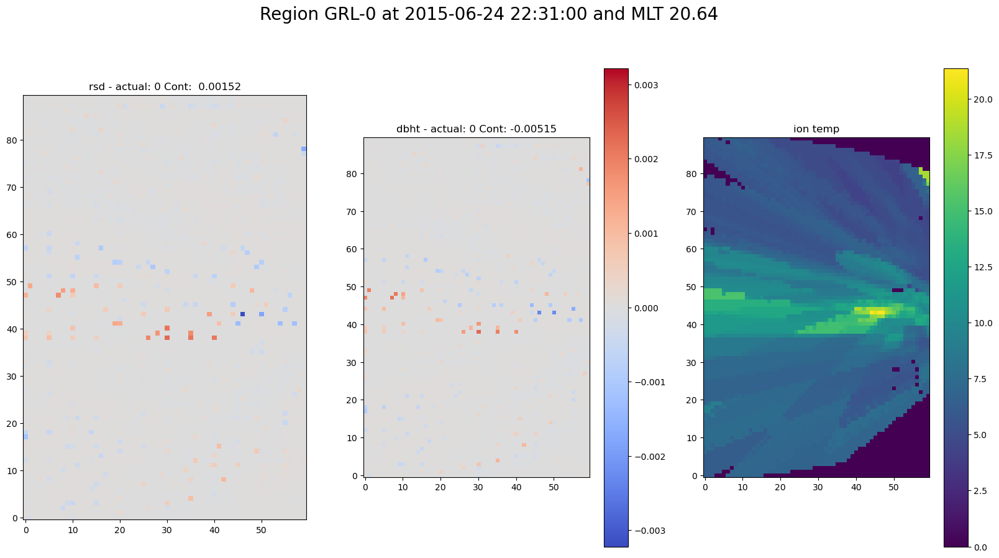

In [ ]:
# selected_cluster = 'greenland_cluster'
# selected_region = 'GRL-0'

# mlt_df = utils.loading_supermag(cluster_dict[selected_cluster]['regions'][selected_region]['mlt_station'])
# mlt_df = mlt_df.loc[cluster_dict[selected_cluster]['regions'][selected_region]['rsd']['Date_UTC']['Date_UTC']]['MLT']

# i = 13000
# date = cluster_dict[selected_cluster]['regions'][selected_region]['rsd']['Date_UTC'].iloc[i][0]


# fig, axes = plt.subplots(1,3, figsize=(20,10))
# plt.suptitle(f"Region {selected_region} at {date} and MLT {mlt_df.loc[date]:.2f}", fontsize=20)
# scale = max(abs(cluster_dict[selected_cluster]['regions'][selected_region]['rsd']['twins_mean_shap'][i]).max(), abs(cluster_dict[selected_cluster]['regions'][selected_region]['dbht']['twins_mean_shap'][i]).max())
# plot_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
# axes[0].imshow(cluster_dict[selected_cluster]['regions'][selected_region]['rsd']['twins_mean_shap'][i], cmap='coolwarm', vmin=-scale, vmax=scale, origin='lower')
# shap = axes[1].imshow(cluster_dict[selected_cluster]['regions'][selected_region]['dbht']['twins_mean_shap'][i], cmap='coolwarm', vmin=-scale, vmax=scale, origin='lower')
# fig.colorbar(shap, ax=axes[1])
# axes[0].set_title(f"rsd - actual: {cluster_dict[selected_cluster]['regions'][selected_region]['rsd']['ytest'][i]} Cont: {cluster_dict[selected_cluster]['regions'][selected_region]['rsd']['twins_mean_shap'][i].sum(): .5f}")
# axes[1].set_title(f"dbht - actual: {cluster_dict[selected_cluster]['regions'][selected_region]['dbht']['ytest'][i]} Cont: {cluster_dict[selected_cluster]['regions'][selected_region]['dbht']['twins_mean_shap'][i].sum(): .5f}")

# test = np.array(cluster_dict[selected_cluster]['regions'][selected_region]['dbht']['testing_data'][1][i])
# test = test.reshape(test.shape[1], test.shape[2])
# test = unscaling_test_data(test, scalers[selected_region]['twins']['twins_mean'], scalers[selected_region]['twins']['twins_std'])
# image = axes[2].imshow(test, cmap='viridis', origin='lower')
# axes[2].set_title('ion temp')
# fig.colorbar(image, ax=axes[2])

# plt.show()


In [ ]:

rsd_mean_importance, dbht_mean_importance = pd.DataFrame(), pd.DataFrame()
for cluster in cluster_dict.values():
	for region in cluster['regions'].keys():
		temp_rsd, rsd_features = getting_mean_influence(cluster['regions'][region]['rsd']['twins_mean_shap'], 
											cluster['regions'][region]['rsd']['swmag_mean_shap'], 
											cluster['regions'][region]['stations'], 
											cluster['regions'][region]['rsd']['features'])
		temp_dbht, dbht_features = getting_mean_influence(cluster['regions'][region]['dbht']['twins_mean_shap'], 
											cluster['regions'][region]['dbht']['swmag_mean_shap'], 
											cluster['regions'][region]['stations'], 
											cluster['regions'][region]['dbht']['features'])
												
		rsd_mean_importance = pd.concat([rsd_mean_importance, temp_rsd])
		dbht_mean_importance = pd.concat([dbht_mean_importance, temp_dbht])

KeyError: 'twins_mean_shap'

In [ ]:
class Twins_SHAP():

	def __init__(self, shap_dir, scaler_dir, cluster_dict, include_testing=True):
		self.shap_dir = shap_dir
		self.scaler_dir = scaler_dir
		self.cluster_dict = cluster_dict
		self.model_type = 'twins'
		self.oversampled = ['CEU-2', 'GRL-0', 'GRL-1', 'GRL-2', 'SVLB', 'JPN-0', 'JPN-1', 'HUD-1']
		self.include_testing = include_testing

	def load_shap_values_and_ion_temp_data(self, cluster, region):

		if region in self.oversampled:
			if os.path.exists(f'{self.shap_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4_oversampling.pkl'):
				with open(f'{self.shap_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4_oversampling.pkl', 'rb') as f:
					self.shap_values = pickle.load(f)
			if os.path.exists(f'{self.scaler_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4_oversampling.pkl'):
				with open(f'{self.scaler_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4_oversampling.pkl', 'rb') as f:
					self.scaler_values = pickle.load(f)
			self.results = pd.read_feather(f'outputs/rsd/{self.model_type}_modeling_region_{region}_version_{self.model_type}_alt_v4_oversampling.feather')
		else:
			if os.path.exists(f'{self.shap_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4.pkl'):
				with open(f'{self.shap_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4.pkl', 'rb') as f:
					self.shap_values = pickle.load(f)
			if os.path.exists(f'{self.scaler_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4.pkl'):
				with open(f'{self.scaler_dir}/{self.model_type}_region_{region}_{self.model_type}_alt_v4.pkl', 'rb') as f:
					self.scaler_values = pickle.load(f)
			self.results = pd.read_feather(f'outputs/rsd/{self.model_type}_modeling_region_{region}_version_{self.model_type}_alt_v4.feather')

		if self.include_testing:
			# loading ion temperature data
			self.testing_data = self.shap_values['testing_data'][1]
			self.testing_data = np.reshape(self.testing_data, (self.testing_data.shape[0], self.testing_data.shape[2], self.testing_data.shape[3]))

			# unscaling ion temps
			self.testing_data = self.testing_data*scaler_values['twins_std'] + scaler_values['twins_mean']
		# putting the shap values together and removing channel dimension
		self.shap_data = np.concatenate([self.shap_values['shap_values'][i][0][1][:,:,:,:] for i in range(len(self.shap_values['shap_values']))], axis=0)
		self.shap_data = np.reshape(self.shap_data, (self.shap_data.shape[0], self.shap_data.shape[2],self.shap_data.shape[3]))
		value_added = np.sum(np.sum(np.abs(self.shap_data), axis=1), axis=1)
		self.shap_data = self.shap_data/value_added[:,None,None]
		# loading the location data for this region
		mlt_station = utils.loading_supermag(self.cluster_dict[cluster]['regions'][region]['mlt_station'])
		# print(mlt_station[~mlt_station.index.isin(self.shap_values['Date_UTC']['Date_UTC'])])
		self.location_df = mlt_station[['MLT','MLAT']][mlt_station.index.isin(self.shap_values['Date_UTC']['Date_UTC'])]
		self.shap_data = self.shap_data[~self.shap_values['Date_UTC']['Date_UTC'].duplicated(),:,:]
		self.testing_data = self.testing_data[~self.shap_values['Date_UTC']['Date_UTC'].duplicated(),:,:]
		# self.results = self.results[~self.shap_values['Date_UTC']['Date_UTC'].duplicated()]
		self.ytest = np.array(self.shap_values['ytest'][~self.shap_values['Date_UTC']['Date_UTC'].duplicated()])
		try:
			self.pred_mu = self.results[~self.shap_values['Date_UTC']['Date_UTC'].duplicated()]['predicted_mean']
		except:
			print(f'Error in {region}')
			print(self.results)
			print(self.shap_values['Date_UTC']['Date_UTC'])


		# binning MLT  for plotting and transforming 24 --> 0 for consistency
		self.location_df['MLT'] = self.location_df['MLT'].round(0)
		self.location_df.loc[self.location_df['MLT'] == 24, 'MLT'] = 0
		
	def mlt_wedge(self, img_data, mlt_min: int = 18, mlt_max: int = 6, center_x: int = 120, center_y: int = 80):
		"""
		This function takes in a temperature ENA image and divides thems into pie slices based on the
		numbers of slices desired. The output of the function is an array of the mean different sections of the
		ENA temperature map generated and the different sections themselves, respectively.
		Parameters:
		-----------
		img_data : ndarray
			Input image data.
		mlt_min : int, optional
			Minimum MLT value. Default is 18.
		mlt_max : int, optional
			Maximum MLT value. Default is 6.
		mlt_span : int, optional
			MLT span. Default is 1.
		angle_steps : int, optional
			Number of angle steps for pie slices. Default is 8.
		center_x : int, optional
			X-coordinate of the center. Default is 120.
		center_y : int, optional
			Y-coordinate of the center. Default is 80.
		Returns:
		--------
		selected_sections : list
			List of selected pie slice sections.
		"""
		# get the dimension of the image
		height, width = img_data.shape
		# Create an empty list to store the selected sections
		selected_sections = []
		img_mean = []
		# define the numbers of angles used for the pie slices
		# Create masks for each N-degree section and apply them to the image
		# Create a new blank mask as a NumPy array
		mask = np.zeros((height, width), dtype=np.uint8)
		img_copy = np.copy(img_data)
		# Calculate the coordinates of the sector's bounding box

		start_angle = (mlt_min*15) % 360
		end_angle = (mlt_max*15) % 360

		# Calculate the coordinates of the sector arc
		for y in range(height):
			for x in range(width):
				# Calculate the polar coordinates of the pixel relative to the image center
				dx = center_x - x
				dy = center_y - y
				pixel_angle = math.degrees(math.atan2(dy, dx))  # Calculate the angle in radians
				if pixel_angle < 0:
					pixel_angle += 360
				# Check if the pixel is within the current 45-degree section
				if mlt_min > mlt_max:
					if start_angle <= pixel_angle < 360 or 0 <= pixel_angle < end_angle:
						mask[y, x] = 1
				else:
					if start_angle <= pixel_angle < end_angle:
						mask[y, x] = 1  # Set the pixel to white (255)
		# Apply the mask to the heat map to select the section
		img_copy[mask == 0] = 0
		# Append the selected section to the list
		selected_sections = img_copy
		xx = np.copy(img_copy)
		xx[xx == 0] = np.nan

		# Get the mean of the non zero values of the image
		if np.isnan(xx).all():
			img_mean.append(np.nan)
		else:
			img_mean.append(np.nanmean(xx))

		return img_mean, selected_sections

	def getting_valid_map_values(self, shap_img, mlt, mlat, ytest, mu, testing_img=None):

		mlt_min = mlt-2 if mlt >=2 else 24+mlt-2
		mlt_max = mlt+2 if mlt <=22 else mlt-24+2

		# getting the valid values of the shap image
		shap_mean, shap_img = self.mlt_wedge(img_data=shap_img, mlt_min=mlt_min, mlt_max=mlt_max, center_x=70, center_y=45)
		testing_mean, testing_img = self.mlt_wedge(img_data=testing_img, mlt_min=mlt_min, mlt_max=mlt_max, center_x=70, center_y=45)
		if testing_img is not None:
			valid_pixel_df = pd.DataFrame({'shap': shap_img.flatten(), 'testing': testing_img.flatten()})
			valid_pixel_df = valid_pixel_df.dropna()
			valid_pixel_df = valid_pixel_df[(valid_pixel_df['shap'] != 0) & (valid_pixel_df['testing'] != 0)]
		else:
			valid_pixel_df = pd.DataFrame({'shap': shap_img.flatten()})
			valid_pixel_df = valid_pixel_df.dropna()
			valid_pixel_df = valid_pixel_df[valid_pixel_df['shap'] != 0]
		valid_pixel_df['MLT'] = mlt
		valid_pixel_df['MLAT'] = mlat
		valid_pixel_df['ytest'] = ytest
		# valid_pixel_df['pred_mu'] = mu

		return valid_pixel_df

	# def pooling_max_abs(self, array, axis=None):
	# 	print(np.min(array, axis=axis).shape, np.max(array, axis=axis).shape)
	# 	return max(np.min(array, axis=axis), np.max(array, axis=axis), key=abs)
	def pooling_max_abs(self, a, axis=None):
		amax = a.max(axis)
		amin = a.min(axis)
		return np.where(-amin > amax, amin, amax)

	def pool(self, shap_img, testing_img=None, pooling_size=(2,2), pooling_type='mean'):

		if not isinstance(shap_img, np.ndarray):
			shap_img = np.array(shap_img)
		if testing_img is not None:
			if not isinstance(testing_img, np.ndarray):
				testing_img = np.array(testing_img)

		if pooling_type == 'mean':
			shap_img = skimage.measure.block_reduce(shap_img, block_size=pooling_size, func=np.mean)
			if testing_img is not None:
				testing_img = skimage.measure.block_reduce(testing_img, block_size=pooling_size, func=np.mean)
		elif pooling_type == 'max':
			shap_img = skimage.measure.block_reduce(shap_img, block_size=pooling_size, func=self.pooling_max_abs)
			if testing_img is not None:
				testing_img = skimage.measure.block_reduce(testing_img, block_size=pooling_size, func=self.pooling_max_abs)

		return shap_img, testing_img

	def returning_dataframe(self, shap_img, mlt, mlat, ytest, mu, testing_img=None):

		shap_img = shap_img.flatten()

		if testing_img is not None:
			testing_img = testing_img.flatten()

			valid_pixel_df = pd.DataFrame({'shap': shap_img, 'testing': testing_img})
			valid_pixel_df = valid_pixel_df.dropna()
			valid_pixel_df = valid_pixel_df[valid_pixel_df['testing'] != 0]
		else:
			valid_pixel_df = pd.DataFrame({'shap': shap_img})
			valid_pixel_df = valid_pixel_df.dropna()
			valid_pixel_df = valid_pixel_df[valid_pixel_df['shap'] != 0]

		valid_pixel_df['MLT'] = mlt
		valid_pixel_df['MLAT'] = mlat
		valid_pixel_df['ytest'] = ytest
		# valid_pixel_df['pred_mu'] = mu

		return valid_pixel_df

	def loading_and_combining_valid_pixel_dfs(self):

		ion_temp_df = pd.DataFrame()

		for cluster in self.cluster_dict.keys():
			for region in self.cluster_dict[cluster]['regions'].keys():
				valid_pixel_df = pd.read_feather(f'outputs/valid_pixel_dfs/{self.model_type}_region_{region}_valid_pixel_df.feather')
				if not valid_pixel_df.empty:
					ion_temp_df = pd.concat([ion_temp_df, valid_pixel_df], axis=0)

		return ion_temp_df


	def __call__(self, pooling=False, wedge=False):


		if pooling and wedge:
			raise ValueError('Only one of pooling or wedge can be set to True')
		elif not pooling and not wedge:
			raise ValueError('One of pooling or wedge must be set to True')

		for cluster in self.cluster_dict.keys():
			for region in self.cluster_dict[cluster]['regions'].keys():
				# loading shap values and ion temperature data
				try:
					self.load_shap_values_and_ion_temp_data(cluster, region)
				except:
					print(f'Error loading {region}')
					continue
				# getting the valid values of the shap image
				if not self.include_testing:
					self.testing_data = np.array([None]*len(self.shap_data))

				ion_temp_df = pd.DataFrame()
				for shap, test, mlt, mlat, y, mu in tqdm(zip(self.shap_data, self.testing_data, self.location_df['MLT'], self.location_df['MLAT'], self.ytest, self.pred_mu)):
					if pooling:
						shap, test = self.pool(shap, testing_img=test, pooling_size=(3,5), pooling_type='max')
						valid_pixel_df = self.returning_dataframe(shap, testing_img=test, mlt=mlt, mlat=mlat, ytest=y, mu=mu)
						if not valid_pixel_df.empty:
							ion_temp_df = pd.concat([ion_temp_df, valid_pixel_df], axis=0)
					elif wedge:
						valid_pixel_df = self.getting_valid_map_values(shap_img=shap, testing_img=test, mlt=mlt, mlat=mlat, ytest=y, mu=mu)
						if not valid_pixel_df.empty:
							ion_temp_df = pd.concat([ion_temp_df, valid_pixel_df], axis=0)
				ion_temp_df.to_feather(f'outputs/valid_pixel_dfs/{self.model_type}_region_{region}_valid_pixel_df.feather')
		
		ion_temp_df = self.loading_and_combining_valid_pixel_dfs()
			
		return ion_temp_df


if not os.path.exists('outputs/valid_pixel_dfs/'):
	os.makedirs('outputs/valid_pixel_dfs/')
twins_shap = Twins_SHAP(shap_dir, scaler_dir, cluster_dict, include_testing=True)
ion_temp_df = twins_shap(pooling=False, wedge=True)

Loading station NEW....


15421it [05:43, 44.91it/s] 


Loading station LET....


10426it [01:12, 143.42it/s]


Loading station MEA....


15079it [02:17, 109.72it/s]


Loading station STF....


15132it [03:12, 78.42it/s] 


Loading station GDH....


15259it [02:54, 87.21it/s] 


Loading station GDH....


15259it [03:14, 78.63it/s] 


Loading station NAQ....


14881it [03:00, 82.46it/s] 


Loading station LYC....


15710it [04:30, 58.15it/s] 


Loading station NUR....


15710it [03:54, 66.97it/s] 


Loading station ABK....


15710it [04:52, 53.73it/s] 


Loading station ABK....


15710it [04:01, 65.11it/s] 


Loading station ABK....


15710it [05:09, 50.72it/s] 


Loading station ABK....


15710it [04:22, 59.77it/s] 


Loading station ABK....


15710it [05:12, 50.33it/s] 


Loading station BEL....


15654it [04:08, 62.89it/s] 


Loading station BEL....


15710it [05:30, 47.53it/s] 


Loading station HRB....


15710it [04:54, 53.34it/s] 


Loading station WNG....


15600it [05:12, 49.89it/s] 


Loading station HRN....


15419it [04:55, 52.19it/s] 


Loading station KNY....


15510it [08:24, 30.76it/s] 


Loading station MMB....


13860it [04:07, 56.00it/s] 


Loading station CMO....


14029it [02:51, 81.92it/s] 


Loading station PIN....


8213it [00:39, 210.42it/s]


Loading station BLC....


15710it [02:07, 123.25it/s]


In [8]:
with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)
for cluster in cluster_dict.values():
	for key, region in cluster['regions'].items():
		# if key in list_of_oversampled_regions:
		# 	# if os.path.exists(f'{shap_dir}/{model_type}_region_{key}_swmag_v6-oversampling.pkl'):
		# 	# 	with open(f'{shap_dir}/{model_type}_region_{key}_swmag_v6-oversampling.pkl', 'rb') as f:
		# 	# 		shap_values = pickle.load(f)
		# 	# 		cluster['regions'][key]['swmag_shap'] = shap_values
		# 	if os.path.exists(f'{shap_dir}/twins_region_{key}_twins_alt_v4_oversampling.pkl'):
		# 		with open(f'{shap_dir}/twins_region_{key}_twins_alt_v4_oversampling.pkl', 'rb') as f:
		# 			shap_values = pickle.load(f)
		# 			feature_list = shap_values['features']
		# 			cluster['regions'][key]['twins_shap'] = {}
		# 			cluster['regions'][key]['twins_shap']['testing_data'] = shap_values['testing_data'][0]
		# 			cluster['regions'][key]['twins_shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][0][0][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
		# 			mlt_station = utils.loading_supermag(cluster['regions'][key]['mlt_station'])
		# 			location_df = mlt_station[['MLT','MLAT']][mlt_station.index.isin(shap_values['Date_UTC']['Date_UTC'])]
		# 			cluster['regions'][key]['location'] = location_df
		# 			cluster['regions'][key]['ytest'] = shap_values['ytest']
		# 			# cluster['regions'][key]['pred_mu'] = shap_values['pred_mu']

					# cluster['regions'][key]['twins_shap']['std_shap'] = np.concatenate([shap_values['shap_values'][i][1][1][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
		# else:
			# if os.path.exists(f'{shap_dir}/{model_type}_region_{key}_swmag_v6-1.pkl'):
			# 	with open(f'{shap_dir}/{model_type}_region_{key}_swmag_v6-1.pkl', 'rb') as f:
			# 		shap_values = pickle.load(f)
			# 		cluster['regions'][key]['swmag_shap'] = shap_values
		if os.path.exists(f'{shap_dir}/new_swmag_region_{key}_extended_v0-2.pkl'):
			with open(f'{shap_dir}/new_swmag_region_{key}_extended_v0-2.pkl', 'rb') as f:
				shap_values = pickle.load(f)
				cluster['regions'][key]['shap'] = {}
				cluster['regions'][key]['shap']['testing_data'] = shap_values['testing_data']
				print(shap_values['shap_values'][0].shape)
				cluster['regions'][key]['shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][:,:,:,:,1] for i in range(len(shap_values['shap_values']))], axis=0)
				# cluster['regions'][key]['twins_shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][0][0][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
				mlt_station = utils.loading_supermag(cluster['regions'][key]['mlt_station'])
				# mlt_station.dropna(inplace=True)
				joining_df = pd.DataFrame(index=shap_values['Date_UTC'])
				# location_df = mlt_station[['MLT','MLAT']][mlt_station.index.isin(shap_values['Date_UTC'])]
				location_df = joining_df.join(mlt_station[['MLT', 'MLAT']], how='inner')
				cluster['regions'][key]['location'] = location_df
				cluster['regions'][key]['ytest'] = shap_values['ytest']
					# cluster['regions'][key]['pred_mu'] = shap_values['pred_mu']
					# cluster['regions'][key]['twins_shap']['std_shap'] = np.concatenate([shap_values['shap_values'][i][1][1][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)

(10, 1, 60, 14, 2)
Loading station NEW....
(10, 1, 60, 14, 2)
Loading station LET....
(10, 1, 60, 14, 2)
Loading station MEA....
(10, 1, 60, 14, 2)
Loading station STF....
(10, 1, 60, 14, 2)
Loading station GDH....
(10, 1, 60, 14, 2)
Loading station GDH....
(10, 1, 60, 14, 2)
Loading station NAQ....
(10, 1, 60, 14, 2)
Loading station LYC....
(10, 1, 60, 14, 2)
Loading station NUR....
(10, 1, 60, 14, 2)
Loading station ABK....
(10, 1, 60, 14, 2)
Loading station ABK....
(10, 1, 60, 14, 2)
Loading station ABK....
(10, 1, 60, 14, 2)
Loading station ABK....
(10, 1, 60, 14, 2)
Loading station ABK....
(10, 1, 60, 14, 2)
Loading station BEL....
(10, 1, 60, 14, 2)
Loading station BEL....
(10, 1, 60, 14, 2)
Loading station HRB....
(10, 1, 60, 14, 2)
Loading station WNG....
(10, 1, 60, 14, 2)
Loading station HRN....
(10, 1, 60, 14, 2)
Loading station KNY....
(10, 1, 60, 14, 2)
Loading station MMB....
(10, 1, 60, 14, 2)
Loading station CMO....
(10, 1, 60, 14, 2)
Loading station PIN....
(10, 1, 60,

In [9]:
# individual_cluster_to_examine = 'canadian_cluster'
feature_mean, feature_std, mean_shap, std_shap, X, mu, sigma, error, location, ytest, mu = [], [], [], [], [], [], [], [], [], [], []
for cluster in cluster_dict.keys():
	# if cluster != 'canadian_cluster':
	# 	continue
	for reg, region in cluster_dict[cluster]['regions'].items():
		if 'shap' in region.keys():

			# region[f'{model_type}_shap']['mean_shap'] = np.concatenate([region[f'{model_type}_shap']['shap_values'][i][0][:,:,:,:] for i in range(len(region[f'{model_type}_shap']['shap_values']))], axis=0)
			# region[f'{model_type}_shap']['std_shap'] = np.concatenate([region[f'{model_type}_shap']['shap_values'][i][1][:,:,:,:] for i in range(len(region[f'{model_type}_shap']['shap_values']))], axis=0)

			# if reg in list_of_oversampled_regions:
			# 	region[f'{model_type}_shap']['xtest'] = region['swmag_shap']['testing_data']
			# else:
			# 	region[f'{model_type}_shap']['xtest'] = region['swmag_shap']['xtest']

			for key in region['shap'].keys():
				if isinstance(region['shap'][key], torch.Tensor):
					region['shap'][key] = region['shap'][key].cpu().detach().numpy()
			if len(region['shap']['mean_shap'].shape) > 3:
				region['shap']['mean_shap'] = region['shap']['mean_shap'].reshape(region['shap']['mean_shap'].shape[0], region['shap']['mean_shap'].shape[2], region['shap']['mean_shap'].shape[3])
			# if len(region[f'{model_type}_shap']['std_shap'].shape) > 3:
				# region[f'{model_type}_shap']['std_shap'] = region[f'{model_type}_shap']['std_shap'].reshape(region[f'{model_type}_shap']['std_shap'].shape[0], region[f'{model_type}_shap']['std_shap'].shape[2], region[f'{model_type}_shap']['std_shap'].shape[3])
			if region['shap']['testing_data'].shape[1] > 3:
				print(region['shap']['testing_data'].shape)
				region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])
			# mean_added = np.sum(np.sum(np.abs(region['shap']['mean_shap']), axis=1),axis=1)
			# region['shap']['mean_shap'] = region['shap']['mean_shap']/mean_added[:,None,None]

			# std_added = np.sum(np.sum(np.abs(region[f'{model_type}_shap']['std_shap']), axis=1),axis=1)
			# region[f'{model_type}_shap']['std_shap'] = region[f'{model_type}_shap']['std_shap']/std_added[:,None,None]

			# if model_type == 'twins':
			# 	mu = scalers[reg]['twins']['twins_mean']
			# 	sigma = scalers[reg]['twins']['twins_std']
			# 	print(region['twins_shap']['testing_data'].shape)
			# 	X.append(region['twins_shap']['testing_data']*sigma + mu)
			# else:
			region_scaler = scalers[reg]['swmag']
			temp_x = region['shap']['testing_data']
			temp_x = temp_x.reshape(temp_x.shape[0], temp_x.shape[2], temp_x.shape[3])
			X.append(region_scaler.inverse_transform(np.concatenate(temp_x, axis=0)))
			
			
			location.append(region['location'])
			ytest.append(pd.Series(region['ytest'][:,1]))

			# feature_mean.append(np.sum(region['shap']['mean_shap'], axis=1))
			# feature_std.append(np.sum(region[f'{model_type}_shap']['std_shap'], axis=1))
			mean_shap.append(np.concatenate(region['shap']['mean_shap'], axis=0))
			# std_shap.append(np.concatenate(region[f'{model_type}_shap']['std_shap'], axis=0))
			# mean_shap = region[f'{model_type}_shap']['mean_shap']
			# std_shap = region[f'{model_type}_shap']['std_shap']

	cluster_dict[cluster] = {}

# features = ['dbht_median', 'MAGNITUDE_median', 'MAGNITUDE_std', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
# 				'B_Total', 'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT', 'SYM_H', 'ASY_H', 'AE_INDEX', 'AU_INDEX']
features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
mean_shap = np.concatenate(mean_shap, axis=0)
# std_shap = np.concatenate(std_shap, axis=0)

location = pd.concat(location, axis=0).reset_index(drop=True, inplace=False)
ytest = pd.concat(ytest, axis=0).reset_index(drop=True, inplace=False)
# mu = pd.concat(mu, axis=0).reset_index(drop=True, inplace=False)

# feature_mean = np.mean(np.abs(feature_mean), axis=0)
# feature_std = np.mean(np.abs(feature_std), axis=0)

# print(mean_shap.shape)
X = np.concatenate(X, axis=0)
# X = X.reshape(X.shape[0], X.shape[2],X.shape[3])
# mu = np.concatenate(mu, axis=0)
# sigma = np.concatenate(sigma, axis=0)
# error = np.concatenate(error, axis=0)

mean_shap_df = pd.DataFrame(mean_shap, columns=features)
mean_shap_df['MLT'] = location['MLT'].repeat(60).reset_index(drop=True, inplace=False)
mean_shap_df['MLAT'] = location['MLAT'].repeat(60).reset_index(drop=True, inplace=False)
mean_shap_df['ytest'] = ytest.repeat(60).reset_index(drop=True, inplace=False)


# mean_shap_df['pred_mu'] = mu.repeat(30).reset_index(drop=True, inplace=False)
# swmag_std_shap_df = pd.DataFrame(std_shap, columns=shap_values['features'])

X_df = pd.DataFrame(X, columns=features)
X_df['MLT'] = location['MLT'].repeat(60).reset_index(drop=True, inplace=False)
X_df['MLAT'] = location['MLAT'].repeat(60).reset_index(drop=True, inplace=False)
# X_df['AE_INDEX'] = location['AE_INDEX'].repeat(60).reset_index(drop=True, inplace=False)
# X_df['AU_INDEX'] = location['AU_INDEX'].repeat(60).reset_index(drop=True, inplace=False)
# X_df['ASY_H'] = location['ASY_H'].repeat(60).reset_index(drop=True, inplace=False)
# X_df['ytest'] = ytest.repeat(60).reset_index(drop=True, inplace=False)
# X_df['pred_mu'] = mu.repeat(30).reset_index(drop=True, inplace=False)

mean_shap_df['MLT'] = mean_shap_df['MLT'].round(0)
X_df['MLT'] = X_df['MLT'].round(0)

mean_shap_df.loc[mean_shap_df['MLT'] == 24, 'MLT'] = 0
X_df.loc[X_df['MLT'] == 24, 'MLT'] = 0

# mu_df = pd.DataFrame(mu, columns=shap_values['features'])
# sigma_df = pd.DataFrame(sigma, columns=shap_values['features'])
# error_df = pd.DataFrame(error, columns=shap_values['features'])

location, ytest = [],[]

# print(swmag_mean_shap_df.shape)
# print(error_df.shape)

In [14]:
df_list = []
for cluster in cluster_dict.keys():
	for reg, region in cluster_dict[cluster]['regions'].items():
		df_list.append(region['location'])
condensed_location = pd.concat(df_list, axis=0).reset_index(drop=True, inplace=False)
condensed_location['MLT'] = condensed_location['MLT'].round(0)
condensed_location.loc[condensed_location['MLT'] == 24, 'MLT'] = 0
print(condensed_location)

KeyError: 'regions'

In [ ]:
lower_lat_bound = 55
upper_lat_bound = 68
sw_features = ['B_Total', 'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
def getting_polar_projection_values(mean_shap_df, lower_lat_bound=55, upper_lat_bound=68):

	low_shap_df = mean_shap_df[mean_shap_df['MLAT'] < lower_lat_bound]
	# low_twins_pixel_df = ion_temp_df[ion_temp_df['MLAT'] < lower_lat_bound]
	# low_twins_mean_df = mean_ions_df[mean_ions_df['MLAT'] < lower_lat_bound]

	mid_shap_df = mean_shap_df[(mean_shap_df['MLAT'] >= lower_lat_bound) & (mean_shap_df['MLAT'] <= upper_lat_bound)]
	# mid_twins_pixel_df = ion_temp_df[(ion_temp_df['MLAT'] >= lower_lat_bound) & (ion_temp_df['MLAT'] <= upper_lat_bound)]
	# mid_twins_mean_df = mean_ions_df[(mean_ions_df['MLAT'] >= lower_lat_bound) & (mean_ions_df['MLAT'] <= upper_lat_bound)]

	high_shap_df = mean_shap_df[mean_shap_df['MLAT'] > upper_lat_bound]
	# high_twins_pixel_df = ion_temp_df[ion_temp_df['MLAT'] > upper_lat_bound]
	# high_twins_mean_df = mean_ions_df[mean_ions_df['MLAT'] > upper_lat_bound]


	shap_dict = {feat:{} for feat in features}
	shap_list, names = [low_shap_df, mid_shap_df, high_shap_df], ['low', 'mid', 'high']

	for feat in features:
		for i, (shap_df, name) in enumerate(zip(shap_list, names)):
			shap_dict[feat][name] = {}
			for j in range(0, 24):
				shap_dict[feat][name][j] = {}
				shap_temp = shap_df[shap_df['MLT'] == j]
				# calculating the mean
				shap_dict[feat][name][j]['mean'] = shap_temp[feat].mean()
				# calculating the standard deviation
				shap_dict[feat][name][j]['std'] = shap_temp[feat].std()
				# calculating the median
				shap_dict[feat][name][j]['median'] = shap_temp[feat].median()
				shap_dict[feat][name][j]['count'] = shap_temp[feat].count()

	pixel_dict, mean_dict = {},{}
	# pixel_list, mean_list = [low_twins_pixel_df, mid_twins_pixel_df, high_twins_pixel_df], [low_twins_mean_df, mid_twins_mean_df, high_twins_mean_df]
	# pixel_list = [low_twins_pixel_df, mid_twins_pixel_df, high_twins_pixel_df]

	# for i, (pixel_df, name) in enumerate(zip(pixel_list, names)):
	# 	pixel_dict[name] = {}
	# 	for j in range(0, 24):
	# 		pixel_dict[name][j] = {}
	# 		pixel_temp = pixel_df[pixel_df['MLT'] == j]
	# 		# calculating the mean
	# 		pixel_dict[name][j]['mean'] = pixel_temp['shap'].mean()
	# 		# calculating the standard deviation
	# 		pixel_dict[name][j]['std'] = pixel_temp['shap'].std()
	# 		# calculating the median
	# 		pixel_dict[name][j]['median'] = pixel_temp['shap'].median()
	
	return shap_dict
	

pos_mean_df = mean_shap_df[mean_shap_df['ytest'] == 1]
neg_mean_df = mean_shap_df[mean_shap_df['ytest'] == 0]


# pos_mean_df = X_df[X_df['ytest'] == 1]
# neg_mean_df = X_df[X_df['ytest'] == 0]

# pos_ion_temp_df = ion_temp_df[ion_temp_df['ytest'] == 1]
# neg_ion_temp_df = ion_temp_df[ion_temp_df['ytest'] == 0]

pos_shap_dict = getting_polar_projection_values(neg_mean_df, lower_lat_bound, upper_lat_bound)
with open(f'{working_dir}outputs/rsd_neg_shap_values.pkl', 'wb') as f:
	pickle.dump(pos_shap_dict, f)
# neg_shap_dict, neg_pixel_dict = getting_polar_projection_values(neg_mean_df, neg_ion_temp_df, lower_lat_bound, upper_lat_bound)

# high_shap_df = mean_shap_df[mean_shap_df['pred_mu'] >= 0.75]
# mid_shap_df = mean_shap_df[(mean_shap_df['pred_mu'] > 0.25) & (mean_shap_df['pred_mu'] < 0.75)]
# low_shap_df = mean_shap_df[mean_shap_df['pred_mu'] <= 0.25]

# high_ion_temp_df = ion_temp_df[ion_temp_df['pred_mu'] >= 0.75]
# mid_ion_temp_df = ion_temp_df[(ion_temp_df['pred_mu'] > 0.25) & (ion_temp_df['pred_mu'] < 0.75)]
# low_ion_temp_df = ion_temp_df[ion_temp_df['pred_mu'] <= 0.25]

(61036320, 23) (2479920, 23)
T-statistic: -7.561441947895437, P-value: 3.986932895304822e-14


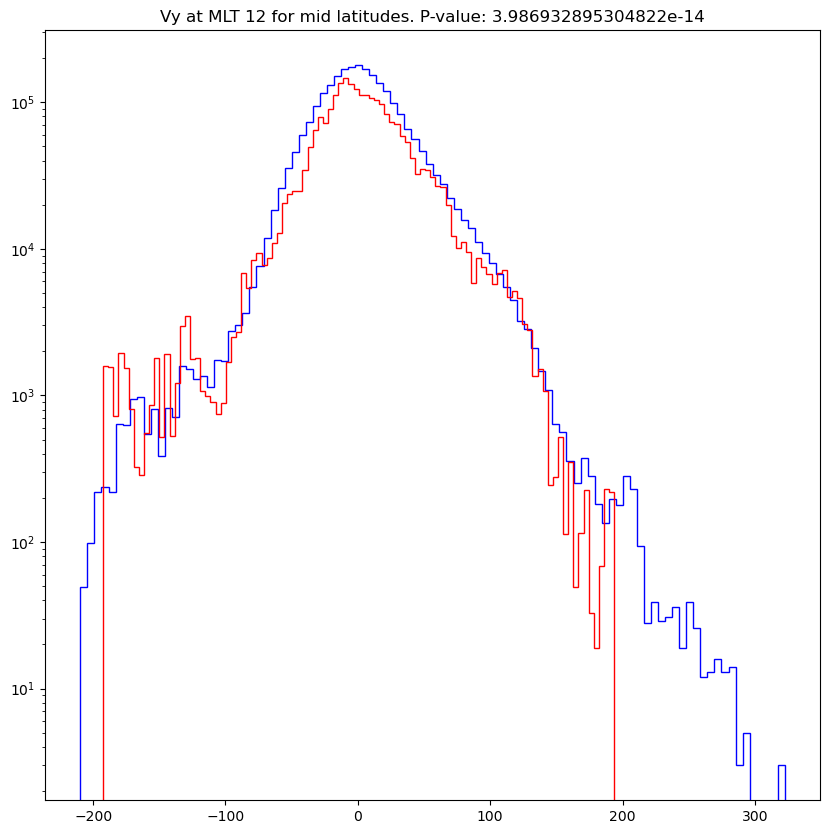

In [ ]:
lower_lat_bound = 55
upper_lat_bound = 68
var = 'BY_GSM'
lat = 'mid'
mlt = 12
mlt_x = X_df[X_df['MLT'] == mlt]
# x_df = X_df[X_df['MLT'] != mlt]
# mlt_pos = pos_mean_df[pos_mean_df['MLT'] == mlt] 
if lat == 'low':
	mlt_x = mlt_x[mlt_x['MLAT'] < lower_lat_bound]
	# mlt_pos = mlt_pos[mlt_pos['MLAT'] < lower_lat_bound]
	x_df = X_df[X_df['MLAT'] < lower_lat_bound]
elif lat == 'mid':
	mlt_x = mlt_x[(mlt_x['MLAT'] >= lower_lat_bound) & (mlt_x['MLAT'] <= upper_lat_bound)]
	# mlt_pos = mlt_pos[(mlt_pos['MLAT'] >= lower_lat_bound) & (mlt_pos['MLAT'] <= upper_lat_bound)]
	x_df = X_df[(X_df['MLAT'] >= lower_lat_bound) & (X_df['MLAT'] <= upper_lat_bound)]
else:
	mlt_x = mlt_x[mlt_x['MLAT'] > upper_lat_bound]
	# mlt_pos = mlt_pos[mlt_pos['MLAT'] > upper_lat_bound]
	x_df = X_df[X_df['MLAT'] > upper_lat_bound]
print(x_df.shape, mlt_x.shape)
null_samples = np.random.choice(x_df[var], size=mlt_x.shape[0], replace=False)
# mlt_samples = np.random.choice(mlt_x[var], size=200000, replace=False)
t_stat, p_val = ttest_ind(null_samples, mlt_x[var], alternative='two-sided')

# t_stat, p_val = ttest_ind(x_df[var], mlt_x[var], equal_var=False)
print(f'T-statistic: {t_stat}, P-value: {p_val}')

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plt.title(f'{var} at MLT {mlt} for {lat} latitudes. P-value: {p_val}')
plt.hist(null_samples, bins=100, color='b', label='All', histtype='step', log=True, density=False)
plt.hist(mlt_x[var], bins=100, color='r', label='Positive', histtype='step', log=True, density=False)
plt.show()

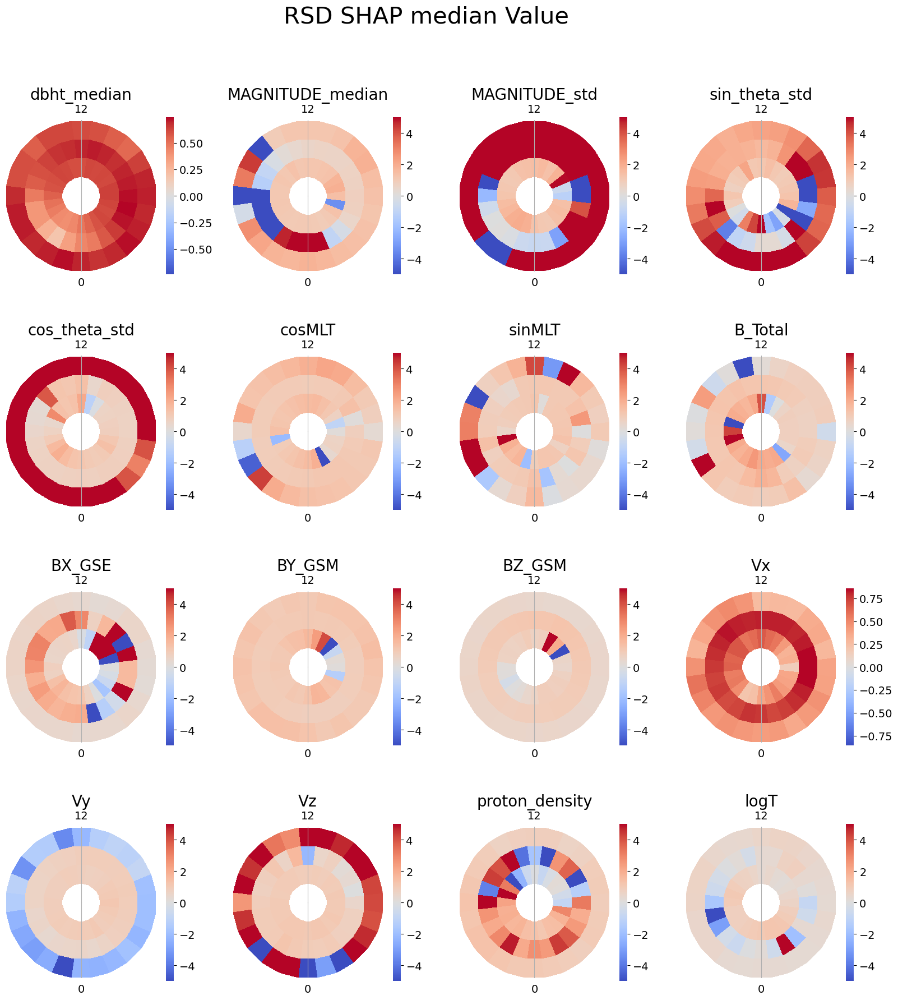

In [ ]:
# plotting the results
stat = 'median'
names = ['low', 'mid', 'high']
with open(f'{working_dir}outputs/dbht_all_shap_values.pkl', 'rb') as f:
	dbht = pickle.load(f)
with open(f'{working_dir}outputs/rsd_all_shap_values.pkl', 'rb') as f:
	rsd = pickle.load(f)

features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
# print(pos_shap_dict['dbht_median']['high'][0]['mean'])

pos_plotting_dict = {feat:pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']) for feat in features}
non_plotting_dict = {feat:pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']) for feat in features}
# pos_plotting_dict['pixel_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank'])
# plotting_dict['mean_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high'])
for (key, value), (non_key, non_value) in zip(pos_plotting_dict.items(), non_plotting_dict.items()):
	if key == 'pixel_ion' or key == 'mean_ion':
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = pos_pixel_dict[name][j][stat] if key == 'pixel_ion' else pos_mean_dict[name][j][stat]
	else:
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = rsd[key][name][j][stat]/dbht[key][name][j][stat]
				non_value.loc[j, name] = 0
			

old_plotting_norm = mpl.colors.Normalize(vmin=0, vmax=0.013)
# plotting_norm = None

# plotting the results as polar heatmap with MLT=12 at the top of the plot, low mid and high as three different rings
rad = [0,1,2,3]
# theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
theta_ticks = np.linspace(0, 2*np.pi, 2, endpoint=False)
# theta_labels = ['0', '3', '6', '9', '12', '15', '18', '21']
theta_labels = ['0','12']

# setting global plotting params
mpl.rcParams['axes.linewidth'] = 0
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.titlesize'] = 20
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14

fig, axs = plt.subplots(4,4, figsize=(20,20), subplot_kw=dict(projection='polar'))
fig.suptitle(f'RSD SHAP {stat} Value', fontsize=30)

for i, ((key,value), (non_key, non_value)) in enumerate(zip(pos_plotting_dict.items(), non_plotting_dict.items())):
	ax = axs[i//4, i%4]

	# Plotting the shap contributions on a polar plot
	ax.set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	scale = max(value.max().max(), np.abs(value.min().min()), non_value.max().max(), np.abs(non_value.min().min()))
	if scale >= 5:
		scale = 5
	# if stat != 'std':
	# 	plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
	# 	cmap='coolwarm'
	# else:
	# 	plotting_norm = mpl.colors.Normalize(vmin=0, vmax=scale)
	# 	cmap='magma'
	if (value.max().max() > 0) and (value.min().min() < 0):
		plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
		cmap='coolwarm'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=value.min().min(), vmax=value.max().max())
		cmap='magma'

	# plotting_norm = mpl.colors.Normalize(vmin=1/scale, vmax=scale)
	if scale > 1/scale:
		plotting_norm = mpl.colors.TwoSlopeNorm(vmin=1/scale, vcenter=1, vmax=scale)
	else:
		plotting_norm = mpl.colors.TwoSlopeNorm(vmin=scale, vcenter=1, vmax=1/scale)
	plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
	cmap='coolwarm'
	cbar = fig.colorbar(ax.pcolormesh(th, r, value.astype(float), cmap=cmap, norm=plotting_norm), ax=ax)
	if key == 'pixel_ion':
		ax.set_title('Ion Temp')
	else:
		ax.set_title(key)
	ax.invert_yaxis()
	ax.set_xticks(theta_ticks)
	ax.set_xticklabels(theta_labels)
	ax.set_yticks([])
# plt.show()
plt.subplots_adjust(hspace=0.5)
plt.savefig(f'plots/all_shap_ratio_polar_plot_{stat}.png')


# neg_plotting_dict = {feat:pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']) for feat in features}
# neg_plotting_dict['pixel_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank'])
# # plotting_dict['mean_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high'])
# for key, value in neg_plotting_dict.items():
# 	if key == 'pixel_ion' or key == 'mean_ion':
# 		for i, name in enumerate(names):
# 			for j in range(0, 24):
# 				value.loc[j, name] = neg_pixel_dict[name][j][stat] if key == 'pixel_ion' else neg_mean_dict[name][j][stat]
# 	else:
# 		for i, name in enumerate(names):
# 			for j in range(0, 24):
# 				value.loc[j, name] = neg_shap_dict[key][name][j][stat]

# old_plotting_norm = mpl.colors.Normalize(vmin=0, vmax=0.013)
# # plotting_norm = None

# # plotting the results as polar heatmap with MLT=12 at the top of the plot, low mid and high as three different rings
# rad = [0,1,2,3]
# # theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
# theta_ticks = np.linspace(0, 2*np.pi, 2, endpoint=False)
# # theta_labels = ['0', '3', '6', '9', '12', '15', '18', '21']
# theta_labels = ['0','12']

# # setting global plotting params
# mpl.rcParams['axes.linewidth'] = 0
# mpl.rcParams['font.size'] = 14
# mpl.rcParams['axes.titlesize'] = 20
# mpl.rcParams['axes.labelsize'] = 16
# mpl.rcParams['xtick.labelsize'] = 14

# fig, axs = plt.subplots(4,4, figsize=(20,20), subplot_kw=dict(projection='polar'))
# fig.suptitle(f'Neg {stat.upper()} Shap Contributions', fontsize=30)

# for i, (key,value) in enumerate(neg_plotting_dict.items()):
# 	ax = axs[i//4, i%4]

# 	# Plotting the shap contributions on a polar plot
# 	ax.set_theta_zero_location('S')
# 	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
# 	scale = max(value.max().max(), np.abs(value.min().min()))
# 	if stat != 'std':
# 		plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
# 		cmap='coolwarm'
# 	else:
# 		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=scale)
# 		cmap='magma'
# 	cbar = fig.colorbar(ax.pcolormesh(th, r, value.astype(float), cmap=cmap, norm=plotting_norm), ax=ax)
# 	if key == 'pixel_ion':
# 		ax.set_title('Ion Temp')
# 	else:
# 		ax.set_title(key)
# 	ax.invert_yaxis()
# 	ax.set_xticks(theta_ticks)
# 	ax.set_xticklabels(theta_labels)
# 	ax.set_yticks([])

# plt.savefig(f'plots/neg_shap_polar_plot_{stat}.png')

In [ ]:
# plotting the results
stat = 'mean'


high_plotting_dict = {feat:pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']) for feat in features}
# high_plotting_dict['pixel_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank'])
# plotting_dict['mean_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high'])
for key, value in high_plotting_dict.items():
	if key == 'pixel_ion' or key == 'mean_ion':
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = high_pixel_dict[name][j][stat] if key == 'pixel_ion' else high_mean_dict[name][j][stat]
	else:
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = high_shap_dict[key][name][j][stat]

old_plotting_norm = mpl.colors.Normalize(vmin=0, vmax=0.013)
# plotting_norm = None

# plotting the results as polar heatmap with MLT=12 at the top of the plot, low mid and high as three different rings
rad = [0,1,2,3]
# theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
theta_ticks = np.linspace(0, 2*np.pi, 2, endpoint=False)
# theta_labels = ['0', '3', '6', '9', '12', '15', '18', '21']
theta_labels = ['0','12']

# setting global plotting params
mpl.rcParams['axes.linewidth'] = 0
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.titlesize'] = 20
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14

fig, axs = plt.subplots(4,4, figsize=(20,20), subplot_kw=dict(projection='polar'))
fig.suptitle(f'High {stat.upper()} Shap Contributions', fontsize=30)

for i, (key,value) in enumerate(high_plotting_dict.items()):
	ax = axs[i//4, i%4]

	# Plotting the shap contributions on a polar plot
	ax.set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	scale = max(value.max().max(), np.abs(value.min().min()))
	if stat != 'std':
		plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
		cmap='coolwarm'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=scale)
		cmap='magma'
	cbar = fig.colorbar(ax.pcolormesh(th, r, value.astype(float), cmap=cmap, norm=plotting_norm), ax=ax)
	if key == 'pixel_ion':
		ax.set_title('Ion Temp')
	else:
		ax.set_title(key)
	ax.invert_yaxis()
	ax.set_xticks(theta_ticks)
	ax.set_xticklabels(theta_labels)
	ax.set_yticks([])

plt.savefig(f'plots/high_shap_polar_plot_{stat}.png')


mid_plotting_dict = {feat:pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']) for feat in features}
# mid_plotting_dict['pixel_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank'])
# plotting_dict['mean_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high'])
for key, value in mid_plotting_dict.items():
	if key == 'pixel_ion' or key == 'mean_ion':
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = mid_pixel_dict[name][j][stat] if key == 'pixel_ion' else mid_mean_dict[name][j][stat]
	else:
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = mid_shap_dict[key][name][j][stat]

old_plotting_norm = mpl.colors.Normalize(vmin=0, vmax=0.013)
# plotting_norm = None

# plotting the results as polar heatmap with MLT=12 at the top of the plot, low mid and high as three different rings
rad = [0,1,2,3]
# theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
theta_ticks = np.linspace(0, 2*np.pi, 2, endpoint=False)
# theta_labels = ['0', '3', '6', '9', '12', '15', '18', '21']
theta_labels = ['0','12']

# setting global plotting params
mpl.rcParams['axes.linewidth'] = 0
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.titlesize'] = 20
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14

fig, axs = plt.subplots(4,4, figsize=(20,20), subplot_kw=dict(projection='polar'))
fig.suptitle(f'Mid {stat.upper()} Shap Contributions', fontsize=30)

for i, (key,value) in enumerate(mid_plotting_dict.items()):
	ax = axs[i//4, i%4]

	# Plotting the shap contributions on a polar plot
	ax.set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	scale = max(value.max().max(), np.abs(value.min().min()))
	if stat != 'std':
		plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
		cmap='coolwarm'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=scale)
		cmap='magma'
	cbar = fig.colorbar(ax.pcolormesh(th, r, value.astype(float), cmap=cmap, norm=plotting_norm), ax=ax)
	if key == 'pixel_ion':
		ax.set_title('Ion Temp')
	else:
		ax.set_title(key)
	ax.invert_yaxis()
	ax.set_xticks(theta_ticks)
	ax.set_xticklabels(theta_labels)
	ax.set_yticks([])

plt.savefig(f'plots/mid_shap_polar_plot_{stat}.png')


low_plotting_dict = {feat:pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']) for feat in features}
# low_plotting_dict['pixel_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank'])
# plotting_dict['mean_ion'] = pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high'])
for key, value in low_plotting_dict.items():
	if key == 'pixel_ion' or key == 'mean_ion':
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = low_pixel_dict[name][j][stat] if key == 'pixel_ion' else low_mean_dict[name][j][stat]
	else:
		for i, name in enumerate(names):
			for j in range(0, 24):
				value.loc[j, name] = low_shap_dict[key][name][j][stat]

old_plotting_norm = mpl.colors.Normalize(vmin=0, vmax=0.013)
# plotting_norm = None

# plotting the results as polar heatmap with MLT=12 at the top of the plot, low mid and high as three different rings
rad = [0,1,2,3]
# theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
theta_ticks = np.linspace(0, 2*np.pi, 2, endpoint=False)
# theta_labels = ['0', '3', '6', '9', '12', '15', '18', '21']
theta_labels = ['0','12']

# setting global plotting params
mpl.rcParams['axes.linewidth'] = 0
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.titlesize'] = 20
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14

fig, axs = plt.subplots(4,4, figsize=(20,20), subplot_kw=dict(projection='polar'))
fig.suptitle(f'Low {stat.upper()} Shap Contributions', fontsize=30)

for i, (key,value) in enumerate(low_plotting_dict.items()):
	ax = axs[i//4, i%4]

	# Plotting the shap contributions on a polar plot
	ax.set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	scale = max(value.max().max(), np.abs(value.min().min()))
	if stat != 'std':
		plotting_norm = mpl.colors.Normalize(vmin=-scale, vmax=scale)
		cmap='coolwarm'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=scale)
		cmap='magma'
	cbar = fig.colorbar(ax.pcolormesh(th, r, value.astype(float), cmap=cmap, norm=plotting_norm), ax=ax)
	if key == 'pixel_ion':
		ax.set_title('Ion Temp')
	else:
		ax.set_title(key)
	ax.invert_yaxis()
	ax.set_xticks(theta_ticks)
	ax.set_xticklabels(theta_labels)
	ax.set_yticks([])

plt.savefig(f'plots/low_shap_polar_plot_{stat}.png')

NameError: name 'high_shap_dict' is not defined

[-25.130929946899414, 12.239985942840576]
[-25.130929946899414, 12.239985942840576]
[-25.130929946899414, 12.239985942840576]


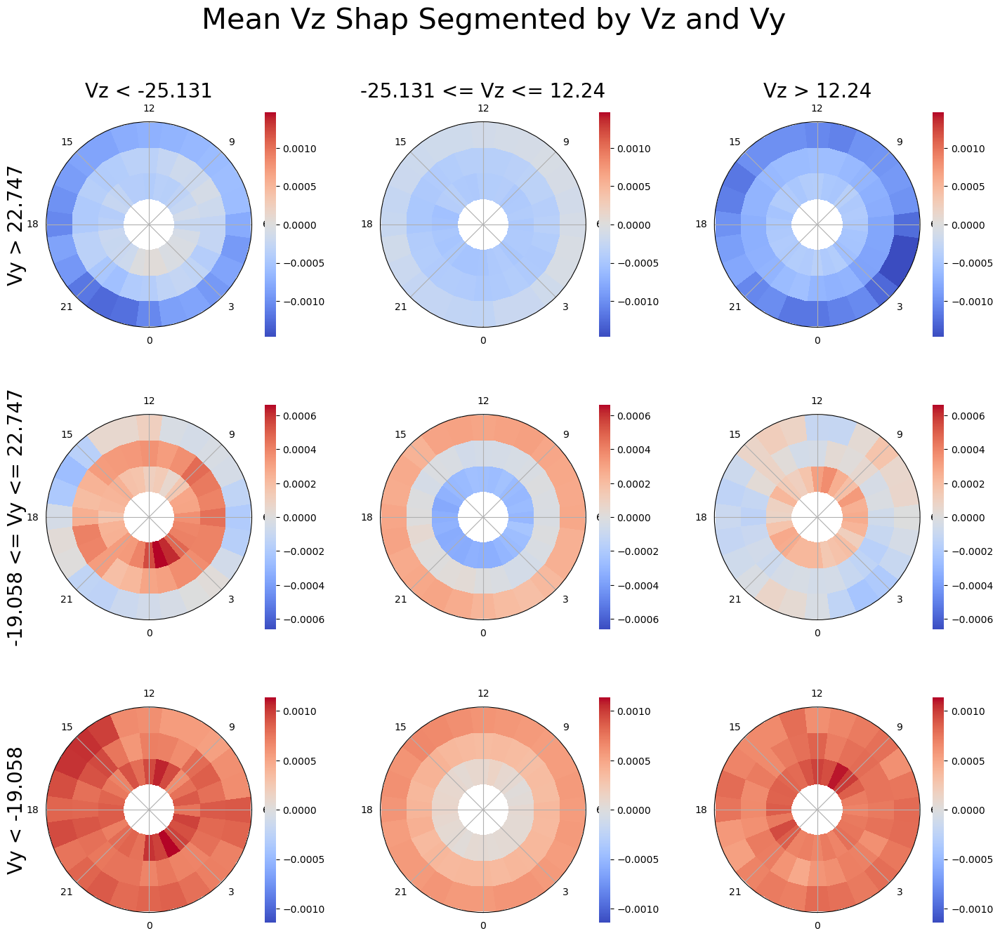

In [15]:
lower_lat_bound = 55
upper_lat_bound = 68
col_sep_var, row_sep_var = 'Vz', 'Vy'
col_sep_bins, row_sep_bins = None, None
col_sep_string, row_sep_string = r'Vz', 'Vy'
stat = 'mean'

if col_sep_bins == None:
	col_sep_bins = [X_df[col_sep_var].quantile(0.25), X_df[col_sep_var].quantile(0.75)]
	col_sep_bin_names = [str(X_df[col_sep_var].quantile(0.25).round(3)), str(X_df[col_sep_var].quantile(0.75).round(3))]
if row_sep_bins == None:
	row_sep_bins = [X_df[row_sep_var].quantile(0.25), X_df[row_sep_var].quantile(0.75)]
	row_sep_bin_names = [str(X_df[row_sep_var].quantile(0.25).round(3)), str(X_df[row_sep_var].quantile(0.75).round(3))]

def get_sep_var_and_lat_bins(df, sep_var, sep_var_bins, lower_lat_bound, upper_lat_bound):
	
	if sep_var_bins == None:
		sep_var_bins = [df[sep_var].quantile(0.25), df[sep_var].quantile(0.75)]

	if 'MLAT' not in df.columns:
		raise ValueError('MLAT column not found in the dataframe')
	if sep_var not in df.columns:
		raise ValueError(f'{sep_var} column not found in the dataframe')
	
	print(sep_var_bins)
	
	var_sep_low_mlat_low = df[(df['MLAT'] < lower_lat_bound) & (df[sep_var] < sep_var_bins[0])]
	var_sep_mid_mlat_low = df[(df['MLAT'] < lower_lat_bound) & (df[sep_var] >= sep_var_bins[0]) & (df[sep_var] <= sep_var_bins[1])]
	var_sep_high_mlat_low = df[(df['MLAT'] < lower_lat_bound) & (df[sep_var] > sep_var_bins[1])]
	var_sep_low_mlat_mid = df[(df['MLAT'] >= lower_lat_bound) & (df['MLAT'] <= upper_lat_bound) & (df[sep_var] < sep_var_bins[0])]
	var_sep_mid_mlat_mid = df[(df['MLAT'] >= lower_lat_bound) & (df['MLAT'] <= upper_lat_bound) & (df[sep_var] >= sep_var_bins[0]) & (df[sep_var] <= sep_var_bins[1])]
	var_sep_high_mlat_mid = df[(df['MLAT'] >= lower_lat_bound) & (df['MLAT'] <= upper_lat_bound) & (df[sep_var] > sep_var_bins[1])]
	var_sep_low_mlat_high = df[(df['MLAT'] > upper_lat_bound) & (df[sep_var] < sep_var_bins[0])]
	var_sep_mid_mlat_high = df[(df['MLAT'] > upper_lat_bound) & (df[sep_var] >= sep_var_bins[0]) & (df[sep_var] <= sep_var_bins[1])]
	var_sep_high_mlat_high = df[(df['MLAT'] > upper_lat_bound) & (df[sep_var] > sep_var_bins[1])]


	final_dict = {'low_mlat_low_sep': var_sep_low_mlat_low, 'low_mlat_mid_sep': var_sep_mid_mlat_low, 'low_mlat_high_sep': var_sep_high_mlat_low,
				  'mid_mlat_low_sep': var_sep_low_mlat_mid, 'mid_mlat_mid_sep': var_sep_mid_mlat_mid, 'mid_mlat_high_sep': var_sep_high_mlat_mid,
				  'high_mlat_low_sep': var_sep_low_mlat_high, 'high_mlat_mid_sep': var_sep_mid_mlat_high, 'high_mlat_high_sep': var_sep_high_mlat_high}
	
	return final_dict


def calculating_individual_mlt_metrics(dict, stat='mean'):

	results_dict = {'low_sep_var_df': pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']), 
					'mid_sep_var_df': pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']), 
					'high_sep_var_df': pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank'])}

	lats = ['low', 'mid', 'high', 'blank']
	var_seps = ['low', 'mid', 'high']

	# calculating the metrics for the low, mid and high latitudes
	for lat in lats:
		if lat == 'blank':
			continue
		for sep in var_seps:
			for i in range(0, 24):
				temp_df = dict[f'{lat}_mlat_{sep}_sep'][dict[f'{lat}_mlat_{sep}_sep']['MLT'] == i]
				try:
					if stat == 'mean':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['shap'].mean()
					elif stat == 'median':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['shap'].median()
					elif stat == 'std':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['shap'].std()
					elif stat == 'percentage':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['y_test'].sum()/temp_df['y_test'].count()

					else:
						raise ValueError(f'Stat: {stat} not recognized')

				except ValueError:
					print(f'No data found for {lat} lat and {sep} sep at {i} MLT')
					print(dict[f'{lat}_mlat_{sep}_sep'])
					results_dict[f'{sep}_sep_var_df'].loc[i,lat] = np.nan
					
			results_dict[f'{sep}_sep_var_df'] = results_dict[f'{sep}_sep_var_df'].astype(float)

	return results_dict

fig, axes = plt.subplots(3,3, figsize=(17, 15), subplot_kw=dict(projection='polar'))

feature_df = pd.DataFrame({'shap':mean_shap_df[col_sep_var], 
						col_sep_var:X_df[col_sep_var],
						row_sep_var:X_df[row_sep_var],
					'MLAT':mean_shap_df['MLAT'],
					'MLT':mean_shap_df['MLT'],
					'y_test':mean_shap_df['ytest']})

low_feature_df = feature_df[feature_df[row_sep_var] < row_sep_bins[0]]
mid_feature_df = feature_df[(feature_df[row_sep_var] >= row_sep_bins[0]) & (feature_df[row_sep_var] <= row_sep_bins[1])]
high_feature_df = feature_df[feature_df[row_sep_var] > row_sep_bins[1]]


low_shap_contribution_dict = get_sep_var_and_lat_bins(low_feature_df, col_sep_var, col_sep_bins, lower_lat_bound, upper_lat_bound)
mid_shap_contribution_dict = get_sep_var_and_lat_bins(mid_feature_df, col_sep_var, col_sep_bins, lower_lat_bound, upper_lat_bound)
high_shap_contribution_dict = get_sep_var_and_lat_bins(high_feature_df, col_sep_var, col_sep_bins, lower_lat_bound, upper_lat_bound)



low_results = calculating_individual_mlt_metrics(low_shap_contribution_dict, stat=stat)
mid_results = calculating_individual_mlt_metrics(mid_shap_contribution_dict, stat=stat)
high_results = calculating_individual_mlt_metrics(high_shap_contribution_dict, stat=stat)

# plotting the results as polar heatmap with MLT=12 at the top of the plot, low mid and high as three different rings
rad = [0,1,2,3]
theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
theta_labels = ['0', '3', '6', '9', '12', '15', '18', '21']

# setting global plotting params
mpl.rcParams['axes.linewidth'] = 0
mpl.rcParams['font.size'] = 10
mpl.rcParams['axes.titlesize'] = 15
mpl.rcParams['axes.labelsize'] = 10
mpl.rcParams['xtick.labelsize'] = 10


# plotting the results segmented by parameter values
plt.suptitle(f'{stat.capitalize()} {col_sep_string} Shap Segmented by {col_sep_string} and {row_sep_string}', fontsize=30)
low_scale, mid_scale, high_scale = max([low_results['low_sep_var_df'].max().max(), np.abs(low_results['low_sep_var_df'].min().min()),
									low_results['mid_sep_var_df'].max().max(), np.abs(low_results['mid_sep_var_df'].min().min()),
									low_results['high_sep_var_df'].max().max(), np.abs(low_results['high_sep_var_df'].min().min())]),\
									max([mid_results['low_sep_var_df'].max().max(), np.abs(mid_results['low_sep_var_df'].min().min()),
									mid_results['mid_sep_var_df'].max().max(), np.abs(mid_results['mid_sep_var_df'].min().min()),
									mid_results['high_sep_var_df'].max().max(), np.abs(mid_results['high_sep_var_df'].min().min())]),\
									max([high_results['low_sep_var_df'].max().max(), np.abs(high_results['low_sep_var_df'].min().min()),
									high_results['mid_sep_var_df'].max().max(), np.abs(high_results['mid_sep_var_df'].min().min()),
									high_results['high_sep_var_df'].max().max(), np.abs(high_results['high_sep_var_df'].min().min())])
# high_scale = high_scale-mid_scale
# low_scale = low_scale-mid_scale
# high_scale, mid_scale, low_scale = 0,0,0
# for j, (key, value) in enumerate(high_results.items()):
# 	temp_high_scale = max([(value-high_results['mid_sep_var_df']).max().max(), np.abs((value-high_results['mid_sep_var_df']).min().min())])
# 	if temp_high_scale > high_scale:
# 		high_scale = temp_high_scale
# for j, (key, value) in enumerate(mid_results.items()):
# 	temp_mid_scale = max([(value-mid_results['mid_sep_var_df']).max().max(), np.abs((value-mid_results['mid_sep_var_df']).min().min())])
# 	if temp_mid_scale > mid_scale:
# 		mid_scale = temp_mid_scale
# for j, (key, value) in enumerate(low_results.items()):
# 	temp_low_scale = max([(value-low_results['mid_sep_var_df']).max().max(), np.abs((value-low_results['mid_sep_var_df']).min().min())])
# 	if temp_low_scale > low_scale:
# 		low_scale = temp_low_scale

for j, (key, value) in enumerate(high_results.items()):
	if j == 0:
		axes[0,j].set_title(f'{col_sep_string} < {col_sep_bin_names[0]}', fontsize=20)
	elif j == 1:
		axes[0,j].set_title(f'{col_sep_bin_names[0]} <= {col_sep_string} <= {col_sep_bin_names[1]}', fontsize=20)
	else:
		axes[0,j].set_title(f'{col_sep_string} > {col_sep_bin_names[1]}', fontsize=20)
	if stat != 'std' and stat != 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=-high_scale, vmax=high_scale)
		cmap='coolwarm'
	elif stat == 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
		cmap='magma'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=high_scale)
		cmap='magma'
	axes[0,j].set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	# cbar = fig.colorbar(axes[0,j].pcolormesh(th, r, value - high_results['mid_sep_var_df'], cmap=cmap, norm=plotting_norm), ax=axes[0,j])
	cbar = fig.colorbar(axes[0,j].pcolormesh(th, r, value, cmap=cmap, norm=plotting_norm), ax=axes[0,j])
	
	axes[0,j].invert_yaxis()
	axes[0,j].set_xticks(theta_ticks)
	axes[0,j].set_xticklabels(theta_labels)
	axes[0,j].set_yticks([])
axes[0,0].set_ylabel(f'{row_sep_string} > {row_sep_bin_names[1]}', fontsize=20, labelpad=20)


for j, (key, value) in enumerate(mid_results.items()):
	if stat != 'std' and stat != 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=-mid_scale, vmax=mid_scale)
		cmap='coolwarm'
	elif stat == 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
		cmap='magma'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=mid_scale)
		cmap='magma'
	
	axes[1,j].set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	# cbar = fig.colorbar(axes[1,j].pcolormesh(th, r, value-mid_results['mid_sep_var_df'], cmap=cmap, norm=plotting_norm), ax=axes[1,j])
	cbar = fig.colorbar(axes[1,j].pcolormesh(th, r, value, cmap=cmap, norm=plotting_norm), ax=axes[1,j])
	
	axes[1,j].invert_yaxis()
	axes[1,j].set_xticks(theta_ticks)
	axes[1,j].set_xticklabels(theta_labels)
	axes[1,j].set_yticks([])
axes[1,0].set_ylabel(f'{row_sep_bin_names[0]} <= {row_sep_string} <= {row_sep_bin_names[1]}', fontsize=20, labelpad=20)

for j, (key, value) in enumerate(low_results.items()):
	if stat != 'std' and stat != 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=-low_scale, vmax=low_scale)
		cmap='coolwarm'
	elif stat == 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
		cmap='magma'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=low_scale)
		cmap='magma'
	axes[2,j].set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	# cbar = fig.colorbar(axes[2,j].pcolormesh(th, r, value-low_results['mid_sep_var_df'], cmap=cmap, norm=plotting_norm), ax=axes[2,j])
	cbar = fig.colorbar(axes[2,j].pcolormesh(th, r, value, cmap=cmap, norm=plotting_norm), ax=axes[2,j])
	
	axes[2,j].invert_yaxis()
	axes[2,j].set_xticks(theta_ticks)
	axes[2,j].set_xticklabels(theta_labels)
	axes[2,j].set_yticks([])
axes[2,0].set_ylabel(f'{row_sep_string} < {row_sep_bin_names[0]}', fontsize=20, labelpad=20)

plt.subplots_adjust(hspace=0.3, wspace=0.3)
plt.savefig(f'polar_shap_plots/new_rsd_{stat}_shap_input_seperated_{col_sep_var}_by_{row_sep_var}.png')


[-4.486166000366211, 3.7518211007118225]
[-4.486166000366211, 3.7518211007118225]
[-4.486166000366211, 3.7518211007118225]
[-4.486166000366211, 3.7518211007118225]


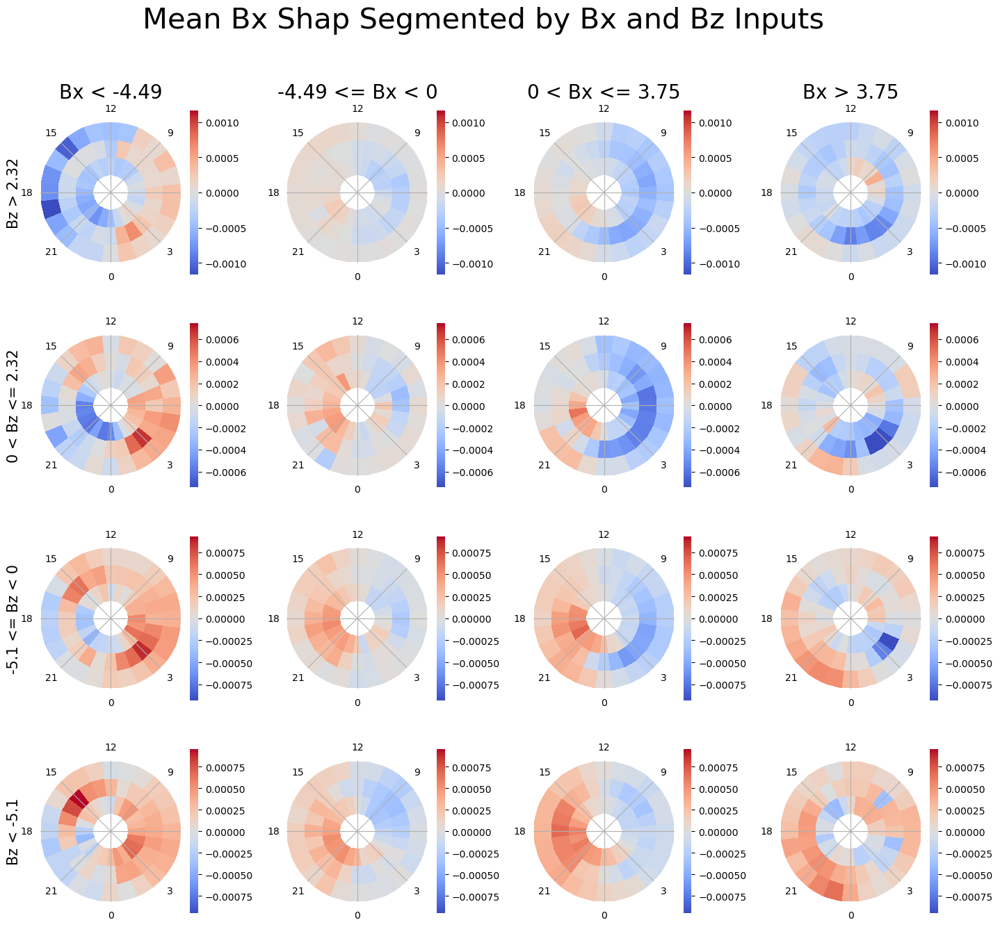

In [11]:
lower_lat_bound = 55
upper_lat_bound = 68
col_sep_var, row_sep_var = 'BX_GSE', 'BZ_GSM'
col_sep_bins, row_sep_bins = None, None
stat = 'mean'
col_sep_string, row_sep_string = 'Bx', 'Bz'

if col_sep_bins == None:
	col_sep_bins = [X_df[col_sep_var].quantile(0.25), X_df[col_sep_var].quantile(0.75)]
	col_sep_bin_names = [str(X_df[col_sep_var].quantile(0.25).round(2)), str(X_df[col_sep_var].quantile(0.75).round(2))]
if row_sep_bins == None:
	row_sep_bins = [X_df[row_sep_var].quantile(0.25), X_df[row_sep_var].quantile(0.75)]
	row_sep_bin_names = [str(X_df[row_sep_var].quantile(0.25).round(2)), str(X_df[row_sep_var].quantile(0.75).round(2))]

def get_sep_var_and_lat_bins_zero_split(df, sep_var, sep_var_bins, lower_lat_bound, upper_lat_bound):
	
	if sep_var_bins == None:
		sep_var_bins = [df[sep_var].quantile(0.25), df[sep_var].quantile(0.75)]

	if 'MLAT' not in df.columns:
		raise ValueError('MLAT column not found in the dataframe')
	if sep_var not in df.columns:
		raise ValueError(f'{sep_var} column not found in the dataframe')
	
	print(sep_var_bins)
	
	var_sep_low_mlat_low = df[(df['MLAT'] < lower_lat_bound) & (df[sep_var] < sep_var_bins[0])]
	var_sep_neg_mid_mlat_low = df[(df['MLAT'] < lower_lat_bound) & (df[sep_var] >= sep_var_bins[0]) & (df[sep_var] < 0)]
	var_sep_pos_mid_mlat_low = df[(df['MLAT'] < lower_lat_bound) & (df[sep_var] > 0) & (df[sep_var] <= sep_var_bins[1])]
	var_sep_high_mlat_low = df[(df['MLAT'] < lower_lat_bound) & (df[sep_var] > sep_var_bins[1])]
	var_sep_low_mlat_mid = df[(df['MLAT'] >= lower_lat_bound) & (df['MLAT'] <= upper_lat_bound) & (df[sep_var] < sep_var_bins[0])]
	var_sep_neg_mid_mlat_mid = df[(df['MLAT'] >= lower_lat_bound) & (df['MLAT'] <= upper_lat_bound) & (df[sep_var] >= sep_var_bins[0]) & (df[sep_var] < 0)]
	var_sep_pos_mid_mlat_mid = df[(df['MLAT'] >= lower_lat_bound) & (df['MLAT'] <= upper_lat_bound) & (df[sep_var] > 0) & (df[sep_var] <= sep_var_bins[1])]
	var_sep_high_mlat_mid = df[(df['MLAT'] >= lower_lat_bound) & (df['MLAT'] <= upper_lat_bound) & (df[sep_var] > sep_var_bins[1])]
	var_sep_low_mlat_high = df[(df['MLAT'] > upper_lat_bound) & (df[sep_var] < sep_var_bins[0])]
	var_sep_neg_mid_mlat_high = df[(df['MLAT'] > upper_lat_bound) & (df[sep_var] >= sep_var_bins[0]) & (df[sep_var] < 0)]
	var_sep_pos_mid_mlat_high = df[(df['MLAT'] > upper_lat_bound) & (df[sep_var] > 0) & (df[sep_var] <= sep_var_bins[1])]
	var_sep_high_mlat_high = df[(df['MLAT'] > upper_lat_bound) & (df[sep_var] > sep_var_bins[1])]


	final_dict = {'low_mlat_low_sep': var_sep_low_mlat_low, 'low_mlat_neg_mid_sep': var_sep_neg_mid_mlat_low, 'low_mlat_pos_mid_sep': var_sep_pos_mid_mlat_low, 'low_mlat_high_sep': var_sep_high_mlat_low,
				  'mid_mlat_low_sep': var_sep_low_mlat_mid, 'mid_mlat_neg_mid_sep': var_sep_neg_mid_mlat_mid, 'mid_mlat_pos_mid_sep': var_sep_pos_mid_mlat_mid, 'mid_mlat_high_sep': var_sep_high_mlat_mid,
				  'high_mlat_low_sep': var_sep_low_mlat_high, 'high_mlat_neg_mid_sep': var_sep_neg_mid_mlat_high, 'high_mlat_pos_mid_sep': var_sep_pos_mid_mlat_high, 'high_mlat_high_sep': var_sep_high_mlat_high}
	
	return final_dict


def calculating_individual_mlt_metrics_zero_split(dict, stat='mean'):

	results_dict = {'low_sep_var_df': pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']), 
					'neg_mid_sep_var_df': pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']),
					'pos_mid_sep_var_df': pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank']), 
					'high_sep_var_df': pd.DataFrame(index = range(24), columns = ['low', 'mid', 'high', 'blank'])}

	lats = ['low', 'mid', 'high', 'blank']
	var_seps = ['low', 'neg_mid', 'pos_mid', 'high']

	# calculating the metrics for the low, mid and high latitudes
	for lat in lats:
		if lat == 'blank':
			continue
		for sep in var_seps:
			for i in range(0, 24):
				temp_df = dict[f'{lat}_mlat_{sep}_sep'][dict[f'{lat}_mlat_{sep}_sep']['MLT'] == i]
				try:
					if stat == 'mean':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['shap'].mean()
					elif stat == 'median':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['shap'].median()
					elif stat == 'std':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['shap'].std()
					elif stat == 'percentage':
						results_dict[f'{sep}_sep_var_df'].loc[i,lat] = temp_df['y_test'].sum()/temp_df['y_test'].count()

					else:
						raise ValueError(f'Stat: {stat} not recognized')

				except ValueError:
					print(f'No data found for {lat} lat and {sep} sep at {i} MLT')
					print(dict[f'{lat}_mlat_{sep}_sep'])
					results_dict[f'{sep}_sep_var_df'].loc[i,lat] = np.nan
					
			results_dict[f'{sep}_sep_var_df'] = results_dict[f'{sep}_sep_var_df'].astype(float)

	return results_dict

fig, axes = plt.subplots(4,4, figsize=(17, 15), subplot_kw=dict(projection='polar'))

feature_df = pd.DataFrame({'shap':mean_shap_df[col_sep_var], 
							col_sep_var:X_df[col_sep_var],
							row_sep_var:X_df[row_sep_var],
							'MLAT':mean_shap_df['MLAT'],
							'MLT':mean_shap_df['MLT'],
							'y_test':mean_shap_df['ytest']})

low_feature_df = feature_df[feature_df[row_sep_var] < row_sep_bins[0]]
neg_mid_feature_df = feature_df[(feature_df[row_sep_var] >= row_sep_bins[0]) & (feature_df[row_sep_var] < 0)]
pos_mid_feature_df = feature_df[(feature_df[row_sep_var] > 0) & (feature_df[row_sep_var] <= row_sep_bins[1])]
high_feature_df = feature_df[feature_df[row_sep_var] > row_sep_bins[1]]


low_shap_contribution_dict = get_sep_var_and_lat_bins_zero_split(low_feature_df, col_sep_var, col_sep_bins, lower_lat_bound, upper_lat_bound)
neg_mid_shap_contribution_dict = get_sep_var_and_lat_bins_zero_split(neg_mid_feature_df, col_sep_var, col_sep_bins, lower_lat_bound, upper_lat_bound)
pos_mid_shap_contribution_dict = get_sep_var_and_lat_bins_zero_split(pos_mid_feature_df, col_sep_var, col_sep_bins, lower_lat_bound, upper_lat_bound)
high_shap_contribution_dict = get_sep_var_and_lat_bins_zero_split(high_feature_df, col_sep_var, col_sep_bins, lower_lat_bound, upper_lat_bound)


low_results = calculating_individual_mlt_metrics_zero_split(low_shap_contribution_dict, stat=stat)
neg_mid_results = calculating_individual_mlt_metrics_zero_split(neg_mid_shap_contribution_dict, stat=stat)
pos_mid_results = calculating_individual_mlt_metrics_zero_split(pos_mid_shap_contribution_dict, stat=stat)
high_results = calculating_individual_mlt_metrics_zero_split(high_shap_contribution_dict, stat=stat)

# plotting the results as polar heatmap with MLT=12 at the top of the plot, low mid and high as three different rings
rad = [0,1,2,3]
theta_ticks = np.linspace(0, 2*np.pi, 8, endpoint=False)
theta_labels = ['0', '3', '6', '9', '12', '15', '18', '21']

# setting global plotting params
mpl.rcParams['axes.linewidth'] = 0
mpl.rcParams['font.size'] = 10
mpl.rcParams['axes.titlesize'] = 15
mpl.rcParams['axes.labelsize'] = 10
mpl.rcParams['xtick.labelsize'] = 10


# plotting the results segmented by parameter values
plt.suptitle(f'{stat.capitalize()} {col_sep_string} Shap Segmented by {col_sep_string} and {row_sep_string} Inputs', fontsize=30)
low_scale, neg_mid_scale, pos_mid_scale, high_scale = max([low_results['low_sep_var_df'].max().max(), np.abs(low_results['low_sep_var_df'].min().min()),
									low_results['neg_mid_sep_var_df'].max().max(), np.abs(low_results['neg_mid_sep_var_df'].min().min()),
									low_results['pos_mid_sep_var_df'].max().max(), np.abs(low_results['pos_mid_sep_var_df'].min().min()),
									low_results['high_sep_var_df'].max().max(), np.abs(low_results['high_sep_var_df'].min().min())]),\
									max([neg_mid_results['low_sep_var_df'].max().max(), np.abs(neg_mid_results['low_sep_var_df'].min().min()),
									neg_mid_results['neg_mid_sep_var_df'].max().max(), np.abs(neg_mid_results['neg_mid_sep_var_df'].min().min()),
									neg_mid_results['pos_mid_sep_var_df'].max().max(), np.abs(neg_mid_results['pos_mid_sep_var_df'].min().min()),
									neg_mid_results['high_sep_var_df'].max().max(), np.abs(neg_mid_results['high_sep_var_df'].min().min())]),\
									max([pos_mid_results['low_sep_var_df'].max().max(), np.abs(pos_mid_results['low_sep_var_df'].min().min()),
									pos_mid_results['neg_mid_sep_var_df'].max().max(), np.abs(pos_mid_results['neg_mid_sep_var_df'].min().min()),
									pos_mid_results['pos_mid_sep_var_df'].max().max(), np.abs(pos_mid_results['pos_mid_sep_var_df'].min().min()),
									pos_mid_results['high_sep_var_df'].max().max(), np.abs(pos_mid_results['high_sep_var_df'].min().min())]),\
									max([high_results['low_sep_var_df'].max().max(), np.abs(high_results['low_sep_var_df'].min().min()),
									high_results['neg_mid_sep_var_df'].max().max(), np.abs(high_results['neg_mid_sep_var_df'].min().min()),
									high_results['pos_mid_sep_var_df'].max().max(), np.abs(high_results['pos_mid_sep_var_df'].min().min()),
									high_results['high_sep_var_df'].max().max(), np.abs(high_results['high_sep_var_df'].min().min())])
# high_scale = high_scale-mid_scale
# low_scale = low_scale-mid_scale
# high_scale, mid_scale, low_scale = 0,0,0
# for j, (key, value) in enumerate(high_results.items()):
# 	temp_high_scale = max([(value-high_results['mid_sep_var_df']).max().max(), np.abs((value-high_results['mid_sep_var_df']).min().min())])
# 	if temp_high_scale > high_scale:
# 		high_scale = temp_high_scale
# for j, (key, value) in enumerate(mid_results.items()):
# 	temp_mid_scale = max([(value-mid_results['mid_sep_var_df']).max().max(), np.abs((value-mid_results['mid_sep_var_df']).min().min())])
# 	if temp_mid_scale > mid_scale:
# 		mid_scale = temp_mid_scale
# for j, (key, value) in enumerate(low_results.items()):
# 	temp_low_scale = max([(value-low_results['mid_sep_var_df']).max().max(), np.abs((value-low_results['mid_sep_var_df']).min().min())])
# 	if temp_low_scale > low_scale:
# 		low_scale = temp_low_scale

for j, (key, value) in enumerate(high_results.items()):
	if j == 0:
		axes[0,j].set_title(f'{col_sep_string} < {col_sep_bin_names[0]}', fontsize=20)
	elif j == 1:
		axes[0,j].set_title(f'{col_sep_bin_names[0]} <= {col_sep_string} < 0', fontsize=20)
	elif j == 2:
		axes[0,j].set_title(f'0 < {col_sep_string} <= {col_sep_bin_names[1]}', fontsize=20)
	else:
		axes[0,j].set_title(f'{col_sep_string} > {col_sep_bin_names[1]}', fontsize=20)
	if stat != 'std' and stat != 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=-high_scale, vmax=high_scale)
		cmap='coolwarm'
	elif stat == 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
		cmap='magma'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=high_scale)
		cmap='magma'
	axes[0,j].set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	# cbar = fig.colorbar(axes[0,j].pcolormesh(th, r, value - high_results['mid_sep_var_df'], cmap=cmap, norm=plotting_norm), ax=axes[0,j])
	cbar = fig.colorbar(axes[0,j].pcolormesh(th, r, value, cmap=cmap, norm=plotting_norm), ax=axes[0,j])
	
	axes[0,j].invert_yaxis()
	axes[0,j].set_xticks(theta_ticks)
	axes[0,j].set_xticklabels(theta_labels)
	axes[0,j].set_yticks([])
axes[0,0].set_ylabel(f'{row_sep_string} > {row_sep_bin_names[1]}', fontsize=15, labelpad=20)

for j, (key, value) in enumerate(pos_mid_results.items()):
	if stat != 'std' and stat != 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=-pos_mid_scale, vmax=pos_mid_scale)
		cmap='coolwarm'
	elif stat == 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
		cmap='magma'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=pos_mid_scale)
		cmap='magma'
	
	axes[1,j].set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	# cbar = fig.colorbar(axes[1,j].pcolormesh(th, r, value-mid_results['mid_sep_var_df'], cmap=cmap, norm=plotting_norm), ax=axes[1,j])
	cbar = fig.colorbar(axes[1,j].pcolormesh(th, r, value, cmap=cmap, norm=plotting_norm), ax=axes[1,j])
	
	axes[1,j].invert_yaxis()
	axes[1,j].set_xticks(theta_ticks)
	axes[1,j].set_xticklabels(theta_labels)
	axes[1,j].set_yticks([])
axes[1,0].set_ylabel(f'0 < {row_sep_string} <= {row_sep_bin_names[1]}', fontsize=15, labelpad=20)


for j, (key, value) in enumerate(neg_mid_results.items()):
	if stat != 'std' and stat != 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=-neg_mid_scale, vmax=neg_mid_scale)
		cmap='coolwarm'
	elif stat == 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
		cmap='magma'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=neg_mid_scale)
		cmap='magma'
	
	axes[2,j].set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	# cbar = fig.colorbar(axes[1,j].pcolormesh(th, r, value-mid_results['mid_sep_var_df'], cmap=cmap, norm=plotting_norm), ax=axes[1,j])
	cbar = fig.colorbar(axes[2,j].pcolormesh(th, r, value, cmap=cmap, norm=plotting_norm), ax=axes[2,j])
	
	axes[2,j].invert_yaxis()
	axes[2,j].set_xticks(theta_ticks)
	axes[2,j].set_xticklabels(theta_labels)
	axes[2,j].set_yticks([])
axes[2,0].set_ylabel(f'{row_sep_bin_names[0]} <= {row_sep_string} < 0', fontsize=15, labelpad=20)

for j, (key, value) in enumerate(low_results.items()):
	if stat != 'std' and stat != 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=-low_scale, vmax=low_scale)
		cmap='coolwarm'
	elif stat == 'percentage':
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=1)
		cmap='magma'
	else:
		plotting_norm = mpl.colors.Normalize(vmin=0, vmax=low_scale)
		cmap='magma'
	axes[3,j].set_theta_zero_location('S')
	r,th = np.meshgrid(rad, np.linspace(0, 2*np.pi, 24, endpoint=False))
	# cbar = fig.colorbar(axes[2,j].pcolormesh(th, r, value-low_results['mid_sep_var_df'], cmap=cmap, norm=plotting_norm), ax=axes[2,j])
	cbar = fig.colorbar(axes[3,j].pcolormesh(th, r, value, cmap=cmap, norm=plotting_norm), ax=axes[3,j])
	
	axes[3,j].invert_yaxis()
	axes[3,j].set_xticks(theta_ticks)
	axes[3,j].set_xticklabels(theta_labels)
	axes[3,j].set_yticks([])
axes[3,0].set_ylabel(f'{row_sep_string} < {row_sep_bin_names[0]}', fontsize=15, labelpad=20)

plt.subplots_adjust(hspace=0.3, wspace=0.4)
plt.savefig(f'polar_shap_plots/new_rsd_{stat}_shap_input_seperated_{col_sep_var}_by_{row_sep_var}.png')


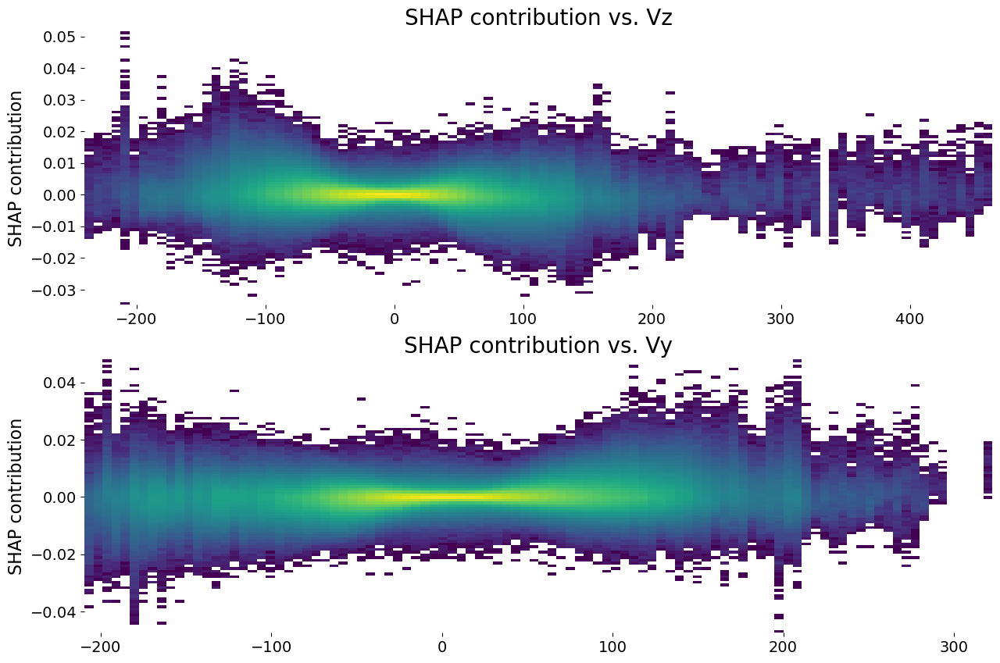

In [ ]:
feature = ['Vz', 'Vy']
# locating the colimn number of these features


fig, axes = plt.subplots(len(feature), 1, figsize=(15, 10))

for i, (ax, feat) in enumerate(zip(axes, feature)):
	if feat == 'pixel_ion':
		ax.hist2d(ion_temp_df['testing'], ion_temp_df['shap'], bins=100, cmap='viridis', norm=mpl.colors.LogNorm())
		ax.set_title(f'SHAP contribution vs. {feat}')
		ax.set_ylabel('SHAP contribution')
	else:
		ax.hist2d(X_df[feature[i]], mean_shap_df[feature[i]], bins=100, cmap='viridis', norm=mpl.colors.LogNorm())
		ax.set_title(f'SHAP contribution vs. {feature[i]}')
		ax.set_ylabel('SHAP contribution')
plt.savefig(f'plots/{feature[0]}_and_{feature[1]}')

In [ ]:
feature = 'cosMLT'

vmin = np.min([np.min(swmag_std_shap_df[feature]), np.min(swmag_mean_shap_df[feature])])
vmax = np.max([np.max(swmag_std_shap_df[feature]),np.max(swmag_mean_shap_df[feature])])

fig, axes = plt.subplot_mosaic("AB;DD", figsize=(15,10))
axes['A'].hist2d(transformed_X_df[feature], swmag_mean_shap_df[feature], bins=100, cmap='viridis', norm=mpl.colors.LogNorm())
axes['B'].hist2d(transformed_X_df[feature], swmag_std_shap_df[feature], bins=100, cmap='viridis', norm=mpl.colors.LogNorm())
plt.title(f'{feature}')
axes['A'].set_ylabel('Percent Contribution')
axes['A'].set_xlabel(feature)
axes['A'].set_xlim(np.min(transformed_X_df[feature]), np.max(transformed_X_df[feature]))
axes['A'].set_ylim(vmin, vmax)
axes['A'].set_title('Mean SHAP')

axes['B'].set_xlim(np.min(transformed_X_df[feature]), np.max(transformed_X_df[feature]))
axes['B'].set_ylim(vmin, vmax)
axes['B'].set_xlabel(feature)
axes['B'].set_ylabel('Percent Contribution')
axes['B'].set_title('STD SHAP')

axes['D'].set_title('Comparison')
axes['D'].hist(swmag_mean_shap_df[feature], bins=100, log=True, histtype='step', label='mean')
axes['D'].hist(swmag_std_shap_df[feature], bins=100, log=True, histtype='step', label='std')
axes['D'].set_ylabel('log count')
axes['D'].set_xlabel('Percent Contribution')
axes['D'].axvline(0, linestyle='--', color='k')
axes['D'].legend()

plt.tight_layout()
plt.savefig(f'plots/{feature}_swmag_shap_value_distributions.png')

# getting area under the curve of the 1D histograms
from sklearn.metrics import auc
mean_hist, mean_bins = np.histogram(swmag_mean_shap_df[feature], bins=100)
std_hist, std_bins = np.histogram(swmag_std_shap_df[feature], bins=100)
mean_area = auc(mean_bins[:-1], mean_hist)
std_area = auc(std_bins[:-1], std_hist)


NameError: name 'swmag_std_shap_df' is not defined

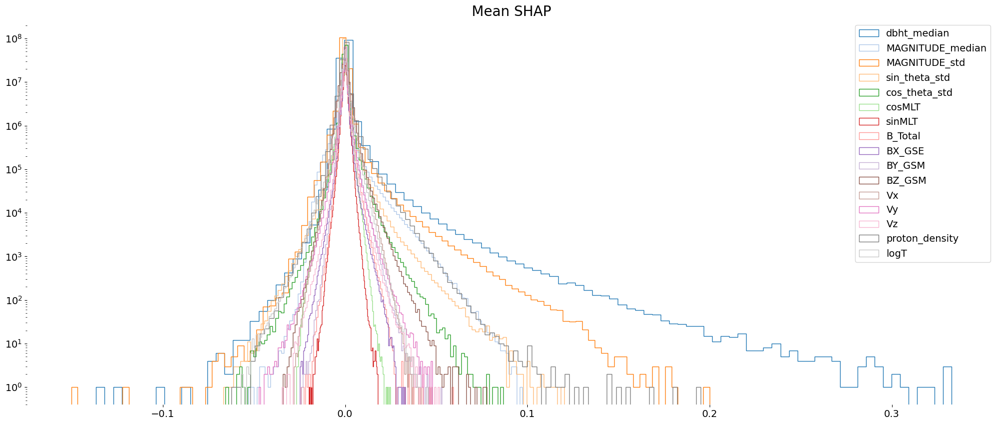

In [ ]:
colors = sns.color_palette('tab20')

fig, axes = plt.subplots(1,1, figsize=(25,10))

for i, col in enumerate(features):
	axes.hist(mean_shap_df[col], bins=100, log=True, histtype='step', label=col, color=colors[i])
	# axes[1].hist(swmag_std_shap_df[col], bins=100, log=True, histtype='step', label=col, color=colors[i])

axes.set_title('Mean SHAP')
# axes[1].set_title('STD SHAP')

axes.legend()
plt.show()

In [ ]:
# individual_cluster_to_examine = 'canadian_cluster'
features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
mean_shap_rsd, mean_shap_dbht, X, mu, sigma, error = [], [], [], [], [], []
dataframes_to_make = ['high', 'mid', 'low']
time_dict = {f'{feature}':{'dbht':{}, 'rsd':{}} for feature in features}
with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)
for feat in time_dict.keys():
	for df in dataframes_to_make:
		time_dict[feat]['rsd'][df] = pd.DataFrame()
		time_dict[feat]['dbht'][df] = pd.DataFrame()
for clust, cluster in cluster_dict.items():
	for reg, region in cluster_dict[clust]['regions'].items():
		if os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl'):
			with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl', 'rb') as f:
				shap_values = pickle.load(f)
				cluster['regions'][reg]['MLAT'] = utils.getting_mean_lat(region['stations'])
				cluster['regions'][reg]['shap'] = {}
				# cluster['regions'][reg]['shap']['testing_data'] = shap_values['testing_data']
				cluster['regions'][reg]['shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
				# cluster['regions'][key]['twins_shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][0][0][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
			# region[f'{model_type}_shap']['std_shap'] = np.concatenate([region[f'{model_type}_shap']['shap_values'][i][1][:,:,:,:] for i in range(len(region[f'{model_type}_shap']['shap_values']))], axis=0)

			for key in region['shap'].keys():
				if isinstance(region['shap'][key], torch.Tensor):
					region['shap'][key] = region['shap'][key].cpu().detach().numpy()

			try:
				region['shap']['mean_shap'] = region['shap']['mean_shap'].reshape(region['shap']['mean_shap'].shape[0], region['shap']['mean_shap'].shape[2], region['shap']['mean_shap'].shape[3])
				# region['shap']['std_shap'] = region['shap']['std_shap'].reshape(region['shap']['std_shap'].shape[0], region['shap']['std_shap'].shape[2], region['shap']['std_shap'].shape[3])
				# region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])

				mean_added = np.sum(np.sum(np.abs(region['shap']['mean_shap']), axis=1),axis=1)
				region['shap']['mean_shap'] = region['shap']['mean_shap']/mean_added[:,None,None]

				# std_added = np.sum(np.sum(np.abs(region['shap']['std_shap']), axis=1),axis=1)
				# region['shap']['std_shap'] = region['shap']['std_shap']/std_added[:,None,None]

			except:
				# print('We already did this, skipping....')
				pass

			# region_scaler = scalers[reg]['swmag']

			lat = 'high' if cluster['regions'][reg]['MLAT'] > 68 else 'mid' if cluster['regions'][reg]['MLAT'] > 55 else 'low'
			for v, var in enumerate(time_dict.keys()):
				time_dict[var]['rsd'][lat] = pd.concat([time_dict[var]['rsd'][lat], pd.DataFrame(region['shap']['mean_shap'][:,:,v])], axis=0)
				# time_dict[var]['std_shap_df'] = pd.concat([time_dict[var]['std_shap_df'], pd.DataFrame(region[f'{model_type}_shap']['std_shap'][:,:,v])], axis=0)
				# time_dict[var]['transformed_X_df'] = pd.concat([time_dict[var]['transformed_X_df'], \
				# 												pd.DataFrame(np.array([region_scaler.inverse_transform(region['shap']['testing_data'][i,:,:]) \
				# 												for i in range(region['shap']['testing_data'].shape[0])])[:,:,v])], axis=0)

			# mu.append(np.concatenate(concatenated_mu, axis=0))
			# sigma.append(np.concatenate(concatenated_sigma, axis=0))
			# error.append(np.concatenate(concatenated_error, axis=0))

			# mean_shap_rsd.append(np.concatenate(region['shap']['mean_shap'], axis=0))

		if os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2_dbht.pkl'):
			with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2_dbht.pkl', 'rb') as f:
				shap_values = pickle.load(f)

				cluster['regions'][reg]['MLAT'] = utils.getting_mean_lat(region['stations'])
				cluster['regions'][reg]['shap'] = {}
				# cluster['regions'][reg]['shap']['testing_data'] = shap_values['testing_data']
				cluster['regions'][reg]['shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
				# cluster['regions'][key]['twins_shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][0][0][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
			# region[f'{model_type}_shap']['std_shap'] = np.concatenate([region[f'{model_type}_shap']['shap_values'][i][1][:,:,:,:] for i in range(len(region[f'{model_type}_shap']['shap_values']))], axis=0)

			for key in region['shap'].keys():
				if isinstance(region['shap'][key], torch.Tensor):
					region['shap'][key] = region['shap'][key].cpu().detach().numpy()

			try:
				region['shap']['mean_shap'] = region['shap']['mean_shap'].reshape(region['shap']['mean_shap'].shape[0], region['shap']['mean_shap'].shape[2], region['shap']['mean_shap'].shape[3])
				# region['shap']['std_shap'] = region['shap']['std_shap'].reshape(region['shap']['std_shap'].shape[0], region['shap']['std_shap'].shape[2], region['shap']['std_shap'].shape[3])
				# region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])

				mean_added = np.sum(np.sum(np.abs(region['shap']['mean_shap']), axis=1),axis=1)
				region['shap']['mean_shap'] = region['shap']['mean_shap']/mean_added[:,None,None]

				# std_added = np.sum(np.sum(np.abs(region['shap']['std_shap']), axis=1),axis=1)
				# region['shap']['std_shap'] = region['shap']['std_shap']/std_added[:,None,None]

			except:
				# print('We already did this, skipping....')
				pass

			# region_scaler = scalers[reg]['swmag']

			lat = 'high' if cluster['regions'][reg]['MLAT'] > 68 else 'mid' if cluster['regions'][reg]['MLAT'] > 55 else 'low'
			for v, var in enumerate(time_dict.keys()):
				time_dict[var]['dbht'][lat] = pd.concat([time_dict[var]['dbht'][lat], pd.DataFrame(region['shap']['mean_shap'][:,:,v])], axis=0)
				# time_dict[var]['std_shap_df'] = pd.concat([time_dict[var]['std_shap_df'], pd.DataFrame(region[f'{model_type}_shap']['std_shap'][:,:,v])], axis=0)
				# time_dict[var]['transformed_X_df'] = pd.concat([time_dict[var]['transformed_X_df'], \
				# 												pd.DataFrame(np.array([region_scaler.inverse_transform(region['shap']['testing_data'][i,:,:]) \
				# 												for i in range(region['shap']['testing_data'].shape[0])])[:,:,v])], axis=0)

			# mu.append(np.concatenate(concatenated_mu, axis=0))
			# sigma.append(np.concatenate(concatenated_sigma, axis=0))
			# error.append(np.concatenate(concatenated_error, axis=0))

			# mean_shap_dbht.append(np.concatenate(region['shap']['mean_shap'], axis=0))
			# std_shap.append(np.concatenate(region[f'{model_type}_shap']['std_shap'], axis=0))
			# X.append(region_scaler.inverse_transform(np.concatenate(region['shap']['testing_data'], axis=0)))

		region = {}
		gc.collect()

time_columns = [f't-{60-i}' for i in range(0,60)]
for var in time_dict.keys():
	for df in time_dict[var]['dbht'].keys():
		print(f'Creating {var} {df} dataframe')
		time_dict[var]['rsd'][df].columns = time_columns
		time_dict[var]['dbht'][df].columns = time_columns

# mean_shap_rsd = np.concatenate(mean_shap_rsd, axis=0)
# mean_shap_dbht = np.concatenate(mean_shap_dbht, axis=0)
# std_shap = np.concatenate(std_shap, axis=0)
# X = np.concatenate(X, axis=0)
# mu = np.concatenate(mu, axis=0)
# sigma = np.concatenate(sigma, axis=0)
# error = np.concatenate(error, axis=0)

# mean_shap_rsd_df = pd.DataFrame(mean_shap_rsd, columns=features)
# mean_shap_dbht_df = pd.DataFrame(mean_shap_dbht, columns=features)
# std_shap_df = pd.DataFrame(std_shap, columns=shap_values['features'])
# transformed_X_df = pd.DataFrame(X, columns=features)
# mu_df = pd.DataFrame(mu, columns=shap_values['features'])
# sigma_df = pd.DataFrame(sigma, columns=shap_values['features'])
# error_df = pd.DataFrame(error, columns=shap_values['features'])



Loading station NEW....
Loading station T19....
Loading station C10....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station NEW....
Loading station T19....
Loading station C10....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station MEA....
Loading station T36....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station MEA....
Loading station T36....
Loading station GHB....
Loading station SKT....
Loading station STF....
Loading station ATU....
Loading station GHB....
Loading station SKT....
Loading station STF....
Loading station ATU....
Loading station SKT....
Loading station 

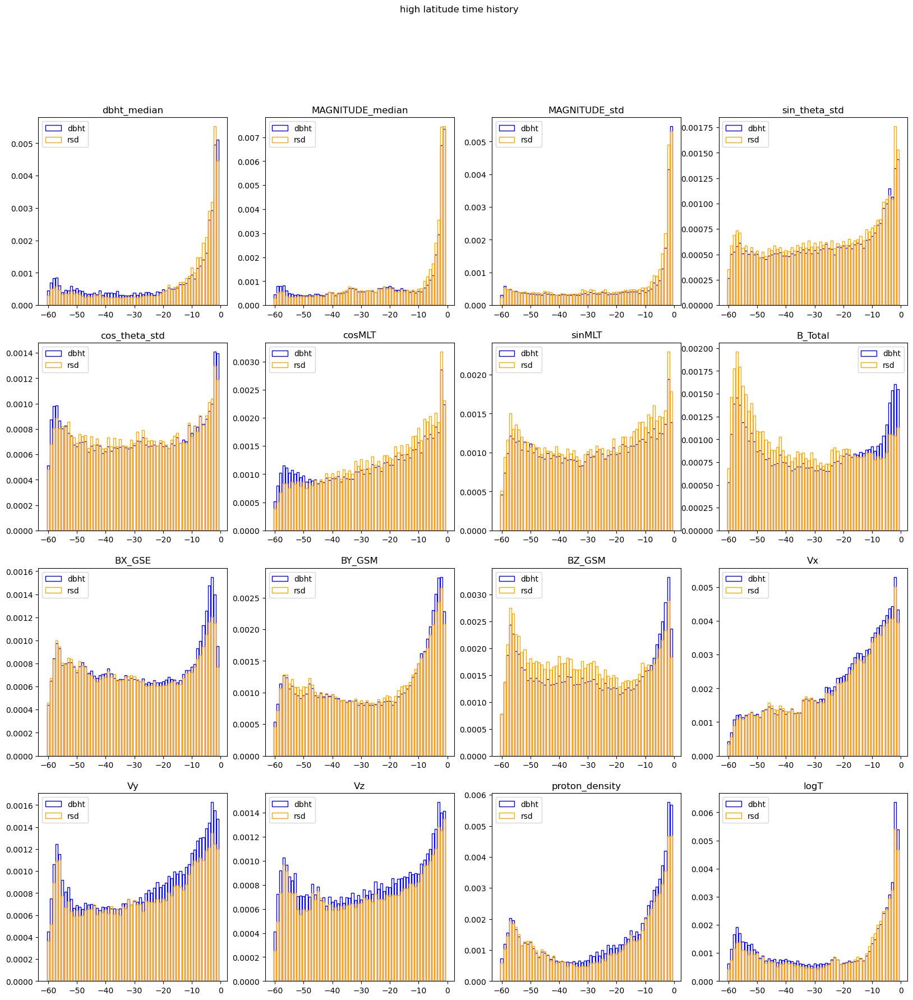

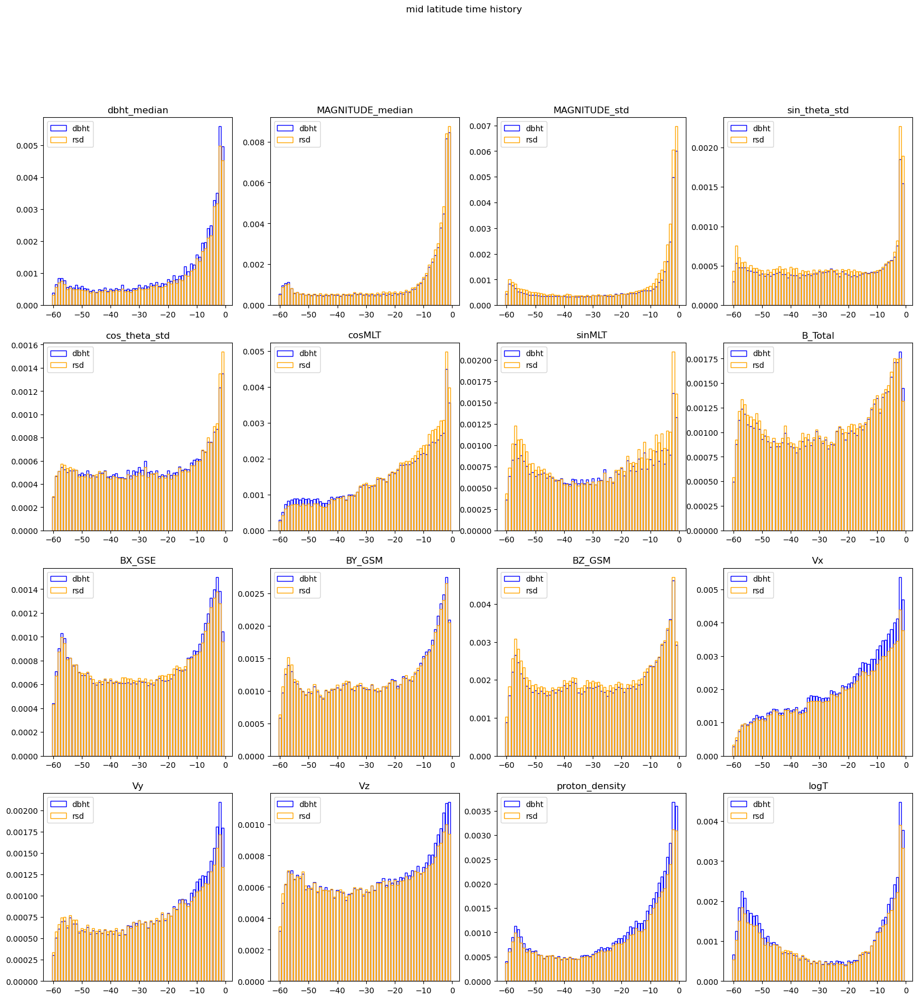

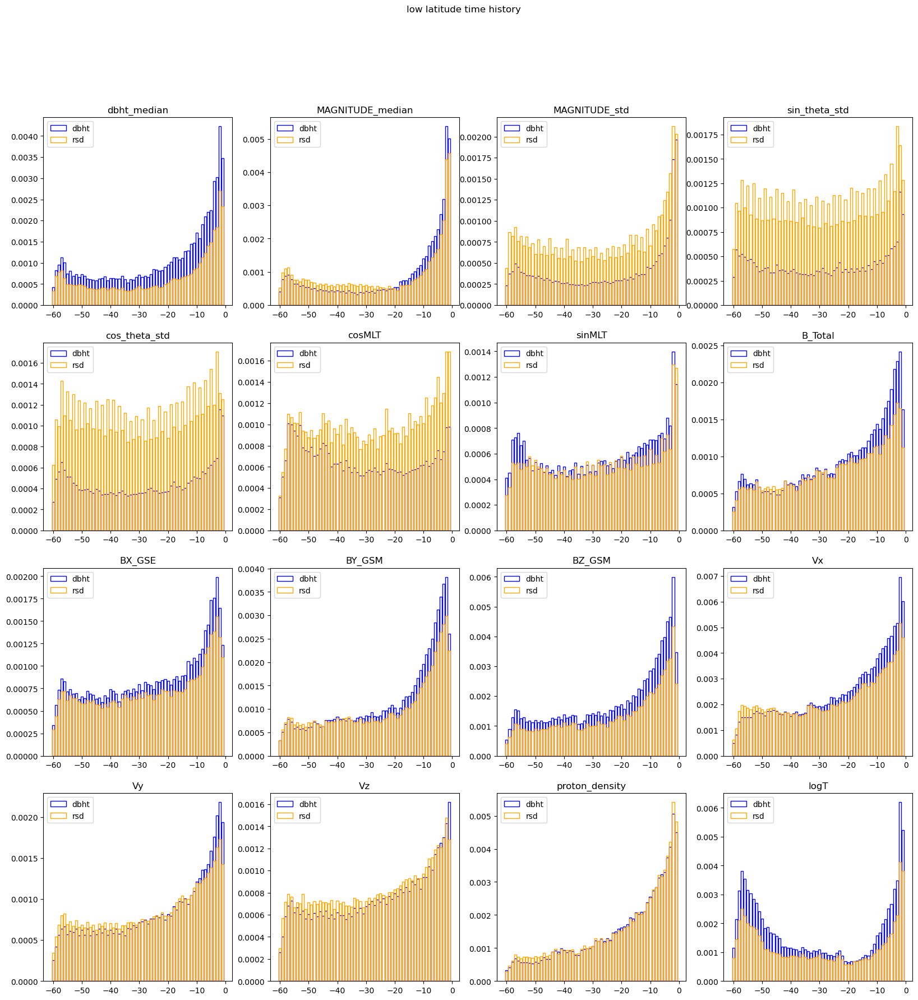

In [ ]:
# var = 'BY_GSM'
dfs = ['high', 'mid', 'low']

for df in dfs:
	fig, axes = plt.subplots(4, 4, figsize=(20,20))
	fig.suptitle(f'{df} latitude time history')
	for i, var in enumerate(time_dict.keys()):
		j = i//4
		k = i%4
		axes[j,k].bar([i-60 for i in range(0,60)], time_dict[var]['dbht'][df].abs().mean(axis=0), fill=False, label='dbht', edgecolor='b')
		axes[j,k].bar([i-60 for i in range(0,60)], time_dict[var]['rsd'][df].abs().mean(axis=0), fill=False, label='rsd', edgecolor='orange')
		axes[j,k].legend()
		axes[j,k].set_title(var)
	plt.savefig(f'plots/time_history_{df}.png')

In [ ]:
# individual_cluster_to_examine = 'canadian_cluster'
features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
mean_shap_rsd, mean_shap_dbht, X, mu, sigma, error = [], [], [], [], [], []
dataframes_to_make = ['high', 'mid', 'low']
total_dict = {'inputs':{'dbht':{}, 'rsd':{}}, 'shap_values':{'dbht':{}, 'rsd':{}}}
seg_dict = {f'{feature}':{'shap_values':{}, 'input_values':{}} for feature in features}
with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)
for feat in seg_dict.keys():
	for df in dataframes_to_make:
		seg_dict[feat]['input_values'][df] = pd.DataFrame()
		seg_dict[feat]['shap_values'][df] = pd.DataFrame()
		total_dict['inputs']['dbht'][df] = pd.DataFrame(columns=features)
		total_dict['inputs']['rsd'][df] = pd.DataFrame(columns=features)
		total_dict['shap_values']['dbht'][df] = pd.DataFrame(columns=features)
		total_dict['shap_values']['rsd'][df] = pd.DataFrame(columns=features)
for clust, cluster in cluster_dict.items():
	for reg, region in cluster_dict[clust]['regions'].items():
		if (os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl')) and (os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2_dbht.pkl')):
			with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl', 'rb') as f:
				rsd_shap_values = pickle.load(f)
			# with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-1_dbht.pkl', 'rb') as f:
			# 	dbht_shap_values = pickle.load(f)

				cluster['regions'][reg]['MLAT'] = utils.getting_mean_lat(region['stations'])
				cluster['regions'][reg]['shap'] = {}
				# cluster['regions'][reg]['shap']['testing_data'] = shap_values['testing_data']
				cluster['regions'][reg]['shap']['rsd_shap'] = np.concatenate([rsd_shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(rsd_shap_values['shap_values']))], axis=0)
				# cluster['regions'][reg]['shap']['dbht_shap'] = np.concatenate([dbht_shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(dbht_shap_values['shap_values']))], axis=0)
				# cluster['regions'][key]['twins_shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][0][0][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
			# region[f'{model_type}_shap']['std_shap'] = np.concatenate([region[f'{model_type}_shap']['shap_values'][i][1][:,:,:,:] for i in range(len(region[f'{model_type}_shap']['shap_values']))], axis=0)

			# finding the places where the rsd is positive adn dbht negative and extracting those indicies
			# rsd_pos_dbht_neg = np.where((rsd_shap_values['ytest'][:,1] == 1) & (dbht_shap_values['ytest'][:,1] == 0))
			# rsd_neg_dbht_pos = np.where((rsd_shap_values['ytest'][:,1] == 0) & (dbht_shap_values['ytest'][:,1] == 1))

			# cluster['regions'][reg]['shap']['rsd_shap'] = cluster['regions'][reg]['shap']['rsd_shap'][rsd_neg_dbht_pos]
			# cluster['regions'][reg]['shap']['dbht_shap'] = cluster['regions'][reg]['shap']['dbht_shap'][rsd_neg_dbht_pos]
			# cluster['regions'][reg]['shap']['testing_data'] = rsd_shap_values['testing_data'][rsd_neg_dbht_pos]
			cluster['regions'][reg]['shap']['testing_data'] = rsd_shap_values['testing_data']

			for key in region['shap'].keys():
				if isinstance(region['shap'][key], torch.Tensor):
					region['shap'][key] = region['shap'][key].cpu().detach().numpy()

			try:
				region['shap']['rsd_shap'] = region['shap']['rsd_shap'].reshape(region['shap']['rsd_shap'].shape[0], region['shap']['rsd_shap'].shape[2], region['shap']['rsd_shap'].shape[3])
				# region['shap']['dbht_shap'] = region['shap']['dbht_shap'].reshape(region['shap']['dbht_shap'].shape[0], region['shap']['dbht_shap'].shape[2], region['shap']['dbht_shap'].shape[3])
				# region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])
				# region['shap']['std_shap'] = region['shap']['std_shap'].reshape(region['shap']['std_shap'].shape[0], region['shap']['std_shap'].shape[2], region['shap']['std_shap'].shape[3])
				region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])

				rsd_mean_added = np.sum(np.sum(np.abs(region['shap']['rsd_shap']), axis=1),axis=1)
				# dbht_mean_added = np.sum(np.sum(np.abs(region['shap']['dbht_shap']), axis=1),axis=1)
				region['shap']['rsd_shap'] = region['shap']['rsd_shap']/rsd_mean_added[:,None,None]
				# region['shap']['dbht_shap'] = region['shap']['dbht_shap']/dbht_mean_added[:,None,None]

				# std_added = np.sum(np.sum(np.abs(region['shap']['std_shap']), axis=1),axis=1)
				# region['shap']['std_shap'] = region['shap']['std_shap']/std_added[:,None,None]

			except:
				# print('We already did this, skipping....')
				pass

			region_scaler = scalers[reg]['swmag']

			lat = 'high' if cluster['regions'][reg]['MLAT'] > 68 else 'mid' if cluster['regions'][reg]['MLAT'] > 55 else 'low'
			# for v, var in enumerate(seg_dict.keys()):
			# 	seg_dict[var]['shap_values'][lat] = pd.concat([seg_dict[var]['shap_values'][lat], pd.DataFrame(region['shap']['rsd_shap'][:,:,v])], axis=0)
			# 	seg_dict[var]['input_values'][lat] = pd.concat([seg_dict[var]['input_values'][lat], pd.DataFrame(region['shap']['testing_data'][:,:,v])], axis=0)
				# time_dict[var]['std_shap_df'] = pd.concat([time_dict[var]['std_shap_df'], pd.DataFrame(region[f'{model_type}_shap']['std_shap'][:,:,v])], axis=0)
				# time_dict[var]['transformed_X_df'] = pd.concat([time_dict[var]['transformed_X_df'], \
				# 												pd.DataFrame(np.array([region_scaler.inverse_transform(region['shap']['testing_data'][i,:,:]) \
				# 												for i in range(region['shap']['testing_data'].shape[0])])[:,:,v])], axis=0)
			# total_dict['inputs']['dbht'][lat] = pd.concat([total_dict['inputs']['dbht'][lat], pd.DataFrame(region_scaler.inverse_transform(np.concatenate(region['shap']['testing_data'][:,:,:])), columns=features)], axis=0)
			total_dict['inputs']['rsd'][lat] = pd.concat([total_dict['inputs']['rsd'][lat], pd.DataFrame(region_scaler.inverse_transform(np.concatenate(region['shap']['testing_data'][:,:,:])), columns=features)], axis=0)
			# total_dict['shap_values']['dbht'][lat] = pd.concat([total_dict['shap_values']['dbht'][lat], pd.DataFrame(np.concatenate(region['shap']['dbht_shap'][:,:,:]), columns=features)], axis=0)
			total_dict['shap_values']['rsd'][lat] = pd.concat([total_dict['shap_values']['rsd'][lat], pd.DataFrame(np.concatenate(region['shap']['rsd_shap'][:,:,:]), columns=features)], axis=0)
		region = {}
		gc.collect()

# time_columns = [f't-{60-i}' for i in range(0,60)]
# for var in seg_dict.keys():
# 	for df in seg_dict[var]['shap_values'].keys():
# 		print(f'Creating {var} {df} dataframe')
# 		seg_dict[var]['shap_values'][df].columns = time_columns
# 		seg_dict[var]['input_values'][df].columns = time_columns

for lat in ['high', 'mid', 'low']:
	# total_dict['inputs']['dbht'][lat].reset_index(drop=True, inplace=True)
	total_dict['inputs']['rsd'][lat].reset_index(drop=True, inplace=True)
	# total_dict['shap_values']['dbht'][lat].reset_index(drop=True, inplace=True)
	total_dict['shap_values']['rsd'][lat].reset_index(drop=True, inplace=True)

# dfs = ['high', 'mid', 'low']
# rsd_MI_dict = {feature:[] for feature in features}
# for col in total_dict['inputs']['rsd']['low'].columns:
# 	for df in dfs:
# 		rsd_MI_dict[col].append(mutual_info_regression(total_dict['inputs']['rsd'][df][col].to_numpy().reshape(-1,1), total_dict['shap_values']['rsd'][df][col].to_numpy())[0])



Loading station NEW....
Loading station T19....
Loading station C10....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station LET....
Loading station T03....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station T43....
Loading station RED....
Loading station C06....
Loading station MEA....
Loading station T36....
Loading station GHB....
Loading station SKT....
Loading station STF....
Loading station ATU....
Loading station SKT....
Loading station STF....
Loading station ATU....
Loading station GDH....
Loading station STF....
Loading station ATU....
Loading station GDH....
Loading station UMQ....
Loading station GHB....
Loading station FHB....
Loading station NAQ....
Loading station RVK....
Loading station LYC....
Loading station DON....
Loading station JCK....
Loading station HAN....
Loading station MEK....
Loading station OUJ....
Loading station NUR....
Loading station MAS....
Loading station NOR....
Loading station 

In [ ]:
# individual_cluster_to_examine = 'canadian_cluster'
features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
mean_shap_rsd, mean_shap_dbht, X, mu, sigma, error = [], [], [], [], [], []
dataframes_to_make = ['high', 'mid', 'low']
total_dict = {'inputs':{'dbht':{}, 'rsd':{}}, 'shap_values':{'dbht':{}, 'rsd':{}}}
seg_dict = {f'{feature}':{'shap_values':{}, 'input_values':{}} for feature in features}
with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)
for feat in seg_dict.keys():
	for df in dataframes_to_make:
		seg_dict[feat]['input_values'][df] = pd.DataFrame()
		seg_dict[feat]['shap_values'][df] = pd.DataFrame()
		# total_dict['inputs']['dbht'][df] = pd.DataFrame(columns=features)
		total_dict['inputs']['rsd'][df] = pd.DataFrame(columns=features)
		total_dict['shap_values']['dbht'][df] = pd.DataFrame(columns=features)
		total_dict['shap_values']['rsd'][df] = pd.DataFrame(columns=features)
for clust, cluster in cluster_dict.items():
	for reg, region in cluster_dict[clust]['regions'].items():
		if (os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl')) and (os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2_dbht.pkl')):
			# with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-1.pkl', 'rb') as f:
			# 	rsd_shap_values = pickle.load(f)
			with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2_dbht.pkl', 'rb') as f:
				dbht_shap_values = pickle.load(f)

				cluster['regions'][reg]['MLAT'] = utils.getting_mean_lat(region['stations'])
				cluster['regions'][reg]['shap'] = {}
				# cluster['regions'][reg]['shap']['testing_data'] = shap_values['testing_data']
				cluster['regions'][reg]['shap']['rsd_shap'] = np.concatenate([rsd_shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(rsd_shap_values['shap_values']))], axis=0)
				# cluster['regions'][reg]['shap']['dbht_shap'] = np.concatenate([dbht_shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(dbht_shap_values['shap_values']))], axis=0)
				# cluster['regions'][key]['twins_shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][0][0][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
			# region[f'{model_type}_shap']['std_shap'] = np.concatenate([region[f'{model_type}_shap']['shap_values'][i][1][:,:,:,:] for i in range(len(region[f'{model_type}_shap']['shap_values']))], axis=0)

			# finding the places where the rsd is positive adn dbht negative and extracting those indicies
			# rsd_pos_dbht_neg = np.where((rsd_shap_values['ytest'][:,1] == 1) & (dbht_shap_values['ytest'][:,1] == 0))
			# rsd_neg_dbht_pos = np.where((rsd_shap_values['ytest'][:,1] == 0) & (dbht_shap_values['ytest'][:,1] == 1))

			# cluster['regions'][reg]['shap']['rsd_shap'] = cluster['regions'][reg]['shap']['rsd_shap'][rsd_neg_dbht_pos]
			# cluster['regions'][reg]['shap']['dbht_shap'] = cluster['regions'][reg]['shap']['dbht_shap'][rsd_neg_dbht_pos]
			# cluster['regions'][reg]['shap']['testing_data'] = rsd_shap_values['testing_data'][rsd_neg_dbht_pos]
			cluster['regions'][reg]['shap']['testing_data'] = rsd_shap_values['testing_data']

			for key in region['shap'].keys():
				if isinstance(region['shap'][key], torch.Tensor):
					region['shap'][key] = region['shap'][key].cpu().detach().numpy()

			try:
				region['shap']['rsd_shap'] = region['shap']['rsd_shap'].reshape(region['shap']['rsd_shap'].shape[0], region['shap']['rsd_shap'].shape[2], region['shap']['rsd_shap'].shape[3])
				# region['shap']['dbht_shap'] = region['shap']['dbht_shap'].reshape(region['shap']['dbht_shap'].shape[0], region['shap']['dbht_shap'].shape[2], region['shap']['dbht_shap'].shape[3])
				region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])
				# region['shap']['std_shap'] = region['shap']['std_shap'].reshape(region['shap']['std_shap'].shape[0], region['shap']['std_shap'].shape[2], region['shap']['std_shap'].shape[3])
				# region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])

				rsd_mean_added = np.sum(np.sum(np.abs(region['shap']['rsd_shap']), axis=1),axis=1)
				# dbht_mean_added = np.sum(np.sum(np.abs(region['shap']['dbht_shap']), axis=1),axis=1)
				region['shap']['rsd_shap'] = region['shap']['rsd_shap']/rsd_mean_added[:,None,None]
				# region['shap']['dbht_shap'] = region['shap']['dbht_shap']/dbht_mean_added[:,None,None]

				# std_added = np.sum(np.sum(np.abs(region['shap']['std_shap']), axis=1),axis=1)
				# region['shap']['std_shap'] = region['shap']['std_shap']/std_added[:,None,None]

			except:
				# print('We already did this, skipping....')
				pass

			region_scaler = scalers[reg]['swmag']

			lat = 'high' if cluster['regions'][reg]['MLAT'] > 68 else 'mid' if cluster['regions'][reg]['MLAT'] > 55 else 'low'
			# for v, var in enumerate(seg_dict.keys()):
			# 	seg_dict[var]['shap_values'][lat] = pd.concat([seg_dict[var]['shap_values'][lat], pd.DataFrame(region['shap']['rsd_shap'][:,:,v])], axis=0)
			# 	seg_dict[var]['input_values'][lat] = pd.concat([seg_dict[var]['input_values'][lat], pd.DataFrame(region['shap']['testing_data'][:,:,v])], axis=0)
				# time_dict[var]['std_shap_df'] = pd.concat([time_dict[var]['std_shap_df'], pd.DataFrame(region[f'{model_type}_shap']['std_shap'][:,:,v])], axis=0)
				# time_dict[var]['transformed_X_df'] = pd.concat([time_dict[var]['transformed_X_df'], \
				# 												pd.DataFrame(np.array([region_scaler.inverse_transform(region['shap']['testing_data'][i,:,:]) \
				# 												for i in range(region['shap']['testing_data'].shape[0])])[:,:,v])], axis=0)
			# total_dict['inputs']['dbht'][lat] = pd.concat([total_dict['inputs']['dbht'][lat], pd.DataFrame(region_scaler.inverse_transform(np.concatenate(region['shap']['testing_data'][:,:,:])), columns=features)], axis=0)
			total_dict['inputs']['rsd'][lat] = pd.concat([total_dict['inputs']['rsd'][lat], pd.DataFrame(region_scaler.inverse_transform(np.concatenate(region['shap']['testing_data'][:,:,:])), columns=features)], axis=0)
			# total_dict['shap_values']['dbht'][lat] = pd.concat([total_dict['shap_values']['dbht'][lat], pd.DataFrame(np.concatenate(region['shap']['dbht_shap'][:,:,:]), columns=features)], axis=0)
			total_dict['shap_values']['rsd'][lat] = pd.concat([total_dict['shap_values']['rsd'][lat], pd.DataFrame(np.concatenate(region['shap']['rsd_shap'][:,:,:]), columns=features)], axis=0)
		region = {}
		gc.collect()

# time_columns = [f't-{60-i}' for i in range(0,60)]
# for var in seg_dict.keys():
# 	for df in seg_dict[var]['shap_values'].keys():
# 		print(f'Creating {var} {df} dataframe')
# 		seg_dict[var]['shap_values'][df].columns = time_columns
# 		seg_dict[var]['input_values'][df].columns = time_columns

for lat in ['high', 'mid', 'low']:
	# total_dict['inputs']['dbht'][lat].reset_index(drop=True, inplace=True)
	total_dict['inputs']['rsd'][lat].reset_index(drop=True, inplace=True)
	# total_dict['shap_values']['dbht'][lat].reset_index(drop=True, inplace=True)
	total_dict['shap_values']['rsd'][lat].reset_index(drop=True, inplace=True)

dfs = ['high', 'mid', 'low']
dbht_MI_dict = {feature:[] for feature in features}
for col in total_dict['inputs']['dbht']['low'].columns:
	for df in dfs:
		dbht_MI_dict[col].append(mutual_info_regression(total_dict['inputs']['dbht'][df][col].to_numpy().reshape(-1,1), total_dict['shap_values']['dbht'][df][col].to_numpy())[0])



NameError: name 'pickle' is not defined

In [ ]:
dfs = ['high', 'mid', 'low']
types = ['dbht', 'rsd']

dbht_ticks = [1, 4, 7]
rsd_ticks = [2, 5, 8]
label_ticks = [1.5, 4.5, 7.5]

fig, axes = plt.subplots(4, 4, figsize=(20,20))
fig.suptitle(r'mutual information between shap and input values ($y_{true}^{RSD}$ = 1, $y_{true}^{dB_H/dt}$ = 0)', fontsize=20)
for i, col in enumerate(total_dict['inputs']['dbht']['low'].columns):
	j = i//4
	k = i%4
	ax = axes[j,k]
	ax.bar(dbht_ticks, dbht_MI_dict[col], width=1, label='dbht')
	ax.bar(rsd_ticks, rsd_MI_dict[col], width=1, label='rsd')
	ax.set_xticks(label_ticks)
	ax.set_xticklabels(dfs)
	ax.set_title(col, fontsize=15)
	ax.legend()
	ax.set_ylabel('mutual information')
	ax.set_xlabel('latitude')
plt.subplots_adjust(hspace=0.5)
plt.savefig(f'plots/mutual_information_background_shap_input.png')		

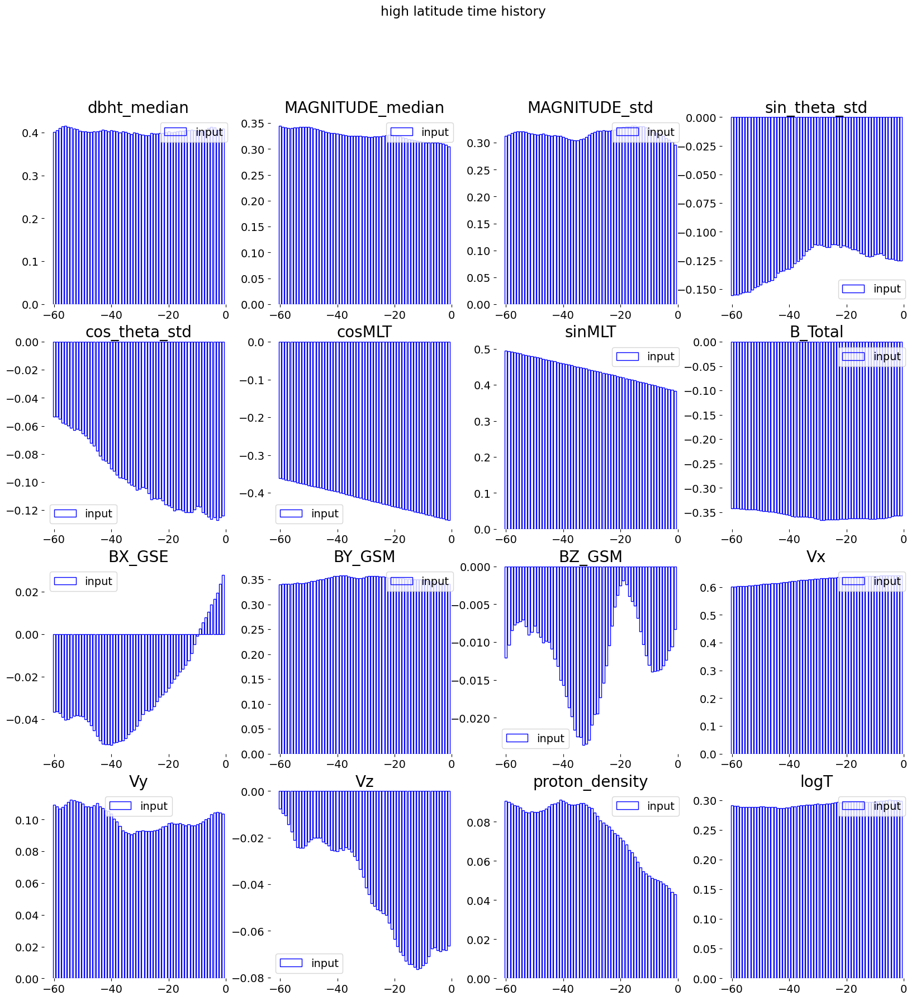

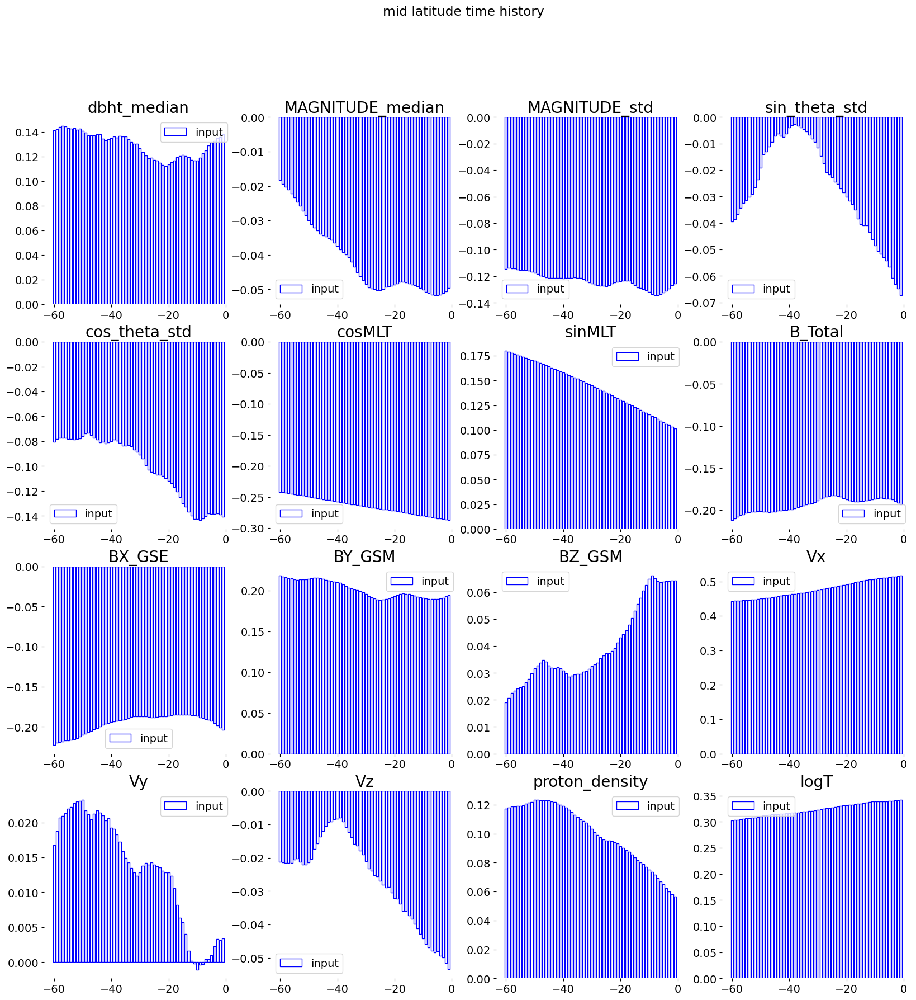

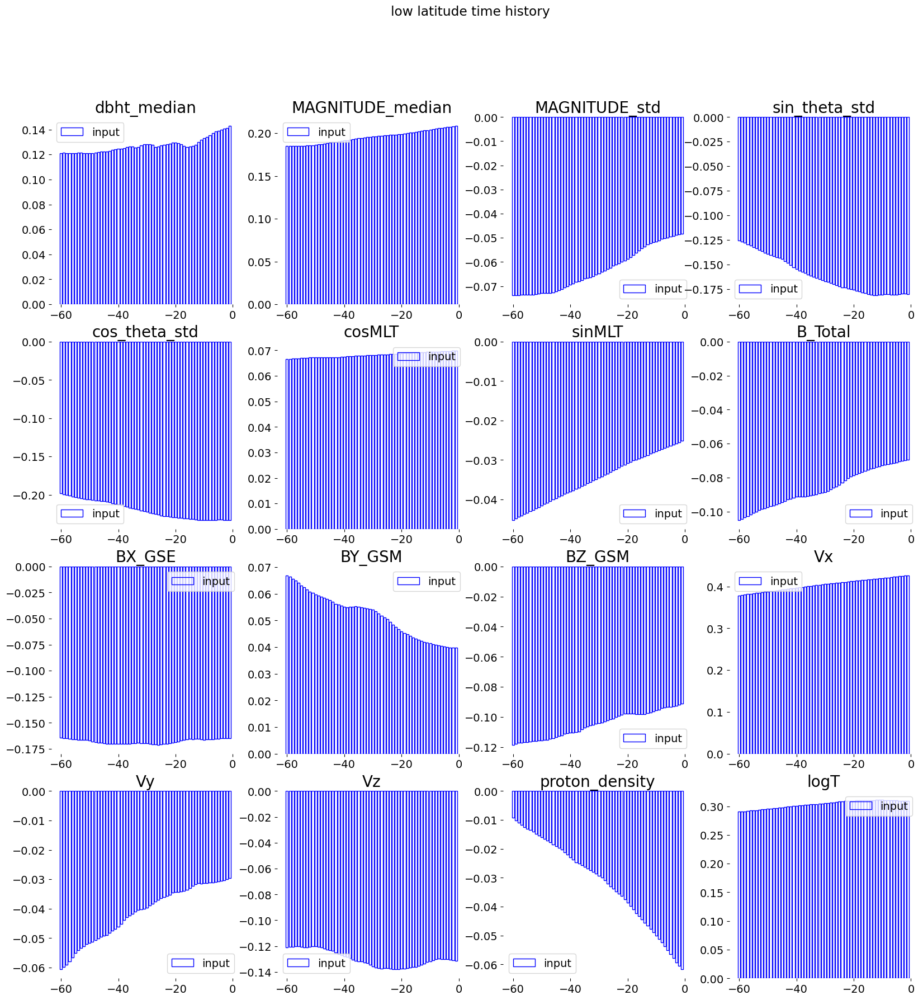

In [ ]:
# var = 'BY_GSM'
dfs = ['high', 'mid', 'low']
to_plot = 'input'

for df in dfs:
	fig, axes = plt.subplots(4, 4, figsize=(20,20))
	fig.suptitle(f'{df} latitude time history')
	for i, var in enumerate(seg_dict.keys()):
		j = i//4
		k = i%4
		axes[j,k].bar([i-60 for i in range(0,60)], seg_dict[var][f'{to_plot}_values'][df].mean(axis=0), fill=False, label=to_plot, edgecolor='b')
		# axes[j,k].bar([i-60 for i in range(0,60)], seg_dict[var]['rsd'][df].abs().mean(axis=0), fill=False, label='rsd', edgecolor='orange')
		axes[j,k].legend()
		axes[j,k].set_title(var)
	plt.savefig(f'plots/background_time_history_{df}.png')

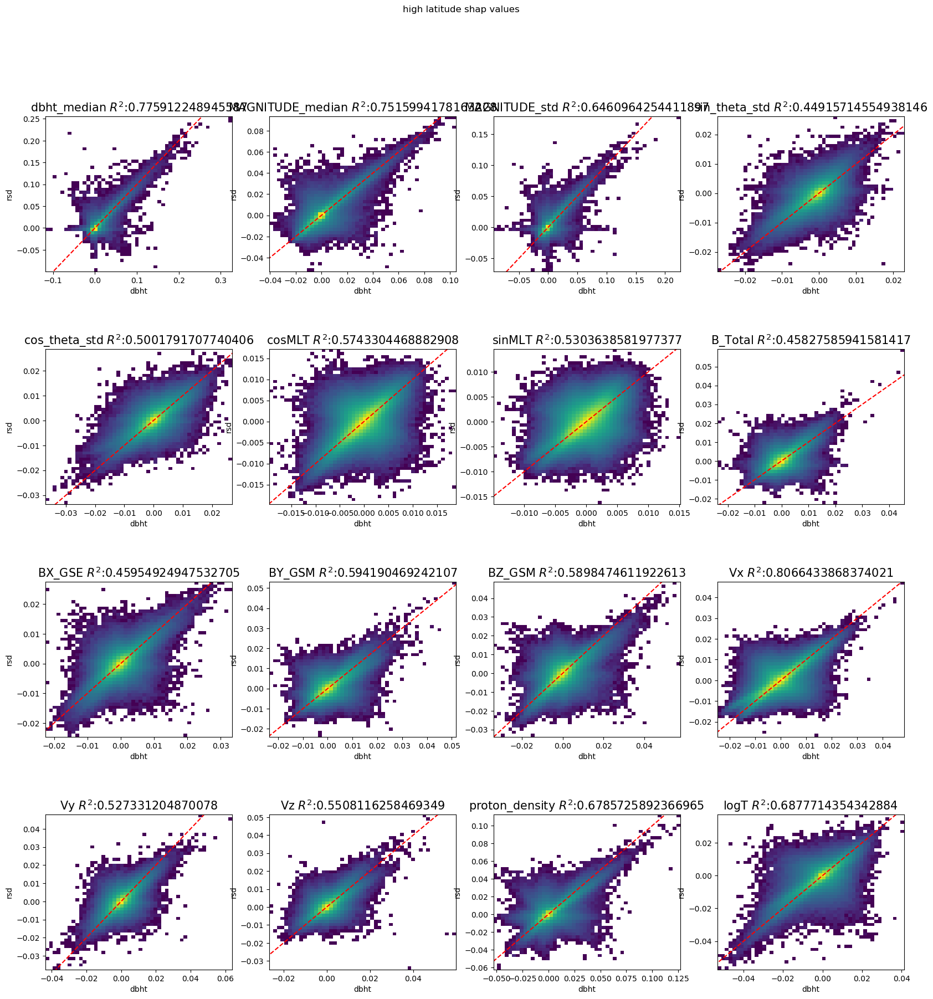

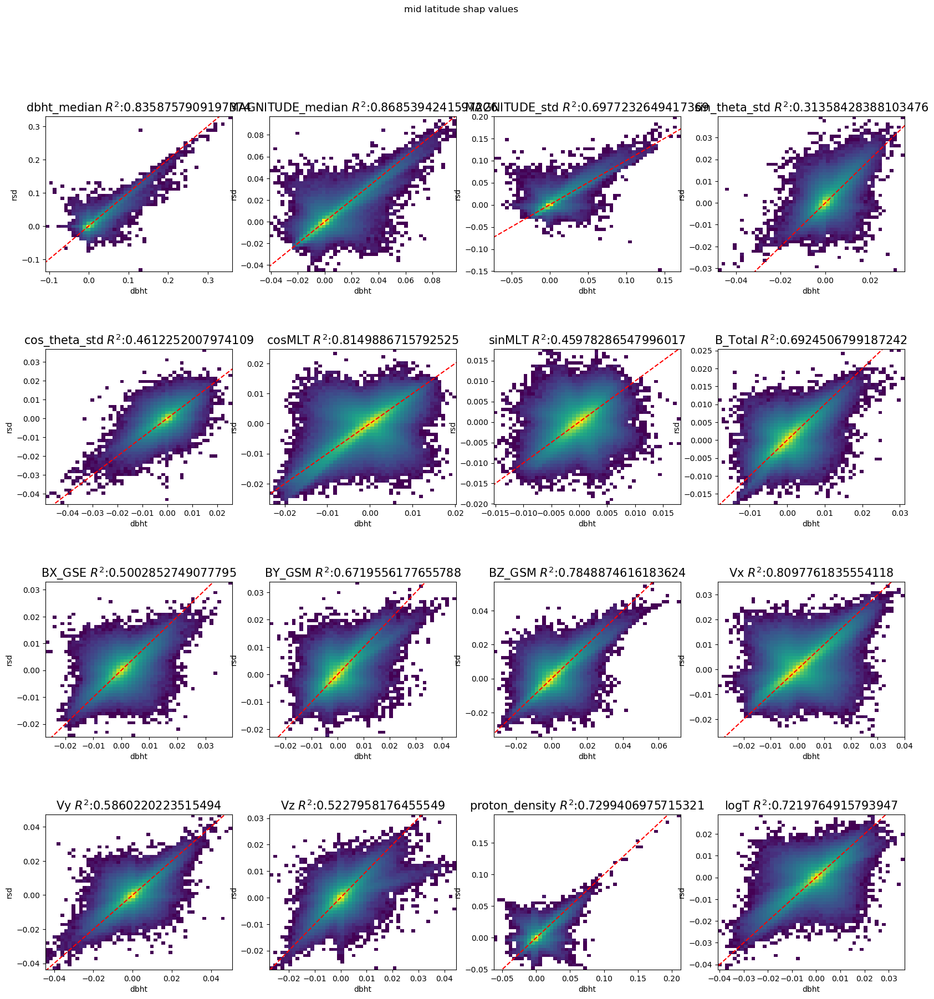

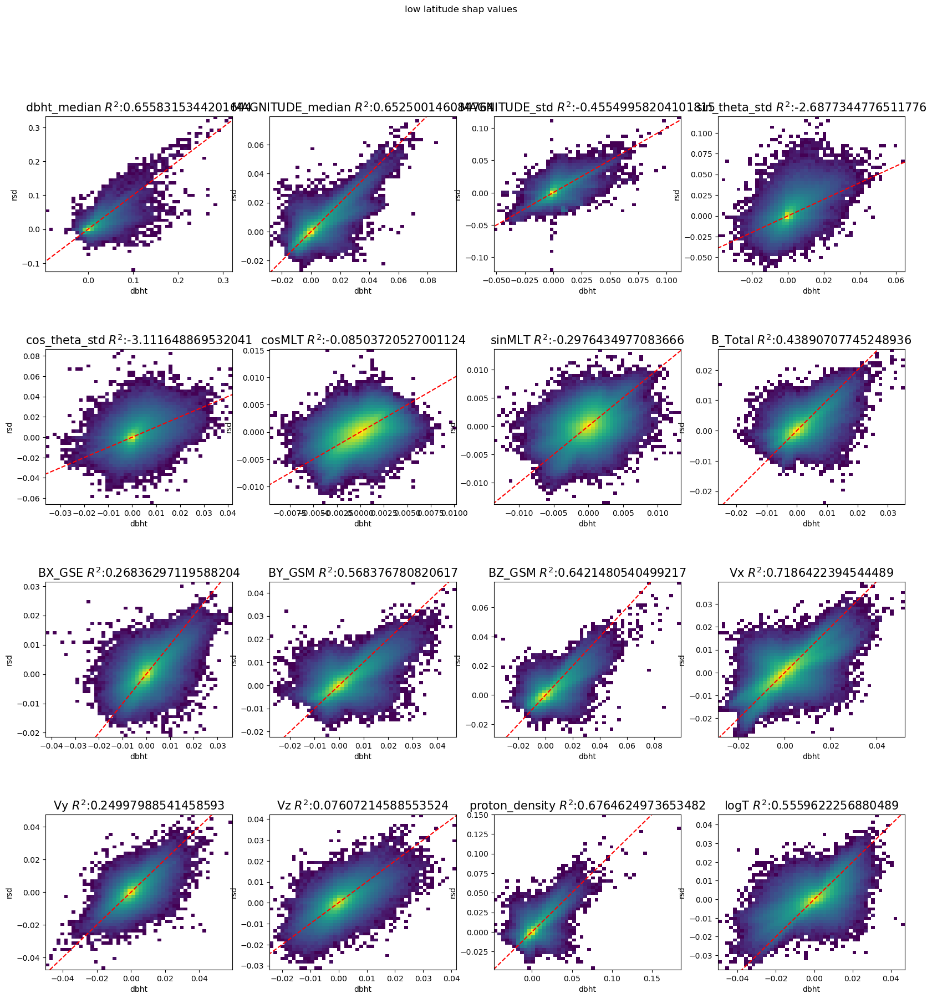

In [ ]:
# var = 'BY_GSM'
dfs = ['high', 'mid', 'low']
to_plot = 'shap_values'

for df in dfs:
	fig, axes = plt.subplots(4, 4, figsize=(20,20))
	fig.suptitle(f'{df} latitude shap values')
	for i, col in enumerate(total_dict[to_plot]['dbht'][lat].columns):
		j = i//4
		k = i%4
		axes[j,k].hist2d(total_dict[to_plot]['dbht'][df][col], total_dict[to_plot]['rsd'][df][col], bins=50, norm=mpl.colors.LogNorm())
		plot_min = min(total_dict[to_plot]['dbht'][df][col].min(), total_dict[to_plot]['rsd'][df][col].min())
		plot_max = max(total_dict[to_plot]['dbht'][df][col].max(), total_dict[to_plot]['rsd'][df][col].max())
		axes[j,k].plot([plot_min, plot_max], [plot_min,plot_max], color='r', linestyle='--')
		axes[j,k].set_xlabel('dbht')
		axes[j,k].set_ylabel('rsd')
		# axes[j,k].bar([i-60 for i in range(0,60)], total_dict[var]['rsd'][df].abs().mean(axis=0), fill=False, label='rsd', edgecolor='orange')
		axes[j,k].set_title(col+r' $R^2$:'+str(r2_score(total_dict[to_plot]['dbht'][df][col], total_dict[to_plot]['rsd'][df][col])), fontsize=15)
	plt.subplots_adjust(hspace=0.5)
	plt.savefig(f'plots/background_scatter_{df}.png')

KeyboardInterrupt: 

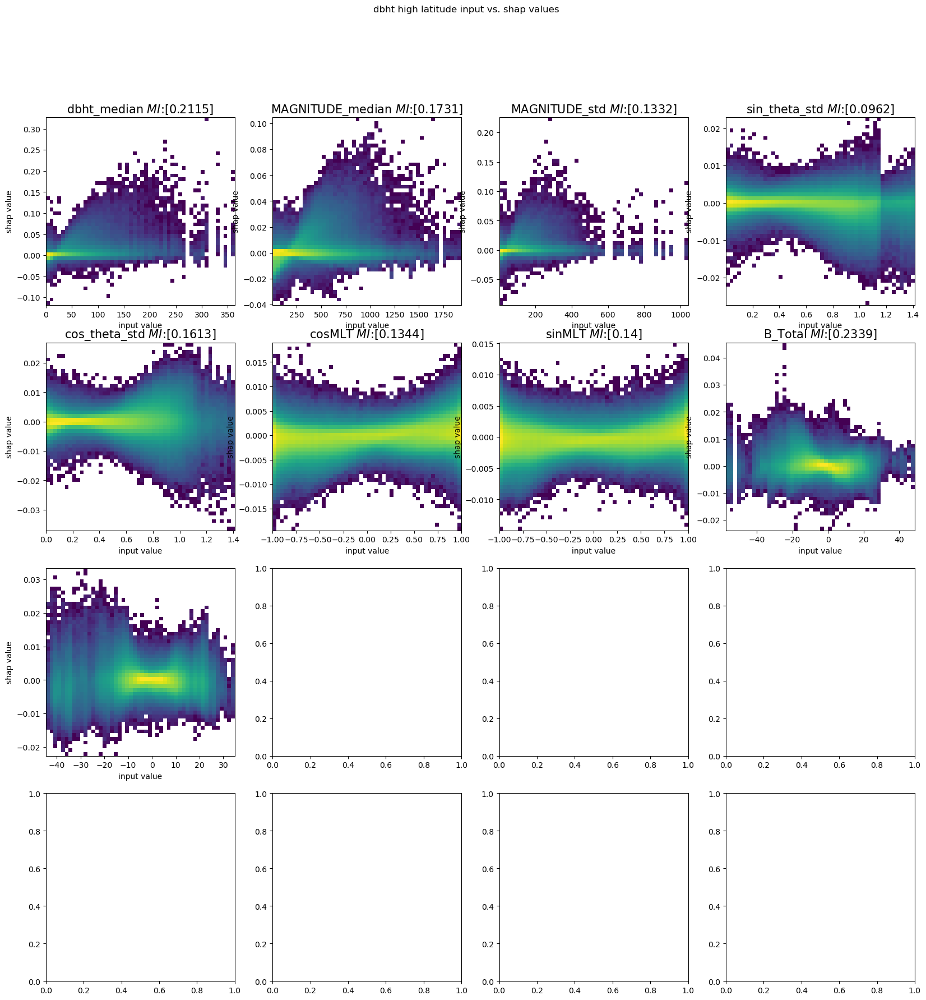

: 

In [ ]:
# var = 'BY_GSM'
dfs = ['high', 'mid', 'low']
to_plot = 'shap_values'

for df in dfs:
	fig, axes = plt.subplots(4, 4, figsize=(20,20))
	fig.suptitle(f'dbht {df} latitude input vs. shap values')
	for i, col in enumerate(total_dict['inputs']['dbht'][lat].columns):
		j = i//4
		k = i%4
		axes[j,k].hist2d(total_dict['inputs']['dbht'][df][col], total_dict['shap_values']['dbht'][df][col], bins=50, norm=mpl.colors.LogNorm())
		plot_min = min(total_dict['inputs']['dbht'][df][col].min(), total_dict['shap_values']['dbht'][df][col].min())
		plot_max = max(total_dict['inputs']['dbht'][df][col].max(), total_dict['shap_values']['dbht'][df][col].max())
		axes[j,k].set_xlabel('input value', fontsize=10)
		axes[j,k].set_ylabel('shap value', fontsize=10)
		# axes[j,k].bar([i-60 for i in range(0,60)], total_dict[var]['rsd'][df].abs().mean(axis=0), fill=False, label='rsd', edgecolor='orange')
		axes[j,k].set_title(col+r' $MI$:'+str(mutual_info_regression(total_dict['inputs']['dbht'][df][col].to_numpy().reshape(-1,1), total_dict['shap_values']['dbht'][df][col].to_numpy()).round(4)), fontsize=15)
	plt.subplots_adjust(hspace=0.5)
	plt.savefig(f'plots/background_dbht_inputs_v_shap_{df}.png')

df: high, col: dbht_median
df: high, col: MAGNITUDE_median
df: high, col: MAGNITUDE_std
df: high, col: sin_theta_std
df: high, col: cos_theta_std
df: high, col: cosMLT
df: high, col: sinMLT
df: high, col: B_Total
df: high, col: BX_GSE
df: high, col: BY_GSM
df: high, col: BZ_GSM
df: high, col: Vx
df: high, col: Vy
df: high, col: Vz
df: high, col: proton_density
df: high, col: logT
df: mid, col: dbht_median
df: mid, col: MAGNITUDE_median
df: mid, col: MAGNITUDE_std
df: mid, col: sin_theta_std
df: mid, col: cos_theta_std
df: mid, col: cosMLT
df: mid, col: sinMLT
df: mid, col: B_Total
df: mid, col: BX_GSE
df: mid, col: BY_GSM
df: mid, col: BZ_GSM
df: mid, col: Vx
df: mid, col: Vy
df: mid, col: Vz
df: mid, col: proton_density
df: mid, col: logT
df: low, col: dbht_median


KeyboardInterrupt: 

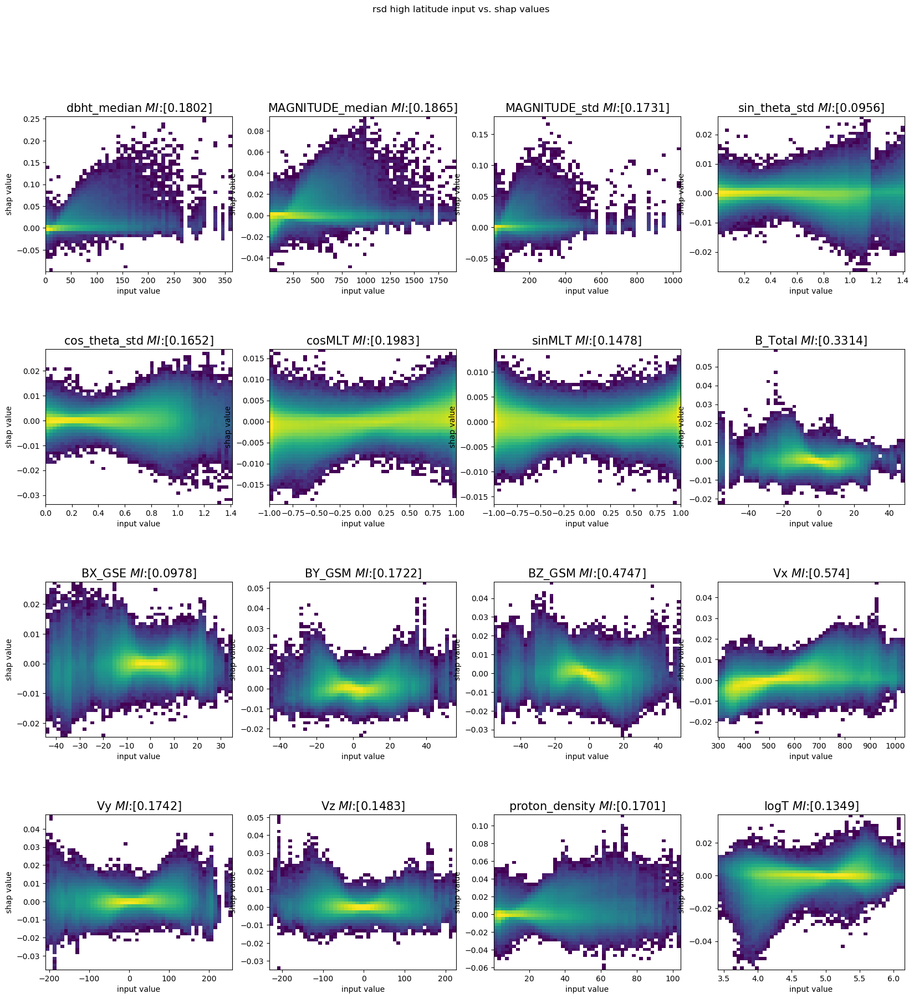

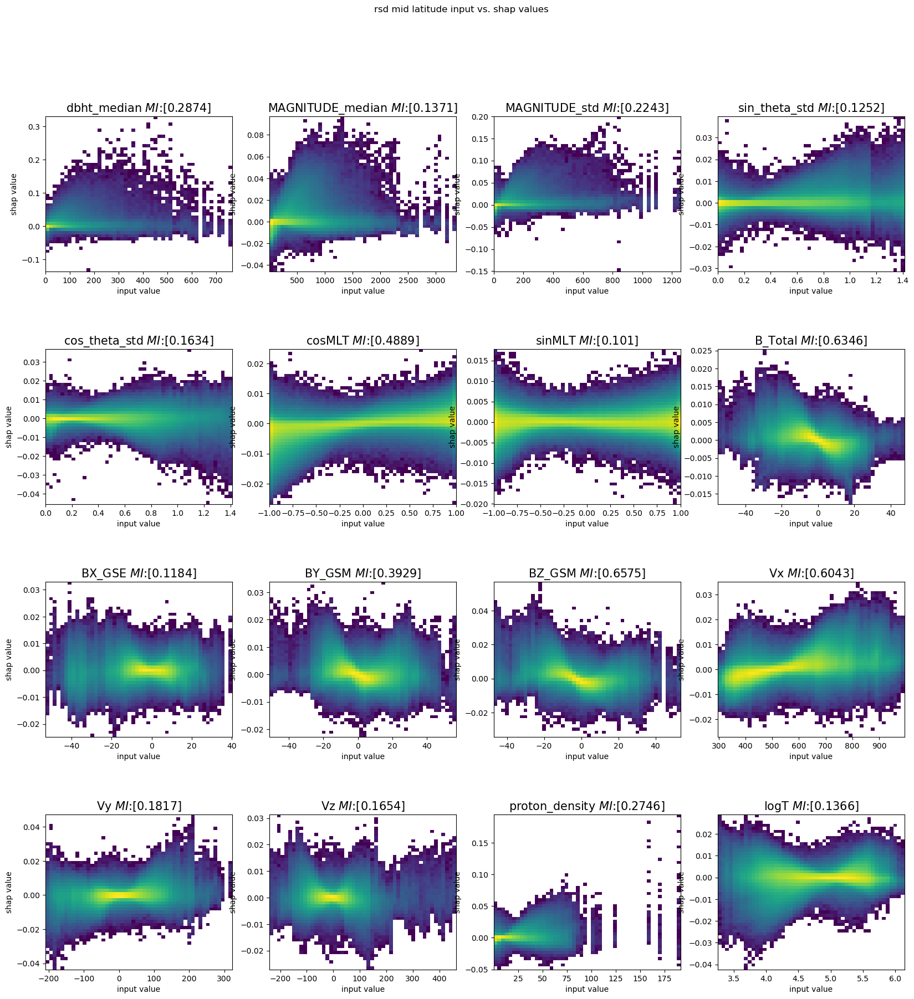

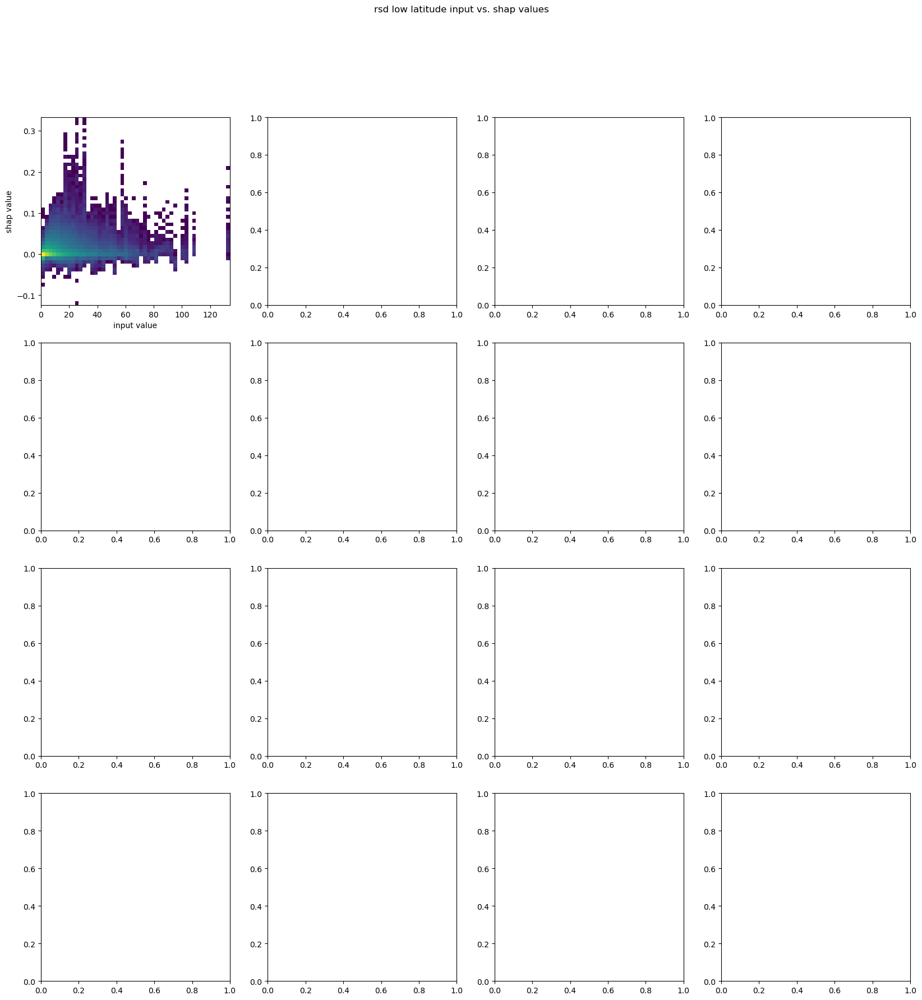

In [ ]:
# var = 'BY_GSM'
dfs = ['high', 'mid', 'low']
to_plot = 'shap_values'

for df in dfs:
	fig, axes = plt.subplots(4, 4, figsize=(20,20))
	fig.suptitle(f'rsd {df} latitude input vs. shap values')
	for i, col in enumerate(total_dict['inputs']['rsd']['low'].columns):
		print(f'df: {df}, col: {col}')
		j = i//4
		k = i%4
		axes[j,k].hist2d(total_dict['inputs']['rsd'][df][col], total_dict['shap_values']['rsd'][df][col], bins=50, norm=mpl.colors.LogNorm())
		plot_min = min(total_dict['inputs']['rsd'][df][col].min(), total_dict['shap_values']['rsd'][df][col].min())
		plot_max = max(total_dict['inputs']['rsd'][df][col].max(), total_dict['shap_values']['rsd'][df][col].max())
		axes[j,k].set_xlabel('input value', fontsize=10)
		axes[j,k].set_ylabel('shap value', fontsize=10)
		# axes[j,k].bar([i-60 for i in range(0,60)], total_dict[var]['rsd'][df].abs().mean(axis=0), fill=False, label='rsd', edgecolor='orange')
		axes[j,k].set_title(col+r' $MI$:'+str(mutual_info_regression(total_dict['inputs']['rsd'][df][col].to_numpy().reshape(-1,1), total_dict['shap_values']['rsd'][df][col].to_numpy()).round(4)), fontsize=15)
		total_dict['inputs']['rsd'][df].drop(columns=col, inplace=True)
		total_dict['shap_values']['rsd'][df].drop(columns=col, inplace=True)
		gc.collect()
	plt.subplots_adjust(hspace=0.5)
	plt.savefig(f'plots/background_rsd_inputs_v_shap_{df}.png')

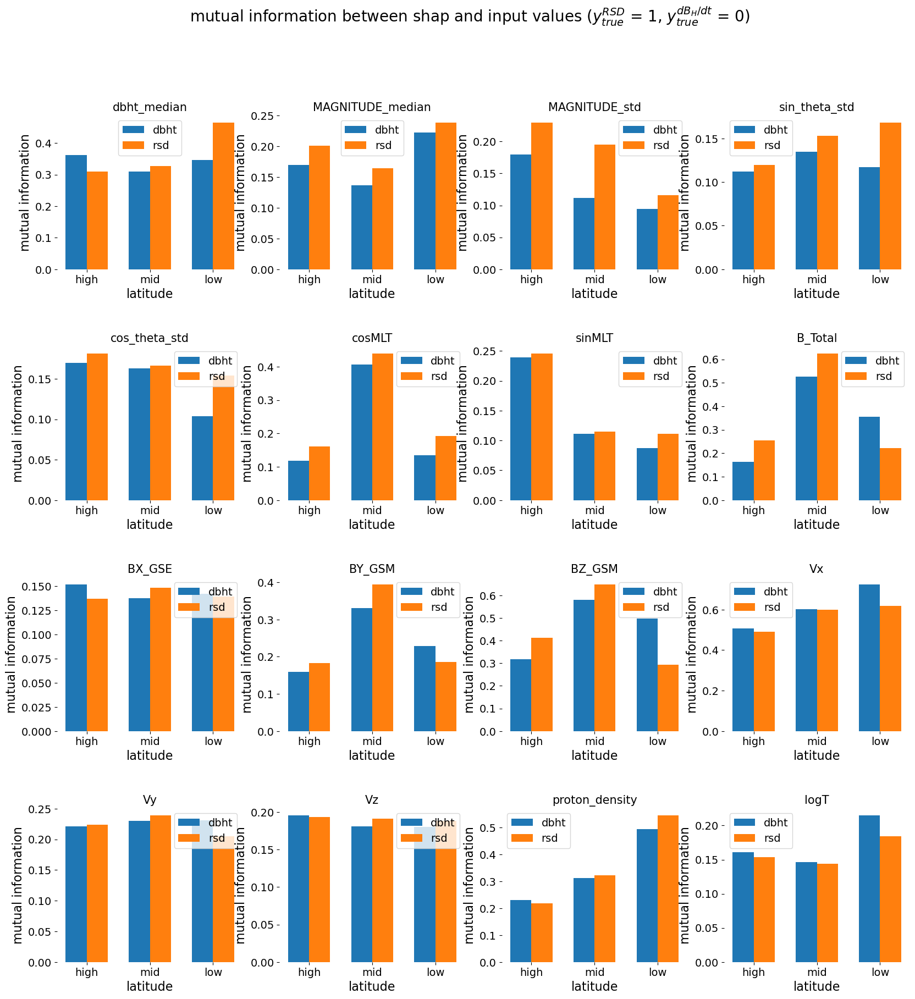

In [ ]:
dfs = ['high', 'mid', 'low']
types = ['dbht', 'rsd']

dbht_ticks = [1, 4, 7]
rsd_ticks = [2, 5, 8]
label_ticks = [1.5, 4.5, 7.5]

fig, axes = plt.subplots(4, 4, figsize=(20,20))
fig.suptitle(r'mutual information between shap and input values ($y_{true}^{RSD}$ = 1, $y_{true}^{dB_H/dt}$ = 0)', fontsize=20)
for i, col in enumerate(total_dict['inputs']['dbht'][lat].columns):
	j = i//4
	k = i%4
	ax = axes[j,k]
	dbht_mi, rsd_mi = [], []
	for df in dfs:
		dbht_mi.append(mutual_info_regression(total_dict['inputs']['dbht'][df][col].to_numpy().reshape(-1,1), total_dict['shap_values']['dbht'][df][col].to_numpy())[0])
		rsd_mi.append(mutual_info_regression(total_dict['inputs']['rsd'][df][col].to_numpy().reshape(-1,1), total_dict['shap_values']['rsd'][df][col].to_numpy())[0])
	ax.bar(dbht_ticks, dbht_mi, width=1, label='dbht')
	ax.bar(rsd_ticks, rsd_mi, width=1, label='rsd')
	ax.set_xticks(label_ticks)
	ax.set_xticklabels(dfs)
	ax.set_title(col, fontsize=15)
	ax.legend()
	ax.set_ylabel('mutual information')
	ax.set_xlabel('latitude')
plt.subplots_adjust(hspace=0.5)
plt.savefig(f'plots/mutual_information_background_shap_input.png')		


In [ ]:
# individual_cluster_to_examine = 'canadian_cluster'
features = ['dbht_median', 'MAGNITUDE_median', 'sin_theta_std', 'cos_theta_std', 'cosMLT', 'sinMLT',
				'BX_GSE', 'BY_GSM', 'BZ_GSM', 'Vx', 'Vy', 'Vz', 'proton_density', 'logT']
dataframes_to_make = ['high', 'mid', 'low']
total_dict = {'inputs':{'dbht_pos':{}, 'rsd_pos':{}, 'background':{}}, 'rsd_shap_values':{'dbht_pos':{}, 'rsd_pos':{}, 'background':{}}, 'dbht_shap_values':{'dbht_pos':{}, 'rsd_pos':{}, 'background':{}}}
with open('cluster_dict.pkl', 'rb') as f:
	cluster_dict = pickle.load(f)
for df in dataframes_to_make:
	total_dict['inputs']['dbht_pos'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['inputs']['rsd_pos'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['inputs']['background'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['rsd_shap_values']['dbht_pos'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['rsd_shap_values']['rsd_pos'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['rsd_shap_values']['background'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['dbht_shap_values']['dbht_pos'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['dbht_shap_values']['rsd_pos'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}
	total_dict['dbht_shap_values']['background'][df] = {'sum':np.zeros((16,)), 'len':np.zeros((16,))}

for clust, cluster in cluster_dict.items():
	for reg, region in cluster_dict[clust]['regions'].items():
		if (os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl')) and (os.path.exists(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2_dbht.pkl')):
			with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2.pkl', 'rb') as f:
				rsd_shap_values = pickle.load(f)
			with open(f'outputs/shap_values/swmag_region_{reg}_extended_v0-2_dbht.pkl', 'rb') as f:
				dbht_shap_values = pickle.load(f)

				cluster['regions'][reg]['MLAT'] = utils.getting_mean_lat(region['stations'])
				cluster['regions'][reg]['shap'] = {'testing_data':rsd_shap_values['testing_data']}

				# cluster['regions'][reg]['shap']['testing_data'] = shap_values['testing_data']
				cluster['regions'][reg]['shap']['rsd_shap'] = np.concatenate([rsd_shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(rsd_shap_values['shap_values']))], axis=0)
				cluster['regions'][reg]['shap']['dbht_shap'] = np.concatenate([dbht_shap_values['shap_values'][i][1][:,:,:,:] for i in range(len(dbht_shap_values['shap_values']))], axis=0)
				# cluster['regions'][key]['twins_shap']['mean_shap'] = np.concatenate([shap_values['shap_values'][i][0][0][:,:,:,:] for i in range(len(shap_values['shap_values']))], axis=0)
			# region[f'{model_type}_shap']['std_shap'] = np.concatenate([region[f'{model_type}_shap']['shap_values'][i][1][:,:,:,:] for i in range(len(region[f'{model_type}_shap']['shap_values']))], axis=0)

			# finding the places where the rsd is positive adn dbht negative and extracting those indicies
			rsd_pos_dbht_neg = np.where((rsd_shap_values['ytest'][:,1] == 1) & (dbht_shap_values['ytest'][:,1] == 0))
			rsd_neg_dbht_pos = np.where((rsd_shap_values['ytest'][:,1] == 0) & (dbht_shap_values['ytest'][:,1] == 1))

			cluster['regions'][reg]['shap']['rsd_pos_rsd_shap'] = cluster['regions'][reg]['shap']['rsd_shap'][rsd_pos_dbht_neg]
			cluster['regions'][reg]['shap']['rsd_pos_dbht_shap'] = cluster['regions'][reg]['shap']['dbht_shap'][rsd_pos_dbht_neg]
			cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = rsd_shap_values['testing_data'][rsd_pos_dbht_neg]
			cluster['regions'][reg]['shap']['dbht_pos_rsd_shap'] = cluster['regions'][reg]['shap']['rsd_shap'][rsd_neg_dbht_pos]
			cluster['regions'][reg]['shap']['dbht_pos_dbht_shap'] = cluster['regions'][reg]['shap']['dbht_shap'][rsd_neg_dbht_pos]
			cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = rsd_shap_values['testing_data'][rsd_neg_dbht_pos]

			cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
			cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
			cluster['regions'][reg]['shap']['testing_data'] = cluster['regions'][reg]['shap']['testing_data'][~np.isnan(cluster['regions'][reg]['shap']['testing_data']).any(axis=(1,2,3))]

			for key in region['shap'].keys():
				if isinstance(region['shap'][key], torch.Tensor):
					region['shap'][key] = region['shap'][key].cpu().detach().numpy()

			region['shap']['rsd_pos_rsd_shap'] = region['shap']['rsd_pos_rsd_shap'].reshape(region['shap']['rsd_pos_rsd_shap'].shape[0], region['shap']['rsd_pos_rsd_shap'].shape[2], region['shap']['rsd_pos_rsd_shap'].shape[3])
			region['shap']['rsd_pos_dbht_shap'] = region['shap']['rsd_pos_dbht_shap'].reshape(region['shap']['rsd_pos_dbht_shap'].shape[0], region['shap']['rsd_pos_dbht_shap'].shape[2], region['shap']['rsd_pos_dbht_shap'].shape[3])
			region['shap']['rsd_pos_testing_data'] = region['shap']['rsd_pos_testing_data'].reshape(region['shap']['rsd_pos_testing_data'].shape[0], region['shap']['rsd_pos_testing_data'].shape[2], region['shap']['rsd_pos_testing_data'].shape[3])
			region['shap']['dbht_pos_rsd_shap'] = region['shap']['dbht_pos_rsd_shap'].reshape(region['shap']['dbht_pos_rsd_shap'].shape[0], region['shap']['dbht_pos_rsd_shap'].shape[2], region['shap']['dbht_pos_rsd_shap'].shape[3])
			region['shap']['dbht_pos_dbht_shap'] = region['shap']['dbht_pos_dbht_shap'].reshape(region['shap']['dbht_pos_dbht_shap'].shape[0], region['shap']['dbht_pos_dbht_shap'].shape[2], region['shap']['dbht_pos_dbht_shap'].shape[3])
			region['shap']['dbht_pos_testing_data'] = region['shap']['dbht_pos_testing_data'].reshape(region['shap']['dbht_pos_testing_data'].shape[0], region['shap']['dbht_pos_testing_data'].shape[2], region['shap']['dbht_pos_testing_data'].shape[3])
			region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])
			region['shap']['rsd_shap'] = region['shap']['rsd_shap'].reshape(region['shap']['rsd_shap'].shape[0], region['shap']['rsd_shap'].shape[2], region['shap']['rsd_shap'].shape[3])
			region['shap']['dbht_shap'] = region['shap']['dbht_shap'].reshape(region['shap']['dbht_shap'].shape[0], region['shap']['dbht_shap'].shape[2], region['shap']['dbht_shap'].shape[3])
			# region['shap']['std_shap'] = region['shap']['std_shap'].reshape(region['shap']['std_shap'].shape[0], region['shap']['std_shap'].shape[2], region['shap']['std_shap'].shape[3])
			# region['shap']['testing_data'] = region['shap']['testing_data'].reshape(region['shap']['testing_data'].shape[0], region['shap']['testing_data'].shape[2], region['shap']['testing_data'].shape[3])

			rsd_pos_rsd_mean_added = np.sum(np.sum(np.abs(region['shap']['rsd_pos_rsd_shap']), axis=1),axis=1)
			rsd_pos_dbht_mean_added = np.sum(np.sum(np.abs(region['shap']['rsd_pos_dbht_shap']), axis=1),axis=1)
			region['shap']['rsd_pos_rsd_shap'] = region['shap']['rsd_pos_rsd_shap']/rsd_pos_rsd_mean_added[:,None,None]
			region['shap']['rsd_pos_dbht_shap'] = region['shap']['rsd_pos_dbht_shap']/rsd_pos_dbht_mean_added[:,None,None]

			rsd_neg_rsd_mean_added = np.sum(np.sum(np.abs(region['shap']['dbht_pos_rsd_shap']), axis=1),axis=1)
			rsd_neg_dbht_mean_added = np.sum(np.sum(np.abs(region['shap']['dbht_pos_dbht_shap']), axis=1),axis=1)
			region['shap']['dbht_pos_rsd_shap'] = region['shap']['dbht_pos_rsd_shap']/rsd_neg_rsd_mean_added[:,None,None]
			region['shap']['dbht_pos_dbht_shap'] = region['shap']['dbht_pos_dbht_shap']/rsd_neg_dbht_mean_added[:,None,None]

			rsd_mean_added = np.sum(np.sum(np.abs(region['shap']['rsd_shap']), axis=1),axis=1)
			dbht_mean_added = np.sum(np.sum(np.abs(region['shap']['dbht_shap']), axis=1),axis=1)
			region['shap']['rsd_shap'] = region['shap']['rsd_shap']/rsd_mean_added[:,None,None]
			region['shap']['dbht_shap'] = region['shap']['dbht_shap']/dbht_mean_added[:,None,None]

				# std_added = np.sum(np.sum(np.abs(region['shap']['std_shap']), axis=1),axis=1)
				# region['shap']['std_shap'] = region['shap']['std_shap']/std_added[:,None,None]

			region_scaler = scalers[reg]['swmag']
			
			lat = 'high' if cluster['regions'][reg]['MLAT'] > 68 else 'mid' if cluster['regions'][reg]['MLAT'] > 55 else 'low'

			total_dict['inputs']['dbht_pos'][lat]['sum'] = total_dict['inputs']['dbht_pos'][lat]['sum'] + np.sum(region_scaler.inverse_transform(np.concatenate(region['shap']['dbht_pos_testing_data'][:,:,:])), axis=0)
			total_dict['inputs']['rsd_pos'][lat]['sum'] = total_dict['inputs']['rsd_pos'][lat]['sum'] + np.sum(region_scaler.inverse_transform(np.concatenate(region['shap']['rsd_pos_testing_data'][:,:,:])), axis=0)
			total_dict['inputs']['background'][lat]['sum'] = total_dict['inputs']['background'][lat]['sum'] + np.sum(region_scaler.inverse_transform(np.concatenate(region['shap']['testing_data'][:,:,:])), axis=0)
			total_dict['inputs']['dbht_pos'][lat]['len'] = total_dict['inputs']['dbht_pos'][lat]['len'] + np.concatenate(region['shap']['dbht_pos_testing_data']).shape[0]
			total_dict['inputs']['rsd_pos'][lat]['len'] = total_dict['inputs']['rsd_pos'][lat]['len'] + np.concatenate(region['shap']['rsd_pos_testing_data']).shape[0]
			total_dict['inputs']['background'][lat]['len'] = total_dict['inputs']['background'][lat]['len'] + np.concatenate(region['shap']['testing_data']).shape[0]

			total_dict['rsd_shap_values']['dbht_pos'][lat]['sum'] = total_dict['rsd_shap_values']['dbht_pos'][lat]['sum'] + np.sum(np.concatenate(region['shap']['dbht_pos_rsd_shap'][:,:,:]), axis=0)
			total_dict['rsd_shap_values']['rsd_pos'][lat]['sum'] = total_dict['rsd_shap_values']['rsd_pos'][lat]['sum'] + np.sum(np.concatenate(region['shap']['rsd_pos_rsd_shap'][:,:,:]), axis=0)
			total_dict['rsd_shap_values']['background'][lat]['sum'] = total_dict['rsd_shap_values']['background'][lat]['sum'] + np.sum(np.concatenate(region['shap']['rsd_shap'][:,:,:]), axis=0)	
			total_dict['rsd_shap_values']['dbht_pos'][lat]['len'] = total_dict['rsd_shap_values']['dbht_pos'][lat]['len'] + np.concatenate(region['shap']['dbht_pos_rsd_shap']).shape[0]
			total_dict['rsd_shap_values']['rsd_pos'][lat]['len'] = total_dict['rsd_shap_values']['rsd_pos'][lat]['len'] + np.concatenate(region['shap']['rsd_pos_rsd_shap']).shape[0]
			total_dict['rsd_shap_values']['background'][lat]['len'] = total_dict['rsd_shap_values']['background'][lat]['len'] + np.concatenate(region['shap']['rsd_shap']).shape[0]

			total_dict['dbht_shap_values']['dbht_pos'][lat]['sum'] = total_dict['dbht_shap_values']['dbht_pos'][lat]['sum'] + np.sum(np.concatenate(region['shap']['dbht_pos_dbht_shap'][:,:,:]), axis=0)
			total_dict['dbht_shap_values']['rsd_pos'][lat]['sum'] = total_dict['dbht_shap_values']['rsd_pos'][lat]['sum'] + np.sum(np.concatenate(region['shap']['rsd_pos_dbht_shap'][:,:,:]), axis=0)
			total_dict['dbht_shap_values']['background'][lat]['sum'] = total_dict['dbht_shap_values']['background'][lat]['sum'] + np.sum(np.concatenate(region['shap']['dbht_shap'][:,:,:]), axis=0)
			total_dict['dbht_shap_values']['dbht_pos'][lat]['len'] = total_dict['dbht_shap_values']['dbht_pos'][lat]['len'] + np.concatenate(region['shap']['dbht_pos_dbht_shap']).shape[0]
			total_dict['dbht_shap_values']['rsd_pos'][lat]['len'] = total_dict['dbht_shap_values']['rsd_pos'][lat]['len'] + np.concatenate(region['shap']['rsd_pos_dbht_shap']).shape[0]
			total_dict['dbht_shap_values']['background'][lat]['len'] = total_dict['dbht_shap_values']['background'][lat]['len'] + np.concatenate(region['shap']['dbht_shap']).shape[0]	

		region = {}
		gc.collect()
for lat in ['high', 'mid', 'low']:
	total_dict['inputs']['dbht_pos'][lat] = total_dict['inputs']['dbht_pos'][lat]['sum']/total_dict['inputs']['dbht_pos'][lat]['len']
	total_dict['inputs']['rsd_pos'][lat] = total_dict['inputs']['rsd_pos'][lat]['sum']/total_dict['inputs']['rsd_pos'][lat]['len']
	total_dict['inputs']['background'][lat] = total_dict['inputs']['background'][lat]['sum']/total_dict['inputs']['background'][lat]['len']
	total_dict['rsd_shap_values']['dbht_pos'][lat] = total_dict['rsd_shap_values']['dbht_pos'][lat]['sum']/total_dict['rsd_shap_values']['dbht_pos'][lat]['len']
	total_dict['rsd_shap_values']['rsd_pos'][lat] = total_dict['rsd_shap_values']['rsd_pos'][lat]['sum']/total_dict['rsd_shap_values']['rsd_pos'][lat]['len']
	total_dict['rsd_shap_values']['background'][lat] = total_dict['rsd_shap_values']['background'][lat]['sum']/total_dict['rsd_shap_values']['background'][lat]['len']
	total_dict['dbht_shap_values']['dbht_pos'][lat] = total_dict['dbht_shap_values']['dbht_pos'][lat]['sum']/total_dict['dbht_shap_values']['dbht_pos'][lat]['len']
	total_dict['dbht_shap_values']['rsd_pos'][lat] = total_dict['dbht_shap_values']['rsd_pos'][lat]['sum']/total_dict['dbht_shap_values']['rsd_pos'][lat]['len']
	total_dict['dbht_shap_values']['background'][lat] = total_dict['dbht_shap_values']['background'][lat]['sum']/total_dict['dbht_shap_values']['background'][lat]['len']

Loading station NEW....
Loading station T19....
Loading station C10....
Loading station LET....
Loading station T03....
Loading station T43....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station LET....
Loading station T03....
Loading station T43....
Loading station RED....
Loading station C06....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station T43....
Loading station RED....
Loading station C06....
Loading station MEA....
Loading station T36....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station GHB....
Loading station SKT....
Loading station STF....
Loading station ATU....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station SKT....
Loading station STF....
Loading station ATU....
Loading station GDH....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station STF....
Loading station ATU....
Loading station GDH....
Loading station UMQ....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station GHB....
Loading station FHB....
Loading station NAQ....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station RVK....
Loading station LYC....
Loading station DON....
Loading station JCK....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station HAN....
Loading station MEK....
Loading station OUJ....
Loading station NUR....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station MAS....
Loading station NOR....
Loading station IVA....
Loading station KEV....
Loading station KIL....
Loading station MUO....
Loading station SOR....
Loading station TRO....
Loading station ABK....
Loading station KIR....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station MAS....
Loading station AND....
Loading station KIL....
Loading station MUO....
Loading station SOR....
Loading station TRO....
Loading station ABK....
Loading station KIR....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station MAS....
Loading station SOD....
Loading station IVA....
Loading station KEV....
Loading station KIL....
Loading station MUO....
Loading station ABK....
Loading station KIR....
Loading station PEL....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station JCK....
Loading station DON....
Loading station ABK....
Loading station KIR....
Loading station LYC....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station MAS....
Loading station AND....
Loading station KIL....
Loading station MUO....
Loading station JCK....
Loading station TRO....
Loading station ABK....
Loading station KIR....
Loading station PEL....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station ZAG....
Loading station LVV....
Loading station BEL....
Loading station VYH....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station BEL....
Loading station HLP....
Loading station SZC....
Loading station KLD....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station THY....
Loading station BDV....
Loading station WIC....
Loading station NCK....
Loading station HRB....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station ROE....
Loading station BFE....
Loading station WNG....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station BBG....
Loading station LYR....
Loading station HOR....
Loading station NAL....
Loading station HRN....
Loading station HOP....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station KUJ....
Loading station KNY....
Loading station KAG....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

Loading station MMB....
Loading station ASB....
Loading station RIK....
Loading station MSR....


/tmp/ipykernel_4051048/2140109968.py:47: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['rsd_pos_testing_data'] = cluster['regions'][reg]['shap']['rsd_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['rsd_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:48: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /opt/conda/conda-bld/pytorch_1704987288773/work/aten/src/ATen/native/IndexingUtils.h:27.)
  cluster['regions'][reg]['shap']['dbht_pos_testing_data'] = cluster['regions'][reg]['shap']['dbht_pos_testing_data'][~np.isnan(cluster['regions'][reg]['shap']['dbht_pos_testing_data']).any(axis=(1,2,3))]
/tmp/ipykernel_4051048/2140109968.py:49: UserWarning: indexing with dtype t

(16,)
(16,)


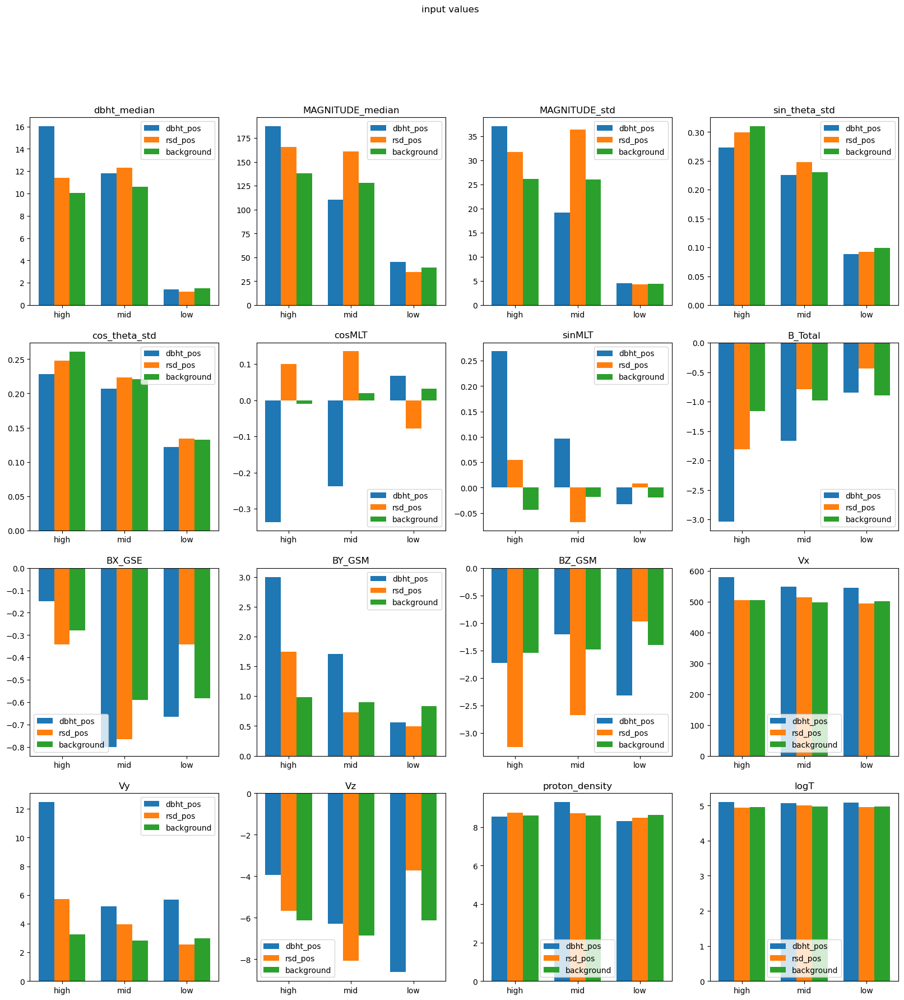

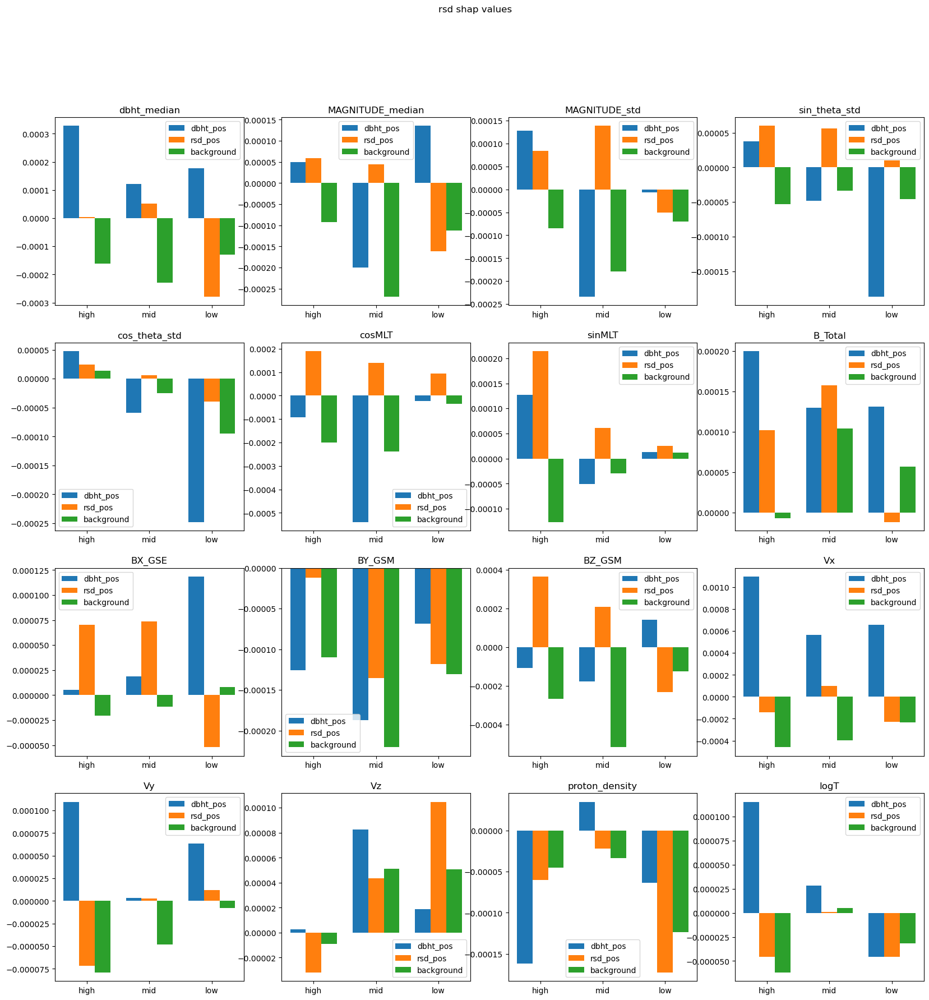

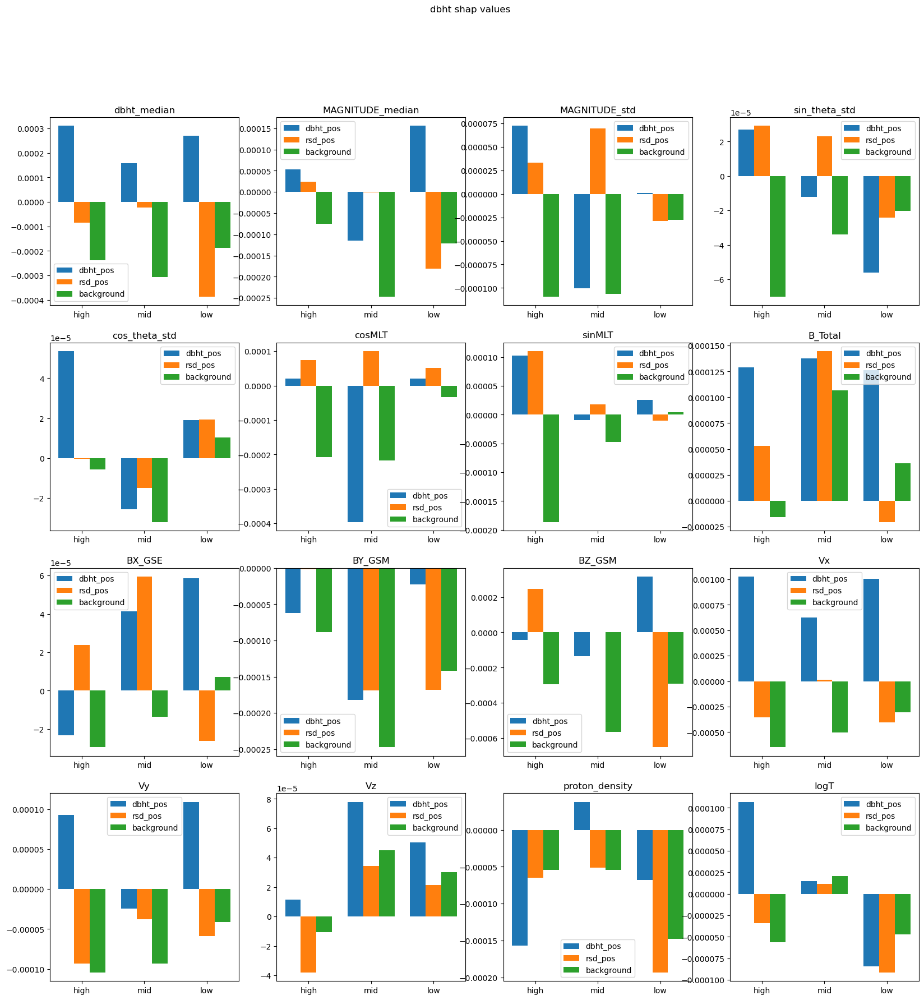

In [ ]:
dbht_ticks = [1, 5, 9]
rsd_ticks = [2, 6, 10]
background_ticks = [3, 7, 11]
print(total_dict['inputs']['background']['high'].shape)
fig, axes = plt.subplots(4, 4, figsize=(20,20))
fig.suptitle(f'input values')
for i, col in enumerate(features):
	j = i//4
	k = i%4
	axes[j,k].bar(dbht_ticks, [total_dict['inputs']['dbht_pos']['high'][i], total_dict['inputs']['dbht_pos']['mid'][i], total_dict['inputs']['dbht_pos']['low'][i]], width=1, label='dbht_pos')
	axes[j,k].bar(rsd_ticks, [total_dict['inputs']['rsd_pos']['high'][i], total_dict['inputs']['rsd_pos']['mid'][i], total_dict['inputs']['rsd_pos']['low'][i]], width=1, label='rsd_pos')
	axes[j,k].bar(background_ticks, [total_dict['inputs']['background']['high'][i], total_dict['inputs']['background']['mid'][i], total_dict['inputs']['background']['low'][i]], width=1, label='background')
	axes[j,k].set_xticks(rsd_ticks)
	axes[j,k].set_xticklabels(['high', 'mid', 'low'])
	axes[j,k].set_title(col)
	axes[j,k].legend()

plt.savefig(f'plots/input_values.png')
print(total_dict['rsd_shap_values']['background']['high'].shape)
fig, axes = plt.subplots(4, 4, figsize=(20,20))
fig.suptitle(f'rsd shap values')
for i, col in enumerate(features):
	j = i//4
	k = i%4
	axes[j,k].bar(dbht_ticks, [total_dict['rsd_shap_values']['dbht_pos']['high'][i], total_dict['rsd_shap_values']['dbht_pos']['mid'][i], total_dict['rsd_shap_values']['dbht_pos']['low'][i]], width=1, label='dbht_pos')
	axes[j,k].bar(rsd_ticks, [total_dict['rsd_shap_values']['rsd_pos']['high'][i], total_dict['rsd_shap_values']['rsd_pos']['mid'][i], total_dict['rsd_shap_values']['rsd_pos']['low'][i]], width=1, label='rsd_pos')
	axes[j,k].bar(background_ticks, [total_dict['rsd_shap_values']['background']['high'][i], total_dict['rsd_shap_values']['background']['mid'][i], total_dict['rsd_shap_values']['background']['low'][i]], width=1, label='background')
	axes[j,k].set_xticks(rsd_ticks)
	axes[j,k].set_xticklabels(['high', 'mid', 'low'])
	axes[j,k].set_title(col)
	axes[j,k].legend()

plt.savefig(f'plots/rsd_shap_values.png')

fig, axes = plt.subplots(4, 4, figsize=(20,20))
fig.suptitle(f'dbht shap values')
for i, col in enumerate(features):
	j = i//4
	k = i%4
	axes[j,k].bar(dbht_ticks, [total_dict['dbht_shap_values']['dbht_pos']['high'][i], total_dict['dbht_shap_values']['dbht_pos']['mid'][i], total_dict['dbht_shap_values']['dbht_pos']['low'][i]], width=1, label='dbht_pos')
	axes[j,k].bar(rsd_ticks, [total_dict['dbht_shap_values']['rsd_pos']['high'][i], total_dict['dbht_shap_values']['rsd_pos']['mid'][i], total_dict['dbht_shap_values']['rsd_pos']['low'][i]], width=1, label='rsd_pos')
	axes[j,k].bar(background_ticks, [total_dict['dbht_shap_values']['background']['high'][i], total_dict['dbht_shap_values']['background']['mid'][i], total_dict['dbht_shap_values']['background']['low'][i]], width=1, label='background')
	axes[j,k].set_xticks(rsd_ticks)
	axes[j,k].set_xticklabels(['high', 'mid', 'low'])
	axes[j,k].set_title(col)
	axes[j,k].legend()

plt.savefig(f'plots/dbht_shap_values.png')

In [ ]:
plotting_df = pd.DataFrame()
mlt_arr, actual_arr, mlat_arr = [], [], []
for cluster in cluster_dict.keys():
	for reg, region in cluster_dict[cluster]['regions'].items():

		df = utils.loading_supermag(region['mlt_station'])
		dates = region['swmag_shap']['Date_UTC']

		cluster_dict[cluster]['regions'][reg]['test_mlt'] = df[df.index.isin(dates['Date_UTC'])]['MLT']
		if 'dates' in results[reg]['swmag_results'].keys():
			results[reg]['swmag_results'].set_index('dates', inplace=True)
		results[reg]['swmag_results']['MLT'] = cluster_dict[cluster]['regions'][reg]['test_mlt']
		results[reg]['swmag_results']['error'] = np.abs(results[reg]['swmag_results']['predicted_mean'] - results[reg]['swmag_results']['actual'])
		results[reg]['swmag_results']['mlat'] = cluster_dict[cluster]['regions'][reg]['mean_lat']
		plotting_df = pd.concat([plotting_df, results[reg]['swmag_results']], axis=0)

		unbroadcasted_mlt = results[reg]['swmag_results']['MLT'].to_numpy()
		unbroadcasted_actual = results[reg]['swmag_results']['actual'].to_numpy()
		unbroadcasted_mlat = results[reg]['swmag_results']['mlat'].to_numpy()

		concatenated_mlt = np.concatenate([np.concatenate([unbroadcasted_mlt[:,np.newaxis]]*30, axis=1)[:,:,np.newaxis]]*14, axis=2)
		concatenated_actual = np.concatenate([np.concatenate([unbroadcasted_actual[:,np.newaxis]]*30, axis=1)[:,:,np.newaxis]]*14, axis=2)

		# mlt_arr.append(np.concatenate(concatenated_mlt, axis=0))
		# actual_arr.append(np.concatenate(concatenated_actual, axis=0))

		mlt_arr.append(np.repeat(results[reg]['swmag_results']['MLT'].to_numpy(), 30))
		actual_arr.append(np.repeat(results[reg]['swmag_results']['actual'].to_numpy(), 30))
		mlat_arr.append(np.repeat(results[reg]['swmag_results']['mlat'].to_numpy(), 30))

mlt_arr = np.concatenate(mlt_arr, axis=0)
actual_arr = np.concatenate(actual_arr, axis=0)
mlat_arr = np.concatenate(mlat_arr, axis=0)
time_history = np.concatenate((np.array([30-i for i in range(0,30)]),)*(len(mlt_arr)//30), axis=0)

# mlt_df = pd.DataFrame(mlt_arr, columns=shap_values['features'])
# actual_df = pd.DataFrame(actual_arr, columns=shap_values['features'])

plotting_mlt_mlat_shap_mean = mean_shap_df.copy()
plotting_mlt_mlat_shap_mean['MLT'] = mlt_arr
plotting_mlt_mlat_shap_mean['mlat'] = mlat_arr
plotting_mlt_mlat_shap_mean['actual'] = actual_arr
plotting_mlt_mlat_shap_mean['time_history'] = time_history


Loading station NEW....
Loading station LET....
Loading station MEA....
Loading station STF....
Loading station GDH....
Loading station GDH....
Loading station NAQ....
Loading station LYC....
Loading station NUR....
Loading station ABK....
Loading station ABK....
Loading station ABK....
Loading station ABK....
Loading station ABK....
Loading station BEL....
Loading station BEL....
Loading station HRB....
Loading station WNG....
Loading station HRN....
Loading station KNY....
Loading station MMB....
Loading station CMO....
Loading station PIN....
Loading station BLC....


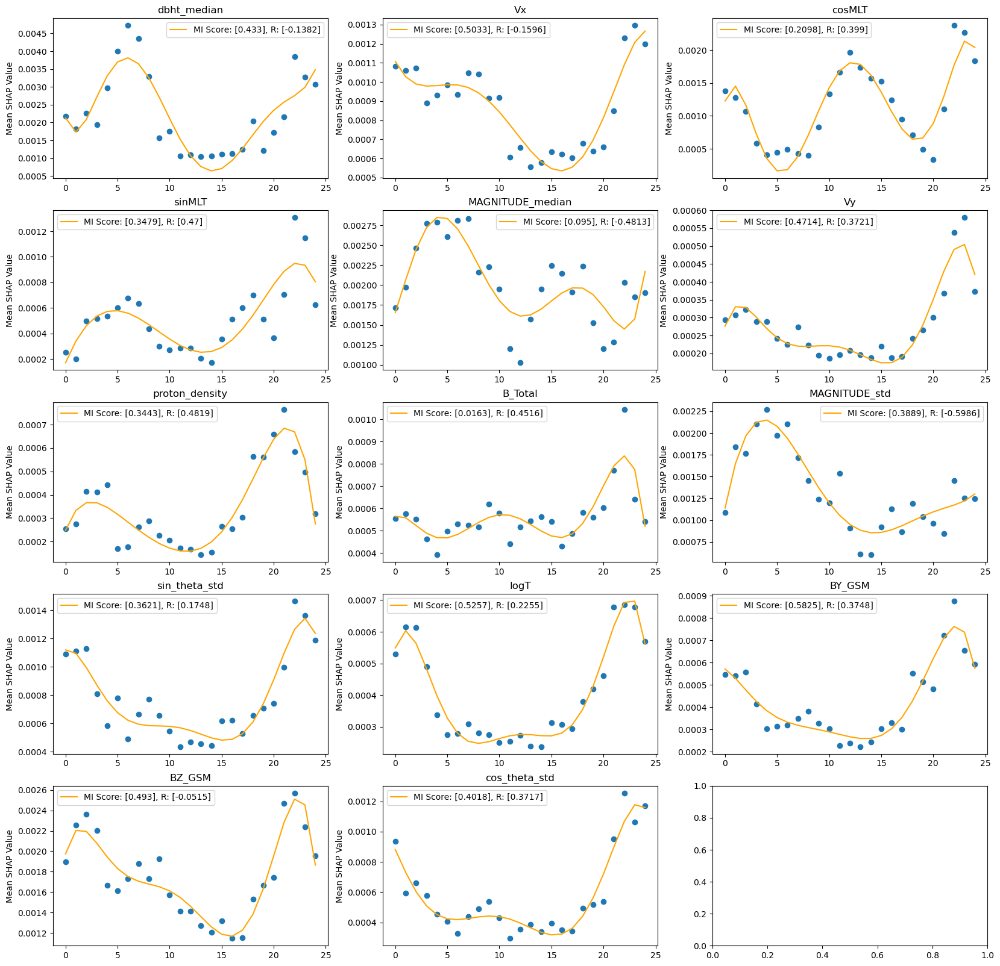

: 

In [ ]:
specific_mlat = 67
specific_mlt = None
absolute = True
aggregation_method = 'mean'
time_history = False
cut_mlt = False
if not cut_mlt:
	round_mlt = True
else:
	round_mlt = False
mlt_cuts = 1000
mlt_bins = np.linspace(0,24,mlt_cuts+1).tolist()
specific_plotting_df = plotting_mlt_mlat_shap_mean.copy()
specific_plotting_df['mlat'] = specific_plotting_df['mlat'].astype(int)

title = f'{aggregation_method}_shap_'

if round_mlt:
	specific_plotting_df['MLT'] = specific_plotting_df['MLT'].round(0)
elif cut_mlt:
	specific_plotting_df['MLT_bins'] = pd.cut(specific_plotting_df['MLT'], mlt_bins, labels=mlt_bins[:-1], include_lowest=True)
	# specific_plotting_df = specific_plotting_df.groupby('MLT_bins').agg(aggregation_method)
else:
	raise ValueError('Must specify either round_mlt or cut_mlt')

if specific_mlat is not None:
	specific_plotting_df = specific_plotting_df[specific_plotting_df['mlat']==specific_mlat]
	title += f'{specific_mlat}_'

if specific_mlt is not None:
	specific_plotting_df = specific_plotting_df[specific_plotting_df['MLT']==specific_mlt]
	title += f'{specific_mlt}_'

if time_history:
	if specific_mlat is None and specific_mlt is None:
		raise ValueError('Cannot plot time history without specifying MLAT or MLT')
	if 'MLT_bins' in specific_plotting_df.columns:
		raise ValueError('Cannot plot time history with MLT bins. Change to int rounded MLT')
	specific_plotting_df = specific_plotting_df.groupby('time_history').agg(aggregation_method)
	title += 'time_history_'

if not time_history:
	if (specific_mlat is not None and specific_mlt is not None):
		raise ValueError('Cannot plot with specifying both MLAT and MLT')

	if absolute:
		specific_plotting_df = specific_plotting_df.apply(lambda x: x.abs() if (x.dtype=='float') or (x.dtype=='int') else x)
		if 'MLT_bins' in specific_plotting_df.columns:
			specific_plotting_df = specific_plotting_df.groupby('MLT_bins').agg(aggregation_method)
		else:
			specific_plotting_df = specific_plotting_df.groupby('MLT').agg(aggregation_method)
	else:
		if 'MLT_bins' in specific_plotting_df.columns:
			specific_plotting_df = specific_plotting_df.groupby('MLT_bins').agg(aggregation_method)
		else:
			specific_plotting_df = specific_plotting_df.groupby('MLT').agg(aggregation_method)
	title += 'absolute_shap' if absolute else 'relative_shap'

fig, axes = plt.subplots(5,3,figsize=(20,20))
for i, var in enumerate(specific_plotting_df.columns):
	if var == 'actual' or var == 'MLT' or var == 'mlat' or var == 'error' or var == 'time_history':
		continue
	j = i % 5
	k = i % 3
	mlt = np.array(specific_plotting_df.index)
	shap = specific_plotting_df[var].to_numpy()
	z = np.polyfit(mlt, shap, 6)
	p = np.poly1d(z)
	MI_x = mlt.reshape(-1,1)
	MI_y = shap
	axes[j,k].plot(mlt, p(mlt), color='orange', label=f'MI Score: {mutual_info_regression(MI_x, MI_y).round(4)}, R: {r_regression(MI_x, MI_y).round(4)}')
	axes[j,k].scatter(mlt, shap)
	axes[j,k].set_ylabel('Mean SHAP Value')
	axes[j,k].set_title(f'{var}')
	axes[j,k].legend()
plt.savefig(f'plots/mean_{title}.png')